# Attempting to correlate Keq data (both experimental and predicted from the numerical Derjaguin model)
- Are the experimental data correlated with protein structural attributes?
- Why is the electrostatics model overpredicting the retention of ADH and CAT? Can it be justified by the spherical charge distributions used in the model?

In [3]:
import platform
from pathlib import Path

import os
import subprocess
import time

import numpy as np
import scipy
from scipy import optimize, interpolate
import pandas as pd # I added as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

from addict import Dict
import json

# Temporary files for simulation objects
import tempfile
tempfile.tempdir = os.path.join(Path.home())

# IPython
from IPython.core.display import display, HTML, clear_output
display(HTML("<style>.container { width:100% !important; }</style>"))
from IPython.display import Image
from ipywidgets import interact, interactive
import ipywidgets as widgets

import copy
from biopandas.pdb import PandasPdb

import math

In [4]:
def my_fit_function_ln_keq_2(tis, a, b):
    return np.log(a*tis**b)

def meta_correlation(a, c, d):
    return c*np.log(a) + d

def get_meta_residuals(x, a_vals, b_vals):
    c = x[0]
    d = x[1]
    return b_vals - (c*np.log(a_vals) + d)

# Boneyard

In [414]:
fit_param_res = []
for i, (data_set, resin, protein, pH) in enumerate(pairs):
    df = df_all_k[(df_all_k.resin==resin) & (df_all_k.protein==protein) &\
                  (df_all_k.pH == pH) & (df_all_k.data_set==data_set)]
    
    if len(df) > 2:
        fit_params = optimize.curve_fit(my_three_param_model, df.tis_mM, 
                                        np.log(df.kprime), p0=(-1e4, 1e-3, 1e4), maxfev=20000)
        a_my, b_my, c_my = fit_params[0][0], fit_params[0][1], fit_params[0][2]

        fit_param_res.append([data_set, resin, protein, pH, np.log(a_my), b_my, c_my])
        
df_three_params_2 = pd.DataFrame(fit_param_res, columns=['data_set', 'resin', 'protein', 
                               'pH', 'a_my', 'b_my', 'c_my']) 

/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in log
  # This is added back by InteractiveShellApp.init_path()
/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in log
  # This is added back by InteractiveShellApp.init_path()
/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in log
  # This is added back by InteractiveShellApp.init_path()
/home/chase/anaconda3/lib/python3.7/site-packages/scipy/optimize/minpack.py:829: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)
/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in log
  # This is added back by InteractiveShellApp.init_path()
/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning

/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in log
  # This is added back by InteractiveShellApp.init_path()
/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in log
  # This is added back by InteractiveShellApp.init_path()
/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in log
  # This is added back by InteractiveShellApp.init_path()
/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in log
  # This is added back by InteractiveShellApp.init_path()
/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in log
  # This is added back by InteractiveShellApp.init_path()
/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWa

/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in log
  # This is added back by InteractiveShellApp.init_path()
/home/chase/anaconda3/lib/python3.7/site-packages/scipy/optimize/minpack.py:829: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)
/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in log
  # This is added back by InteractiveShellApp.init_path()
/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in log
  # This is added back by InteractiveShellApp.init_path()
/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in log
  # This is added back by InteractiveShellApp.init_path()
/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning

/home/chase/anaconda3/lib/python3.7/site-packages/scipy/optimize/minpack.py:829: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)
/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in log
  # This is added back by InteractiveShellApp.init_path()
/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in log
  # This is added back by InteractiveShellApp.init_path()
/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in log
  # This is added back by InteractiveShellApp.init_path()
/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in log
  # This is added back by InteractiveShellApp.init_path()
/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning

/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in log
  # This is added back by InteractiveShellApp.init_path()
/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in log
  # This is added back by InteractiveShellApp.init_path()
/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in log
  # This is added back by InteractiveShellApp.init_path()
/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in log
  # This is added back by InteractiveShellApp.init_path()
/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in log
  # This is added back by InteractiveShellApp.init_path()
/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWa

In [416]:
df_three_params_2

,data_set,resin,protein,pH,a_my,b_my,c_my
0,DePhillips,CM Spherodex M,alpha-chymotrypsinogen A,7.0,NaN,0.423600,45.357948
1,Staby,Fractogel EMD DEAE (M),anti-FVII mAb,8.0,NaN,0.003755,11552.597256
2,Staby,Heparin Ceramic HyperD M,anti-FVII mAb,5.5,NaN,0.002391,11297.531061
3,Staby,SP Sepharose FF,lysozyme,5.5,NaN,0.002734,11562.197299
4,Staby,MacroPrep 25S,anti-FVII mAb,5.5,NaN,0.003323,12492.920027
...,...,...,...,...,...,...,...
200,DePhillips,SP-650 M,cytochrome c,7.0,NaN,0.000774,27029.362858
201,Staby,Q Sepharose XL,anti-FVII mAb,8.0,NaN,0.004161,13998.160920
202,DePhillips,CM Sepharose FF,cytochrome c,7.0,NaN,0.000985,21324.207684
203,Staby,Q Sepharose FF,myoglobin,9.0,NaN,0.001026,18529.097661


In [397]:
df_three_params[(df_three_params.protein=='catalase')]

,data_set,resin,protein,pH,a_yam,b_yam,c_yam
57,mine,Poros XQ,catalase,7.0,9.105337e+11,-5.223506,0.090193
69,mine,Poros 50 HQ,catalase,7.0,2.397143e+09,-4.157374,0.102638
157,mine,Capto Q,catalase,7.0,1.424994e+05,-2.117339,-1.187091


In [401]:
df = df_all_k[(df_all_k.resin=='SP Sepharose FF') & (df_all_k.protein=='lysozyme') &\
              (df_all_k.pH == 7.0) & (df_all_k.data_set=='mine')]



function = yam_three_param_model
fit = optimize.least_squares(get_three_param_resid, x0=[1, 0, 0],
                             args=(df.tis_mM, df.kprime, function))
a, b, c = fit.x[0], fit.x[1], fit.x[2]
tis_vals = np.linspace(min(df.tis_mM), max(df.tis_mM))
kprime_fit = [np.exp(function(tis, a, b, c)) for tis in tis_vals]

/home/chase/anaconda3/lib/python3.7/site-packages/pandas/core/series.py:726: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


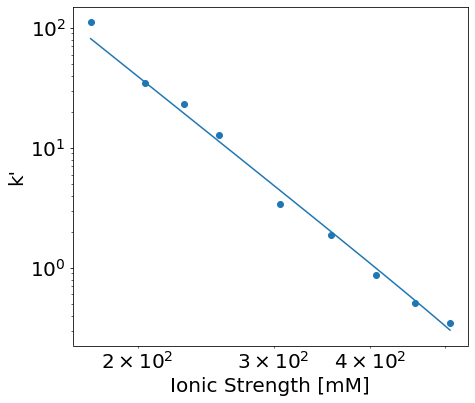

In [402]:
params = {'font.weight':'normal', 'font.size':20, 'figure.autolayout':True}
plt.rcParams.update(params)
fig, ax = plt.subplots()
fig.set_size_inches(7, 6, forward=True)
fig.patch.set_alpha(1.0)
ax.set_xlabel('Ionic Strength [mM]')
ax.set_ylabel("k'")

ax.scatter(df.tis_mM, df.kprime)
ax.loglog(tis_vals, kprime_fit)

In [403]:
np.linalg.norm(np.array(get_three_param_resid(fit.x, df.tis_mM, df.kprime, function)))

0.5062455157748063

In [421]:
function = my_three_param_model
fit_params = optimize.curve_fit(function, df.tis_mM, np.log(df.kprime), 
                                p0=(-1, 1, -0.1), maxfev=20000)
a, b, c = fit_params[0][0], fit_params[0][1], fit_params[0][2]
tis_vals = np.linspace(min(df.tis_mM), max(df.tis_mM))
kprime_fit = [np.exp(function(tis, a, b, c)) for tis in tis_vals]

fit_params

(array([-1.66014297e+04,  1.26840897e-03,  1.66393766e+04]),
 array([[ 1.14879250e+15,  8.75726951e+07, -1.14879545e+15],
        [ 8.75726951e+07,  6.67568508e+00, -8.75729205e+07],
        [-1.14879545e+15, -8.75729205e+07,  1.14879841e+15]]))

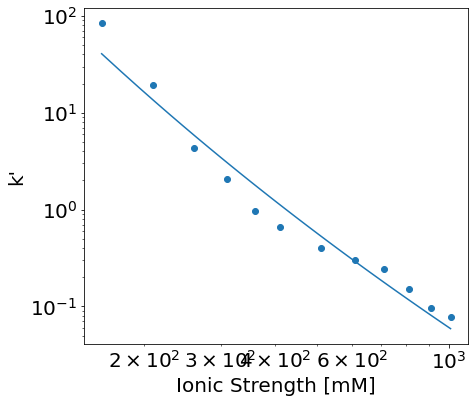

In [422]:
params = {'font.weight':'normal', 'font.size':20, 'figure.autolayout':True}
plt.rcParams.update(params)
fig, ax = plt.subplots()
fig.set_size_inches(7, 6, forward=True)
fig.patch.set_alpha(1.0)
ax.set_xlabel('Ionic Strength [mM]')
ax.set_ylabel("k'")

ax.scatter(df.tis_mM, df.kprime)
ax.loglog(tis_vals, kprime_fit)

In [423]:
x = [a, b, c]
np.linalg.norm(np.array(get_three_param_resid(x, df.tis_mM, df.kprime, function)))

1.3910737327504743

In [335]:
# fit_param_res = []
# for i, (data_set, resin, protein, pH) in enumerate(pairs):
#     df = df_all_k[(df_all_k.resin==resin) & (df_all_k.protein==protein) &\
#                   (df_all_k.pH == pH) & (df_all_k.data_set==data_set)]
    
#     if len(df) > 2:
# #         fit = optimize.least_squares(get_three_param_resid, x0=[1, 0, 0],
# #                                      args=(df.tis_mM, df.kprime, yam_three_param_model))
# #         a_yam, b_yam, c_yam = fit.x[0], fit.x[1], fit.x[2]

#         fit_params = optimize.curve_fit(my_three_param_model, df.tis_mM, 
#                                         np.log(df.kprime), p0=(0.1, 50, -1), maxfev=20000)
#         a_my, b_my, c_my = fit_params[0][0], fit_params[0][1], fit_params[0][2]

#         fit_param_res.append([data_set, resin, protein, pH, np.log(a_my), b_my, c_my])
    
# # df_three_params = pd.DataFrame(fit_param_res, columns=['data_set', 'resin', 'protein', 
# #                                'pH', 'a_yam', 'b_yam', 'c_yam', 'ln(a_my)', 'b_my', 'c_my') 
# df_three_params = pd.DataFrame(fit_param_res, columns=['data_set', 'resin', 'protein', 
#                                'pH', 'a_my', 'b_my', 'c_my']) 

# Notes

- My isocratic data
    - dfs_k contains my isocratic data
    - df_k_params contains correlation parameters for my isocratic data
- DePhillips isocratic data
    - dfs_dephillips contains DePhillips Keq data
    - dfs_k_dephillips contains DePhillips k' data (obtained by converting Keq to k' with phase ratios)
    - df_dephil_k_params contains correlation parameters for DePhillips k' data 



# My k' data


In [3]:
k_files = os.listdir('./kprime_data/')
k_files.sort()

dfs_k = {}
for file in k_files:
    dfs_k[file] = pd.read_csv(f'./kprime_data/{file}')

In [4]:
temp = []

for file in k_files:
    df = dfs_k[file]
    fit_params = optimize.curve_fit(my_fit_function_ln_keq_2, df['IS (M)']*1e3,
                      np.log(df['k_prime']), p0=(1, -50), maxfev=10000)
    temp.append([file, fit_params[0][0], fit_params[0][1]])

df_k_params = pd.DataFrame(temp, columns=['file', 'a', 'b'])

for i, icont in df_k_params.iterrows():
    f = icont['file']
    df_k_params.at[i, 'resin'] = f[:f.find('_')]
    df_k_params.at[i, 'protein'] = f[f.find('_')+1:f.find('_')+4]
    df_k_params.at[i, 'pH'] = f[f.find('.')-1]

df_k_params.sort_values(by=['resin', 'protein', 'pH'], inplace=True)
df_k_params.reset_index(drop=True, inplace=True)
df_k_params

,file,a,b,resin,protein,pH
0,caq_adh_pH_7.csv,2.455905e+03,-1.531318,caq,adh,7
1,caq_blg_pH_7.csv,1.246155e+16,-6.326865,caq,blg,7
2,caq_cat_pH_7.csv,1.282716e+12,-5.500367,caq,cat,7
3,caq_ova_pH_7.csv,3.901368e+12,-5.166430,caq,ova,7
4,phq_adh_pH_7.csv,1.372885e+07,-3.514624,phq,adh,7
5,phq_blg_pH_7.csv,1.661857e+18,-7.261087,phq,blg,7
6,phq_cat_pH_7.csv,5.828499e+08,-3.854670,phq,cat,7
7,phq_ova_pH_7.csv,3.209161e+10,-4.463772,phq,ova,7
8,pxq_adh_pH_7.csv,4.560431e+07,-3.571804,pxq,adh,7
9,pxq_blg_pH_7.csv,2.621053e+18,-7.181837,pxq,blg,7


/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later


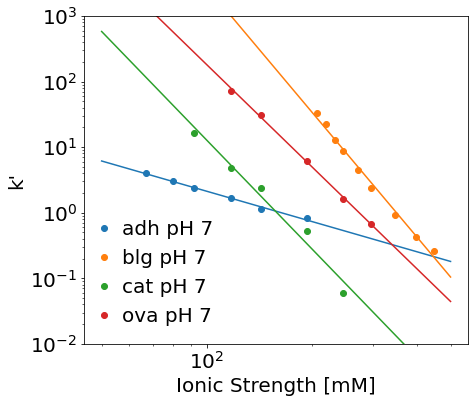

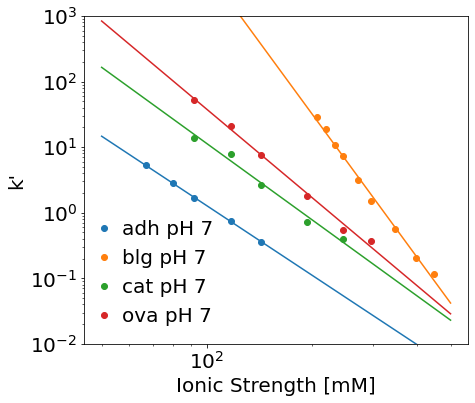

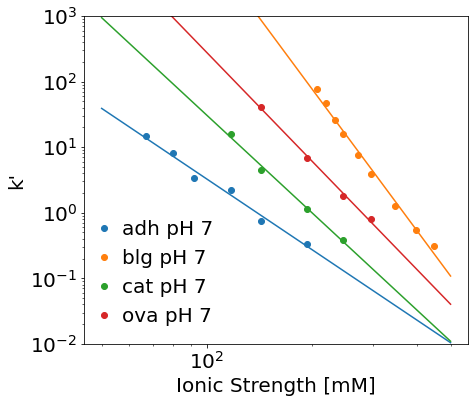

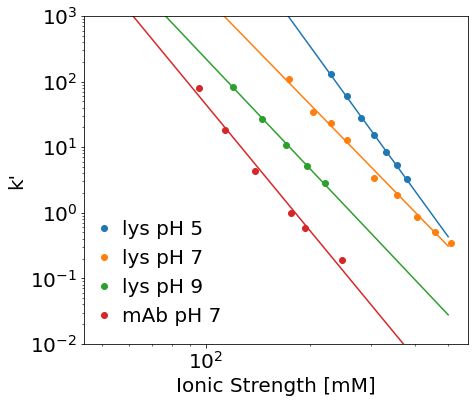

In [5]:
resins = ['caq', 'phq', 'pxq', 'sep']
tis_new = np.linspace(50, 500, 1000)

for resin in resins:
    params = {'font.weight':'normal', 'font.size':20, 'figure.autolayout':True}
    plt.rcParams.update(params)
    fig, ax = plt.subplots()
    fig.set_size_inches(7, 6, forward=True)
    fig.patch.set_alpha(1.0)
    ax.set_xlabel('Ionic Strength [mM]')
    ax.set_ylabel("k'")
    
    df_params = df_k_params[df_k_params['resin'] == resin]
    for i, icont in df_params.iterrows():
        df = dfs_k[icont['file']]
        label = icont['protein'] + ' pH ' + icont['pH']
        ax.loglog(df['IS (M)']*1e3, df['k_prime'], 'o', label=label)

        a = icont['a']
        b = icont['b']
        k_new = [np.exp(my_fit_function_ln_keq_2(tis, a, b)) for tis in tis_new]
        ax.loglog(tis_new, k_new, color=plt.gca().lines[-1].get_color())
    
    ax.legend(loc='lower left', frameon=False, handlelength=0.2)
    ax.set_ylim(1e-2, 1e3)
    plt.tight_layout()
    
    fig.savefig(f'./images/kprime_lit_comparison/my_data_resin_{resin}.png', dpi=300, 
            bbox='tight', transparent=False)

## Meta-correlation

In [6]:
meta_fit = optimize.curve_fit(meta_correlation, df_k_params['a'], df_k_params['b'], 
                             p0=(-1.0, -1.0), maxfev=10000)
c, d = meta_fit[0][0], meta_fit[0][1]

In [7]:
a_vals = np.logspace(-1.0 + np.log10(min(df_k_params['a'])), 
                     1.0 + np.log10(max(df_k_params['a'])), 1000)
b_vals = [meta_correlation(a, c, d) for a in a_vals]

/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  from ipykernel import kernelapp as app


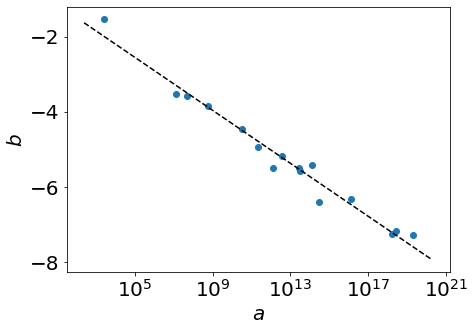

In [8]:
params = {'font.weight':'normal', 'font.size':20}
plt.rcParams.update(params)
fig, ax = plt.subplots()
fig.set_size_inches(7, 5, forward=True)
fig.patch.set_alpha(1.0)
ax.set_xlabel('$a$')
ax.set_ylabel('$b$')

ax.scatter(df_k_params['a'], df_k_params['b'])
ax.plot(a_vals, b_vals, linestyle='--', color='black')

ax.set_xscale('log')
plt.tight_layout()
fig.savefig('./images/kprime_lit_comparison/my_data_meta_correlation.png', dpi=300, 
            bbox='tight', transparent=False)

# Conversion of DePhillips' data into k'

## Load data and convert to Keq, as before

In [9]:
lit_data_files = os.listdir('./lit_data/dephillips/cleaned_data/')

dfs_dephillips = {}
for file in lit_data_files:
    dfs_dephillips[file] = pd.read_csv(f'./lit_data/dephillips/cleaned_data/{file}')
    dfs_dephillips[file].rename(columns={'x':'NaCl (M)'}, inplace=True)
    
    # Convert log(Keq [nm]) to Keq [m]
    columns_list = dfs_dephillips[file].columns
    for column in columns_list:
        if column == 'NaCl (M)':
            pass
        else:
            dfs_dephillips[file][column] = 1e-9 * 10.0**(dfs_dephillips[file][column]) * 1e3
            # NOTE THE FACTOR OF 1e3 IS SCALING UP DEPHILLIP'S DATA due to what I
            # I believe to be a conversion error on his part
            
    # Estimate IS [mM]
    dfs_dephillips[file]['IS [mM]'] = dfs_dephillips[file]['NaCl (M)']*1e3 + 10

In [10]:
df_dephil_phi = pd.read_csv(f'./lit_data/dephillips/phase_ratios.csv')

# Conversion to [m-1]
for i, icont in df_dephil_phi.iteritems():
    if i=='Resin':
        pass
    else:
        df_dephil_phi[i] = icont*1e6
        
df_dephil_phi

,Resin,1.77 nm,2.65 nm
0,SP Spherodex M,62500000.0,55200000.0
1,CM Spherodex M,68400000.0,41700000.0
2,EMD sulfonate M,55400000.0,37100000.0
3,EMD carboxylic M,36700000.0,28800000.0
4,SP Sepharose FF,43600000.0,39600000.0
5,CM Sepharose FF,39200000.0,37300000.0
6,SP-650 M,22500000.0,20700000.0
7,CM-650 M,23900000.0,21900000.0
8,SP-550 C,64300000.0,34900000.0


## Convert Keq data to k', and add Cellufine S data

In [11]:
dfs_k_dephillips = {}

for file in lit_data_files:
    dfs_k_dephillips[file] = pd.DataFrame()
    
    protein = file[:file.find('_')]
    if protein=='lysozyme' or protein=='cytochrome c':
        r_h = '1.77 nm'
    elif protein=='act':
        r_h = '2.65 nm'
    else:
        print('Protein not identified')
    
    # Conversion of Keq [m] to k' [-]
    df_keq = dfs_dephillips[file]
    for i, icont in df_keq.iteritems():
        if i=='NaCl (M)' or i=='IS [mM]':
            dfs_k_dephillips[file][i] = icont
        else:
            phi = df_dephil_phi.loc[df_dephil_phi['Resin']==i, r_h].iloc[0]
            dfs_k_dephillips[file][i] = phi*icont

In [12]:
# Addition of cellufine data to dataframes for ACT and cyctochrome c
df_cell_act = pd.read_csv(f'./lit_data/dephillips/act_kprime_cellufine.csv')
df_cell_cyc = pd.read_csv(f'./lit_data/dephillips/cytochrome c_kprime_cellufine.csv')

df_cell_act.rename(columns={'x':'NaCl (M)'}, inplace=True)
df_cell_cyc.rename(columns={'x':'NaCl (M)'}, inplace=True)

# Convert from log k' to k'
df_cell_act['Cellufine S'] = 10.0**(df_cell_act['Cellufine S'])
df_cell_cyc['Cellufine S'] = 10.0**(df_cell_cyc['Cellufine S'])

In [13]:
dfs_k_dephillips['act_mod.csv'] = dfs_k_dephillips['act_mod.csv'].merge(df_cell_act, 
                                                how='outer', on='NaCl (M)', copy=False)
dfs_k_dephillips['cytochrome c_mod.csv'] = dfs_k_dephillips['cytochrome c_mod.csv'].merge(df_cell_cyc, 
                                                how='outer', on='NaCl (M)', copy=False)

for file in lit_data_files:
    dfs_k_dephillips[file].sort_values(by='NaCl (M)', inplace=True)
    dfs_k_dephillips[file]['IS [mM]'] = dfs_k_dephillips[file]['NaCl (M)']*1e3 + 10

## Visually inspect to validate conversions

/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:37: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later


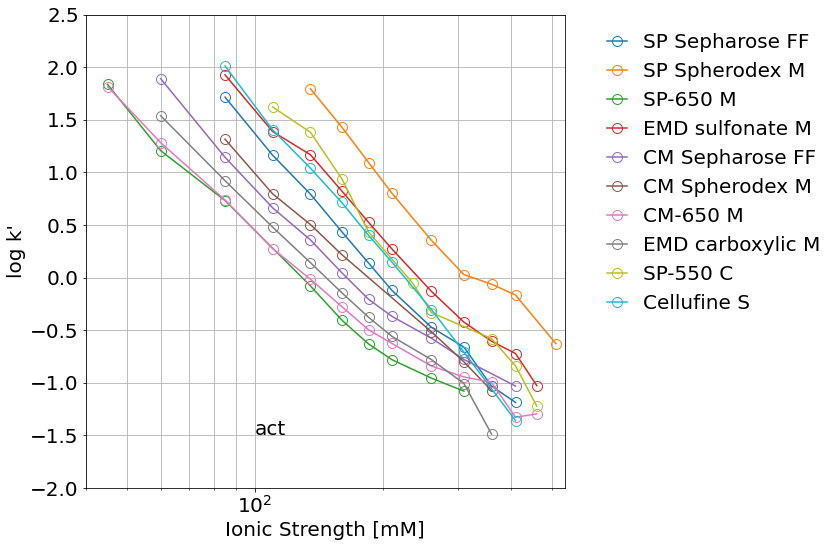

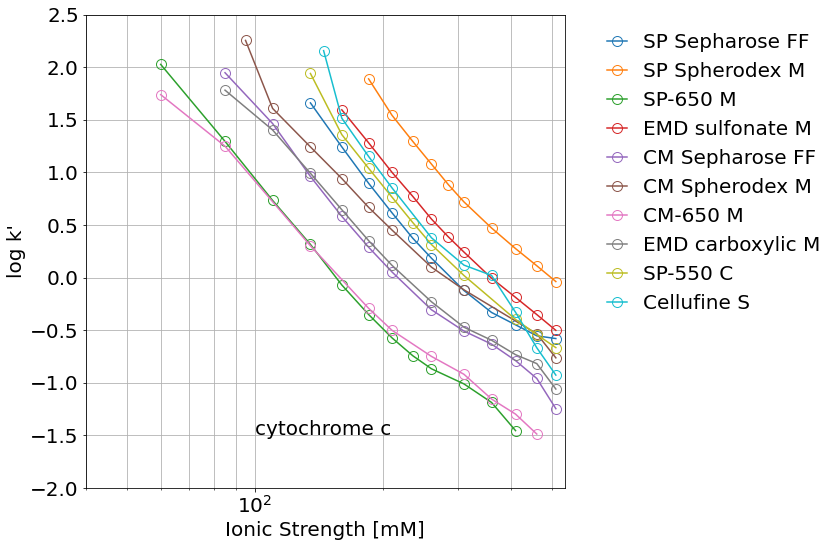

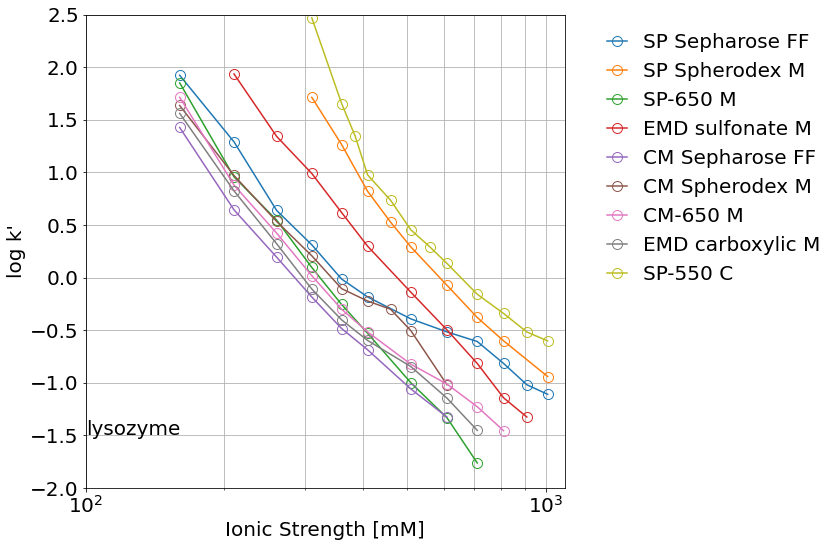

In [14]:
for file in lit_data_files:

    params = {'font.weight':'normal', 'font.size':20, 'figure.autolayout':True}
    plt.rcParams.update(params)
    fig, ax = plt.subplots()
    fig.patch.set_alpha(1.0)
    fig.set_size_inches(12, 8, forward=True)
    ax.set_xlabel('Ionic Strength [mM]')
    ax.set_ylabel("log k'")
    
    if file == 'lysozyme_mod.csv':
        tis_new = np.linspace(50, 1100, 1000)
        ax.set_xlim(100, 1100)
    else:
        tis_new = np.linspace(10, 535, 1000)
        ax.set_xlim(40, 535)
    
    df = dfs_k_dephillips[file]
    for i, icont in df.iteritems():
        if i=='NaCl (M)' or i=='IS [mM]':
            pass
        else:
            mask = np.isfinite(icont)
            ax.plot(df['IS [mM]'][mask], np.log10(icont[mask]), marker='o', 
                      fillstyle='none', markersize=10, label=i)

    ax.set_xscale('log')
    plt.grid(b=True, which='both')
    ax.set_ylim(-2, 2.5)
    ax.legend(bbox_to_anchor=(1.05, 1.0), frameon=False, handlelength=1.0)
    
    protein = file[:file.find('_')]
    plt.text(100, -1.5, protein)
    
    plt.tight_layout()
    fig.savefig(f'./images/kprime_lit_comparison/Dephillips_conversion_to_kprime_{protein}.png', 
                dpi=300, bbox='tight', transparent=False)

## Correlation of DePhillips' k' data

In [15]:
temp = []

for file in lit_data_files:
    protein = file[:file.find('_')]
    df = dfs_k_dephillips[file]
    for i, icont in df.iteritems():
        if i=='NaCl (M)' or i=='IS [mM]':
            pass
        else:
            mask = np.isfinite(icont)
            fit_params = optimize.curve_fit(my_fit_function_ln_keq_2, 
                                            df['IS [mM]'][mask], np.log(icont[mask]), 
                                            p0=(1, -50))
            temp.append([file, protein, i, fit_params[0][0], fit_params[0][1]])

df_dephil_k_params = pd.DataFrame(temp, columns=['file', 'protein', 'resin', 'a', 'b'])
df_dephil_k_params

,file,protein,resin,a,b
0,act_mod.csv,act,SP Sepharose FF,6.293345e+09,-4.232730
1,act_mod.csv,act,SP Spherodex M,2.582282e+10,-4.103294
2,act_mod.csv,act,SP-650 M,4.041610e+07,-3.575732
3,act_mod.csv,act,EMD sulfonate M,3.831314e+09,-3.988308
4,act_mod.csv,act,CM Sepharose FF,7.583409e+07,-3.499740
5,act_mod.csv,act,CM Spherodex M,2.550538e+08,-3.704238
6,act_mod.csv,act,CM-650 M,4.254040e+06,-3.058453
7,act_mod.csv,act,EMD carboxylic M,1.071982e+08,-3.685698
8,act_mod.csv,act,SP-550 C,6.846007e+10,-4.523748
9,act_mod.csv,act,Cellufine S,2.312855e+11,-4.846640


/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:42: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:42: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:42: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later


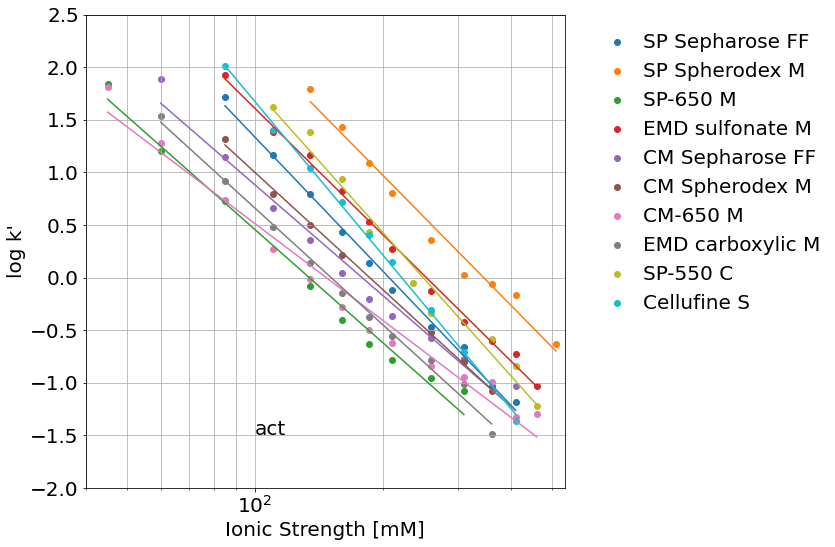

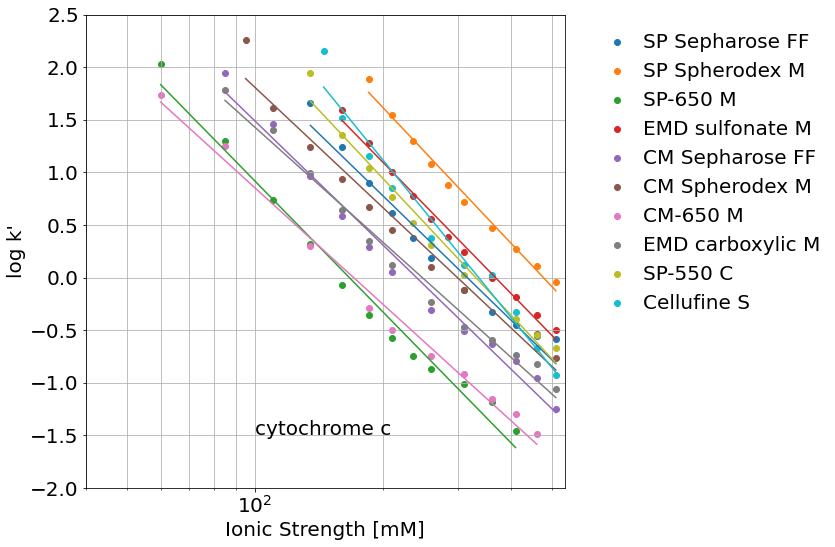

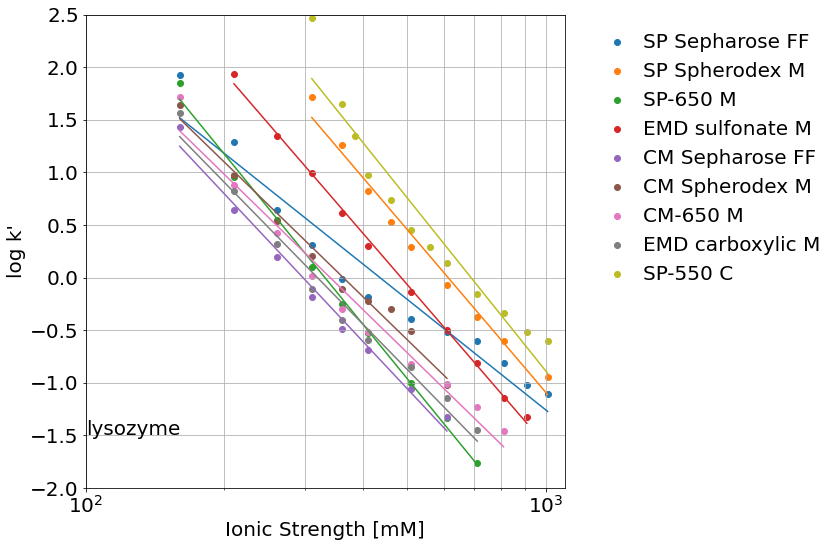

In [16]:
for file in lit_data_files:
    protein = file[:file.find('_')]

    params = {'font.weight':'normal', 'font.size':20, 'figure.autolayout':True}
    plt.rcParams.update(params)
    fig, ax = plt.subplots()
    fig.patch.set_alpha(1.0)
    fig.set_size_inches(12, 8, forward=True)
    ax.set_xlabel('Ionic Strength [mM]')
    ax.set_ylabel("log k'")
    
    if file == 'lysozyme_mod.csv':
        ax.set_xlim(100, 1100)
    else:
        ax.set_xlim(40, 535)
    
    df = dfs_k_dephillips[file]
    for i, icont in df.iteritems():
        if i=='NaCl (M)' or i=='IS [mM]':
            pass
        else:
            mask = np.isfinite(icont)
            ax.scatter(df['IS [mM]'][mask], np.log10(icont[mask]), label=i)
           
            tis_new = [min(df['IS [mM]'][mask]), max(df['IS [mM]'][mask])]
            a = df_dephil_k_params.loc[(df_dephil_k_params['protein']==protein) &\
                                      (df_dephil_k_params['resin']==i), 'a'].iloc[0]
            b = df_dephil_k_params.loc[(df_dephil_k_params['protein']==protein) &\
                                      (df_dephil_k_params['resin']==i), 'b'].iloc[0]
            k_new = [np.exp(my_fit_function_ln_keq_2(tis, a, b)) for tis in tis_new]
            ax.plot(tis_new, np.log10(k_new))
            
    ax.set_xscale('log')
    plt.grid(b=True, which='both')
    ax.set_ylim(-2, 2.5)
    ax.legend(bbox_to_anchor=(1.05, 1.0), frameon=False, handlelength=1.0)
    
    plt.text(100, -1.5, protein)
    
    plt.tight_layout()
    fig.savefig(f'./images/kprime_lit_comparison/Dephillips_fit_kprime_{protein}.png', 
                dpi=300, bbox='tight', transparent=False)

## Meta-correlation

/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later


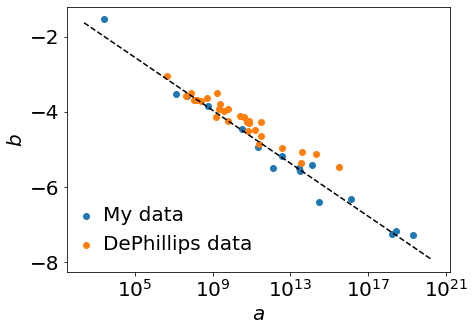

In [17]:
params = {'font.weight':'normal', 'font.size':20}
plt.rcParams.update(params)
fig, ax = plt.subplots()
fig.set_size_inches(7, 5, forward=True)
fig.patch.set_alpha(1.0)
ax.set_xlabel('$a$')
ax.set_ylabel('$b$')

ax.plot(a_vals, b_vals, linestyle='--', color='black')

ax.scatter(df_k_params['a'], df_k_params['b'], label='My data')
ax.scatter(df_dephil_k_params['a'], df_dephil_k_params['b'], label='DePhillips data')

ax.legend(loc='lower left', frameon=False, handlelength=0.1)
ax.set_xscale('log')
plt.tight_layout()
fig.savefig('./images/kprime_lit_comparison/meta_correlation.png', dpi=300, 
            bbox='tight', transparent=False)

# Staby data

In [18]:
staby_files = os.listdir('./lit_data/staby/')
staby_files = [file for file in staby_files if '.csv' in file]
staby_files.sort()

# Retrospective code
if 'all_cleaned_data.csv' in staby_files:
    staby_files.remove('all_cleaned_data.csv')

staby_files

['1a.csv',
 '1b.csv',
 '1c.csv',
 '1d.csv',
 '2a.csv',
 '2b.csv',
 '2c.csv',
 '2d.csv',
 '3a.csv',
 '3b.csv',
 '3c.csv',
 '3d.csv',
 '4a.csv',
 '4b.csv',
 '4c.csv',
 '4d.csv',
 '5a.csv',
 '5b.csv',
 '5c.csv',
 '6a.csv',
 '6b.csv',
 '6c.csv',
 '6d.csv']

In [19]:
iex_type = {1:'aex', 2:'aex', 6:'aex', 3:'cex', 4:'cex', 5:'cex'}
aex_prot = {'a':'anti-FVII mAb', 'b':'aprotinin', 'c':'lipolase', 'd':'myoglobin'}
cex_prot = {'a':'anti-FVII mAb', 'b':'aprotinin', 'c':'lysozyme', 'd':'myoglobin'}

In [20]:
# One large data frame for Staby data
df_all_staby = pd.DataFrame()

for file in staby_files:
    # Identify IEX type and protein species
    number = int(file[0])
    letter = file[1]
    iex = iex_type[number]
    if iex=='aex':
        protein = aex_prot[letter]
    elif iex=='cex':
        protein = cex_prot[letter]
    
    # Load raw data and extract data for each protein
    df_raw = pd.read_csv(f'./lit_data/staby/{file}', names=['x', 'resin'])
    indeces = list(df_raw[df_raw['x']=='x'].index) + [len(df_raw)]
    for n, ind in enumerate(indeces):
        if ind != indeces[-1]:
            df_clean = df_raw[indeces[n]:indeces[n+1]].copy()
            df_clean.reset_index(drop=True, inplace=True)
            resin = df_clean.at[0, 'resin']
            df_clean.columns = ['x', 'kprime']
            df_clean = df_clean[1:]
            df_clean = df_clean.astype('float', copy=False)
            
            if not df_clean.empty:
                # Save relevant information in the data frame
                df_clean['paper'] = number
                df_clean['plot_letter'] = letter
                df_clean['protein'] = protein
                df_clean['iex_type'] = iex
                df_clean['resin'] = resin
                
                # Convert column 'x' into ionic strength
                # 1, 2 have x = 1/I; 3-6 have x = log(1/I)
                if number in [1, 2]:
                    df_clean['tis_M'] = 1.0/df_clean['x']
                else:
                    df_clean['tis_M'] = 10.0**(-1.0*df_clean['x'])
                    
                # Concatenate into one large dataframe
                df_all_staby = pd.concat([df_all_staby, df_clean])

df_all_staby.sort_values(by=['paper', 'plot_letter', 'resin', 'tis_M'], inplace=True)
df_all_staby = df_all_staby[['paper', 'plot_letter', 'protein', 'iex_type', 'resin', 'x', 
                             'tis_M', 'kprime']]
df_all_staby.reset_index(drop=True, inplace=True)

In [21]:
# Save all cleaned data together
# df_all_staby.to_csv('./lit_data/staby/cleaned_data/all_cleaned_data.csv', index=False)

In [22]:
df_all_staby

,paper,plot_letter,protein,iex_type,resin,x,tis_M,kprime
0,1,a,anti-FVII mAb,aex,Express-Ion Q,7.98160,0.125288,3.594500
1,1,a,anti-FVII mAb,aex,Express-Ion Q,7.34610,0.136127,1.098900
2,1,a,anti-FVII mAb,aex,Express-Ion Q,6.60740,0.151345,0.303330
3,1,a,anti-FVII mAb,aex,Express-Ion Q,6.03110,0.165807,0.038518
4,1,a,anti-FVII mAb,aex,Fractogel EMD TMAE 650s,7.39780,0.135175,11.520000
...,...,...,...,...,...,...,...,...
805,6,d,myoglobin,aex,Toyopearl DEAE 650 M,1.51511,0.030541,3.256100
806,6,d,myoglobin,aex,Toyopearl DEAE 650 M,1.38996,0.040742,0.760800
807,6,d,myoglobin,aex,Toyopearl DEAE 650 M,1.29578,0.050608,0.390380
808,6,d,myoglobin,aex,Toyopearl DEAE 650 M,1.21703,0.060669,0.248650


/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:17: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


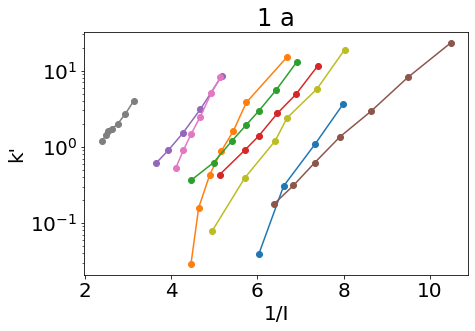

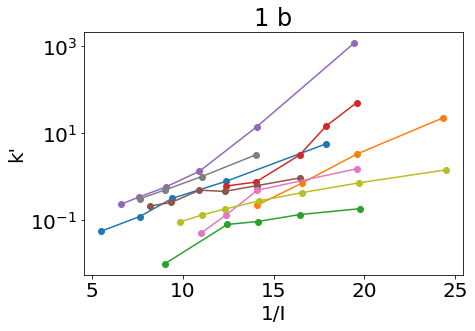

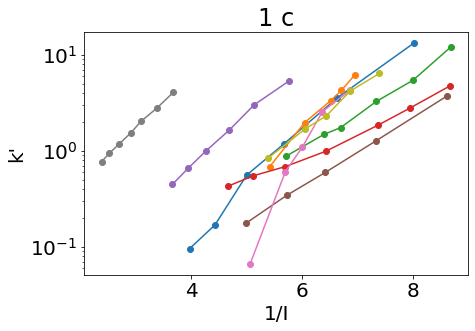

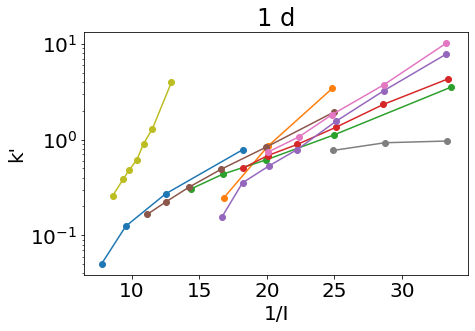

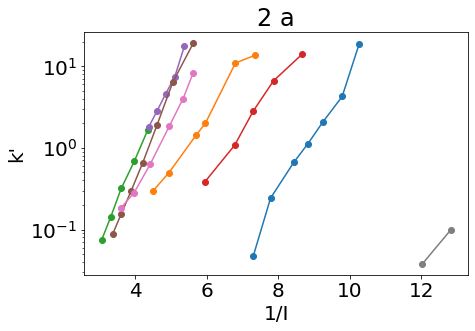

...

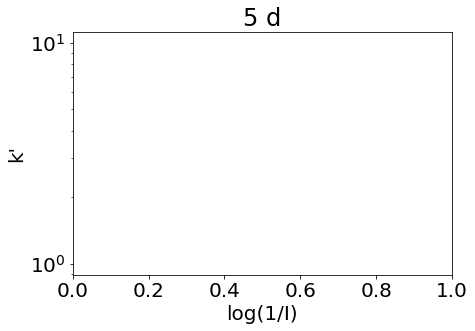

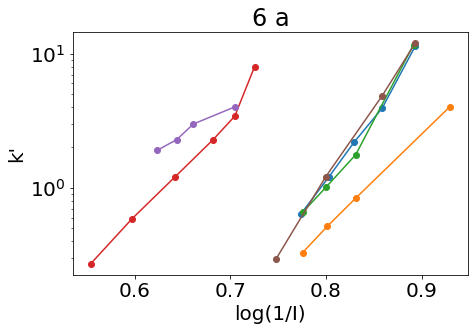

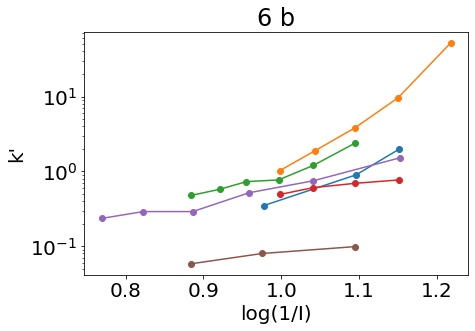

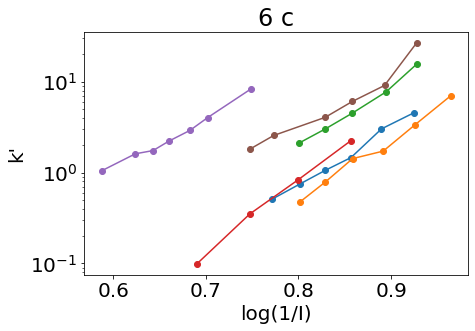

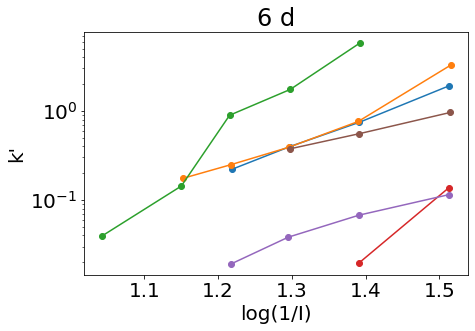

In [23]:
# Check the extracted data look correct
papers = list(set(df_all_staby['paper']))
plot_letters = list(set(df_all_staby['plot_letter']))

papers.sort()
plot_letters.sort()

for paper in papers:
    for plot in plot_letters:
        df_plot = df_all_staby[(df_all_staby.paper==paper) &\
                               (df_all_staby.plot_letter==plot)]
        resins = list(set(df_plot['resin']))
        
        # Plot data
        params = {'font.weight':'normal', 'font.size':20}
        plt.rcParams.update(params)
        fig, ax = plt.subplots()
        fig.set_size_inches(7, 5, forward=True)
        fig.patch.set_alpha(1.0)
        ax.set_yscale('log')
        ax.set_ylabel("k'")
        if paper in [1, 2]:
            ax.set_xlabel("1/I")
        else:
            ax.set_xlabel("log(1/I)")
        plt.title(f'{paper} {plot}')
        
        for resin in resins:
            df = df_plot[df_plot.resin==resin]
            ax.plot(df['x'], df['kprime'], '-o')

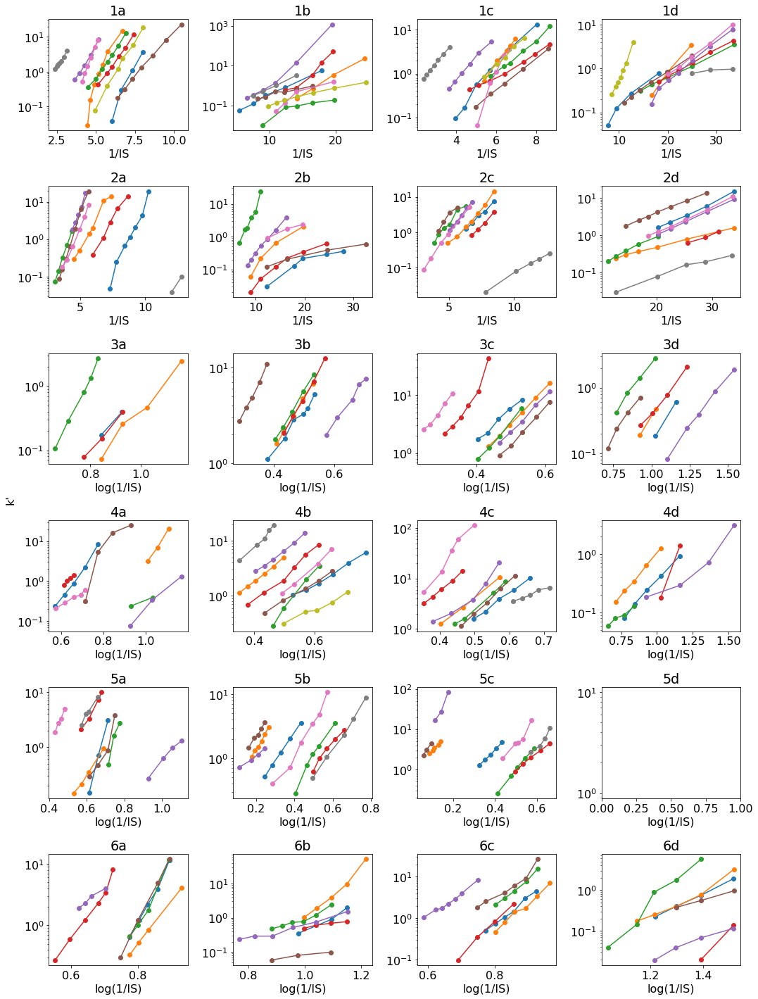

In [26]:
# Plot raw data with panes (not using sharex/sharey in plt.subplots due to 1/IS vs log(1/IS))

n_row, n_col = 6, 4
fig, ax = plt.subplots(n_row, n_col)
params = {'font.weight':'normal', 'font.size':16}
plt.rcParams.update(params)
fig.set_size_inches(15, 20, forward=True)
fig.patch.set_alpha(1.0)
fig.text(0.00, 0.5, "k'", va='center', rotation='vertical')

for j, paper in enumerate(papers):
    for k, plot in enumerate(plot_letters):
        i = j*n_col + k
        row, column = math.floor(i/n_col), i%n_col
        ax[row, column].set_yscale('log')
        ax[row, column].set_title(f"{paper}{plot}")
        
        df_plot = df_all_staby[(df_all_staby.paper==paper) &\
                               (df_all_staby.plot_letter==plot)]
        resins = list(set(df_plot['resin']))
        
        if paper in [1, 2]:
            ax[row, column].set_xlabel("1/IS")
        else:
            ax[row, column].set_xlabel("log(1/IS)")
        
        for resin in resins:
            df = df_plot[df_plot.resin==resin]
            ax[row, column].plot(df['x'], df['kprime'], '-o')
            
plt.tight_layout()
fig.savefig('./images/kprime_lit_comparison/staby_all_raw_data.png', dpi=300)

/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:17: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


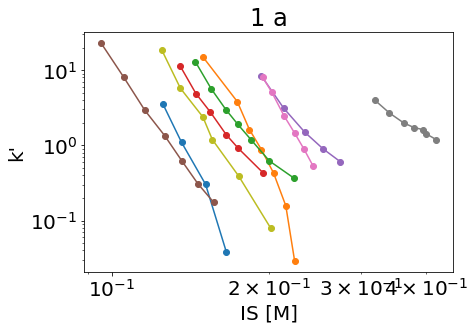

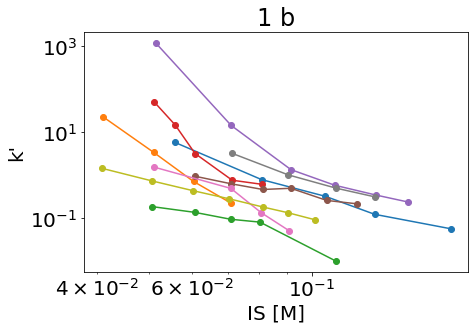

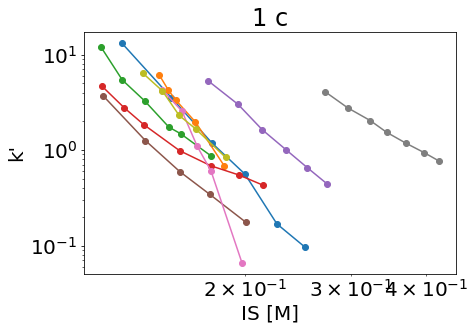

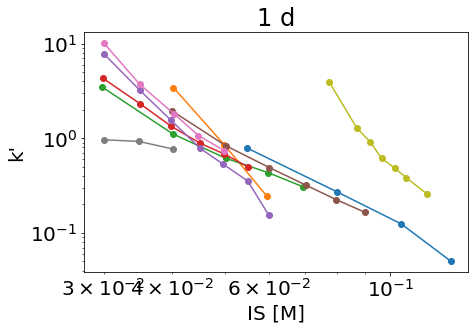

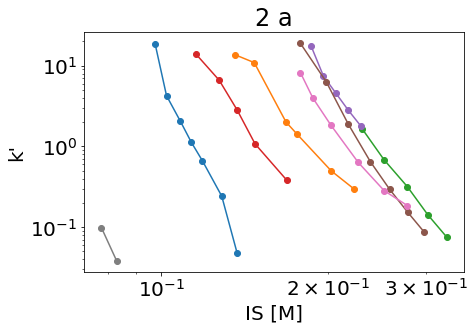

...

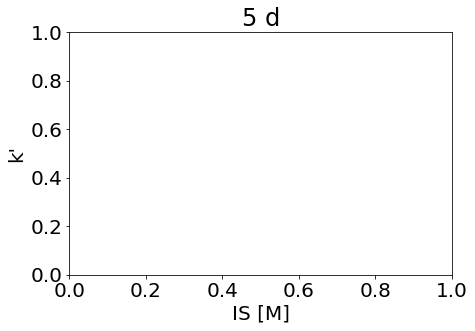

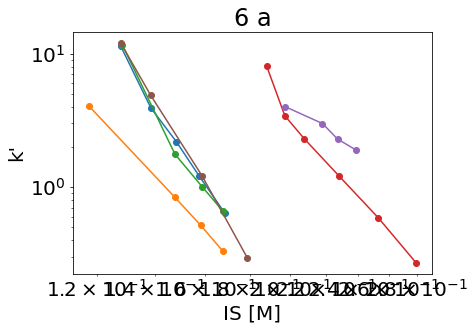

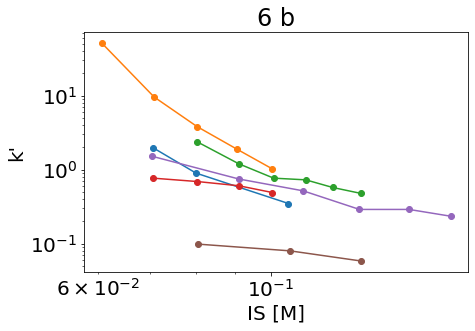

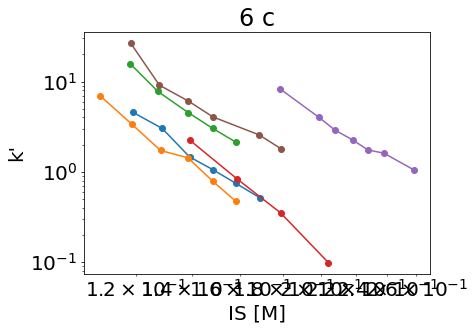

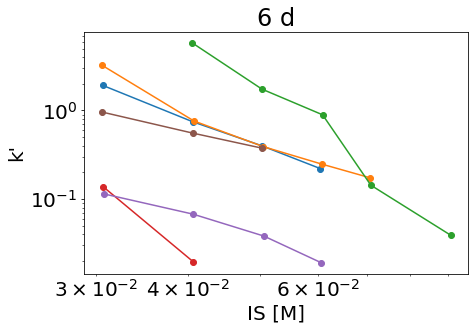

In [27]:
# Check the extracted data look correct
papers = list(set(df_all_staby['paper']))
plot_letters = list(set(df_all_staby['plot_letter']))

papers.sort()
plot_letters.sort()

for paper in papers:
    for plot in plot_letters:
        df_plot = df_all_staby[(df_all_staby.paper==paper) &\
                               (df_all_staby.plot_letter==plot)]
        resins = list(set(df_plot['resin']))
        
        # Plot data
        params = {'font.weight':'normal', 'font.size':20}
        plt.rcParams.update(params)
        fig, ax = plt.subplots()
        fig.set_size_inches(7, 5, forward=True)
        fig.patch.set_alpha(1.0)
        ax.set_ylabel("k'")
        ax.set_xlabel("IS [M]")
        plt.title(f'{paper} {plot}')
        
        for resin in resins:
            df = df_plot[df_plot.resin==resin]
            ax.loglog(df['tis_M'], df['kprime'], '-o')

In [28]:
# Fit a, b to the k'-IS data
def get_residuals(x, tis, kprime):
    a = x[0]
    b = x[1]
    return np.log(kprime) - np.log(a*tis**b)

In [29]:
temp = []

for paper in papers:
    for plot in plot_letters:
        df_plot = df_all_staby[(df_all_staby.paper==paper) &\
                               (df_all_staby.plot_letter==plot)]
        if not df_plot.empty:
            protein = list(set(df_plot.protein))[0] # There's a better way to do this
            resins = list(set(df_plot['resin']))
            for resin in resins:
                df = df_plot[df_plot.resin==resin]            
                fit = optimize.least_squares(get_residuals, x0=[1e7, -5],
                                            args=(df['tis_M']*1e3, df['kprime']), 
                                            xtol=1e-12, gtol=1e-12, ftol=1e-12, 
                                             method='lm')
                temp.append([paper, plot, resin, protein, fit.x[0], fit.x[1]])

df_staby_params = pd.DataFrame(temp, columns=['paper', 'plot_letter', 'resin', 'protein', 'a', 'b'])

/home/chase/anaconda3/lib/python3.7/site-packages/pandas/core/series.py:726: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/chase/anaconda3/lib/python3.7/site-packages/pandas/core/series.py:726: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/chase/anaconda3/lib/python3.7/site-packages/pandas/core/series.py:726: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/chase/anaconda3/lib/python3.7/site-packages/pandas/core/series.py:726: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/chase/anaconda3/lib/python3.7/site-packages/pandas/core/series.py:726: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/chase/anaconda3/lib/python3.7/site-packages/pandas/core/series.py:726: RuntimeWarning: invalid valu

/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # This is added back by InteractiveShellApp.init_path()


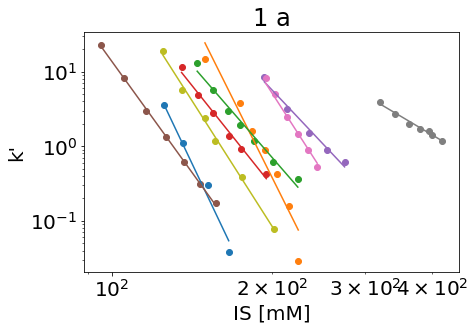

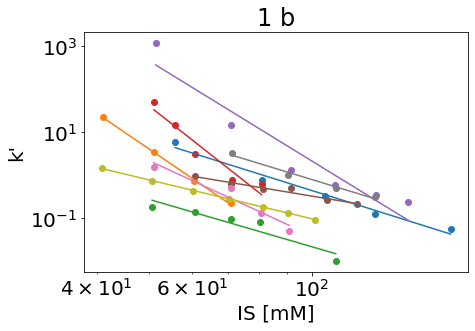

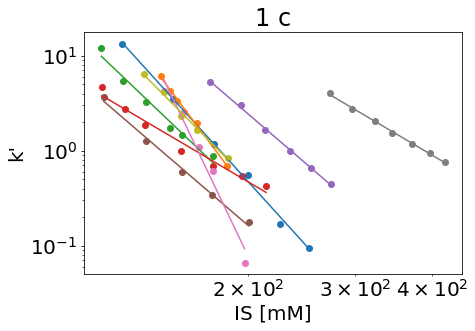

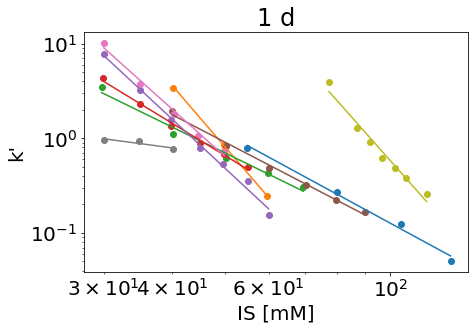

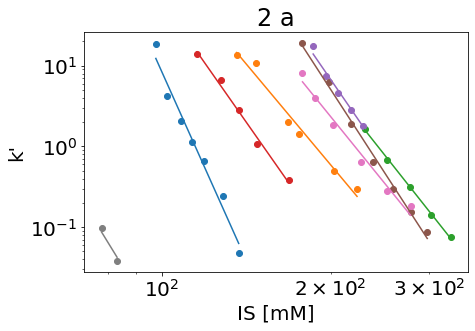

...

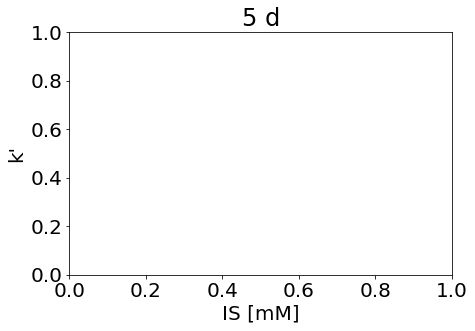

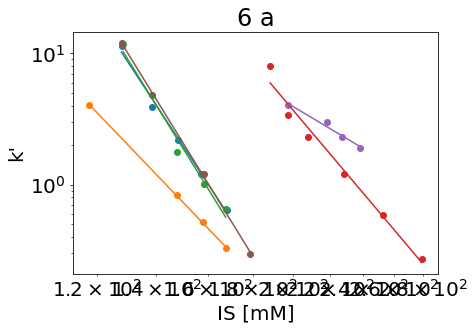

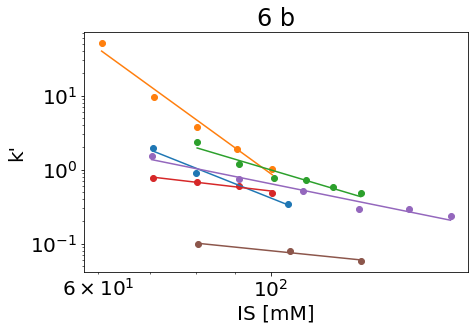

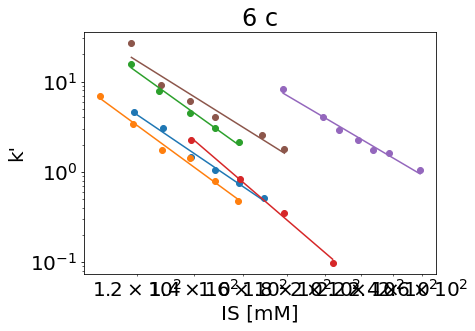

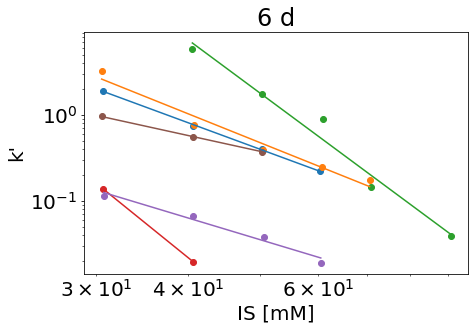

In [30]:
# Check the fits were performed correctly
for paper in papers:
    for plot in plot_letters:
        df_plot = df_all_staby[(df_all_staby.paper==paper) &\
                               (df_all_staby.plot_letter==plot)]
        resins = list(set(df_plot['resin']))
        
        # Plot data
        params = {'font.weight':'normal', 'font.size':20}
        plt.rcParams.update(params)
        fig, ax = plt.subplots()
        fig.set_size_inches(7, 5, forward=True)
        fig.patch.set_alpha(1.0)
        ax.set_ylabel("k'")
        ax.set_xlabel("IS [mM]")
        plt.title(f'{paper} {plot}')
        
        for resin in resins:
            df = df_plot[df_plot.resin==resin]
            ax.scatter(df['tis_M']*1e3, df['kprime'])
            
            # Plot fit
            a = df_staby_params.loc[(df_staby_params.paper==paper) &\
                                    (df_staby_params.plot_letter==plot) &\
                                    (df_staby_params.resin==resin), 'a'].iloc[0]
            b = df_staby_params.loc[(df_staby_params.paper==paper) &\
                                    (df_staby_params.plot_letter==plot) &\
                                    (df_staby_params.resin==resin), 'b'].iloc[0]
            tis_new = [min(df['tis_M']*1e3), max(df['tis_M']*1e3)]
            k_new = [a*tis**b for tis in tis_new]
            ax.loglog(tis_new, k_new)

In [31]:
# Save fit params
# df_staby_params.to_csv('./lit_data/staby/cleaned_data/fit_params.csv', index=False)

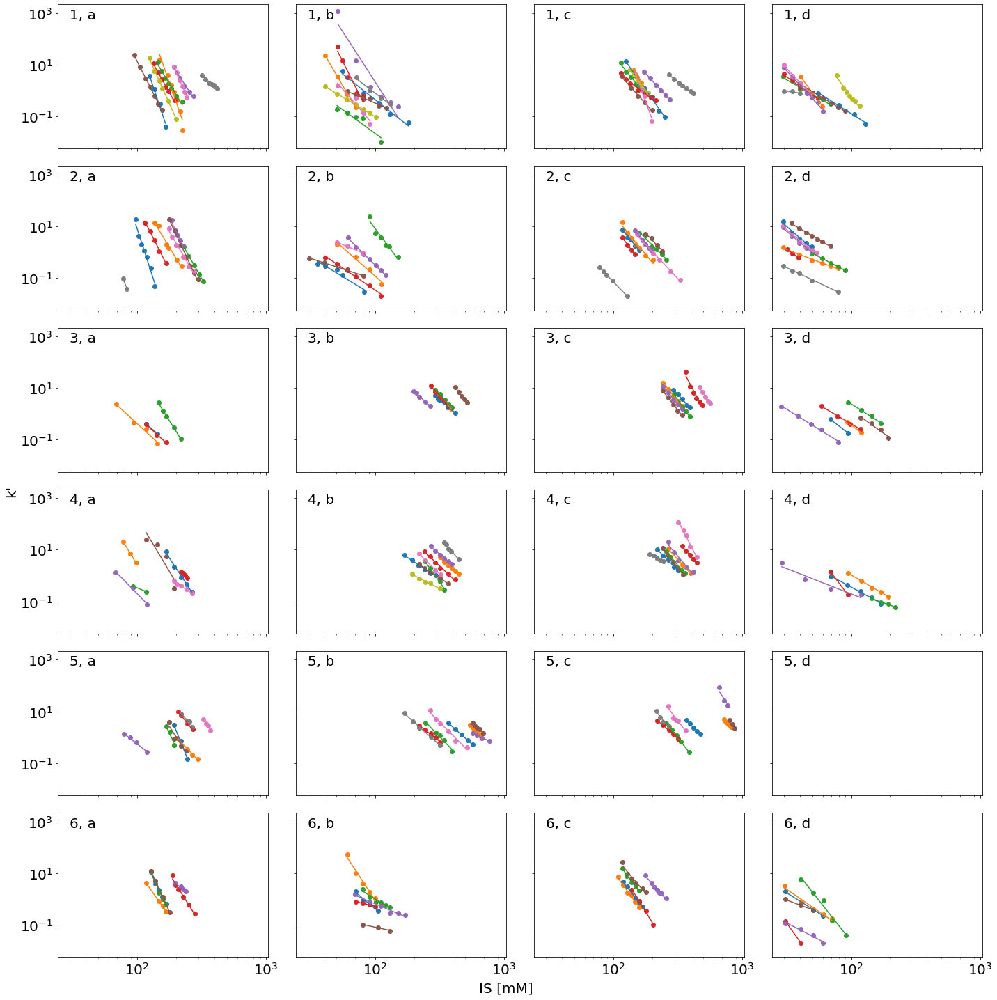

In [32]:
# Plot Staby data together
fig, ax = plt.subplots(6, 4, sharex=True, sharey=True)
params = {'font.weight':'normal', 'font.size':20}
plt.rcParams.update(params)
fig.set_size_inches(20, 20, forward=True)
fig.patch.set_alpha(1.0)
fig.text(0.5, 0.00, "IS [mM]", ha='center')
fig.text(0.00, 0.5, "k'", va='center', rotation='vertical')
        
for paper_num, paper in enumerate(papers):
    for plot_num, plot in enumerate(plot_letters):
        df_plot = df_all_staby[(df_all_staby.paper==paper) &\
                               (df_all_staby.plot_letter==plot)]
        resins = list(set(df_plot['resin']))
        
        # Print paper, plot letter label on the appropriate plot
        ax[paper_num, plot_num].text(30, 600, f'{paper}, {plot}')
            
        for resin in resins:
            # Plot data points
            df = df_plot[df_plot.resin==resin]
            ax[paper_num, plot_num].scatter(df['tis_M']*1e3, df['kprime'])
            
            # Plot fit
            a = df_staby_params.loc[(df_staby_params.paper==paper) &\
                                    (df_staby_params.plot_letter==plot) &\
                                    (df_staby_params.resin==resin), 'a'].iloc[0]
            b = df_staby_params.loc[(df_staby_params.paper==paper) &\
                                    (df_staby_params.plot_letter==plot) &\
                                    (df_staby_params.resin==resin), 'b'].iloc[0]
            tis_new = [min(df['tis_M']*1e3), max(df['tis_M']*1e3)]
            k_new = [a*tis**b for tis in tis_new]
            ax[paper_num, plot_num].loglog(tis_new, k_new)

plt.tight_layout()
fig.savefig('./images/kprime_lit_comparison/staby_all_data.png', dpi=300)

In [33]:
protein_iex_pairs = list(set(zip(df_all_staby.iex_type, df_all_staby.protein)))
protein_iex_pairs.sort()
protein_iex_pairs

[('aex', 'anti-FVII mAb'),
 ('aex', 'aprotinin'),
 ('aex', 'lipolase'),
 ('aex', 'myoglobin'),
 ('cex', 'anti-FVII mAb'),
 ('cex', 'aprotinin'),
 ('cex', 'lysozyme'),
 ('cex', 'myoglobin')]

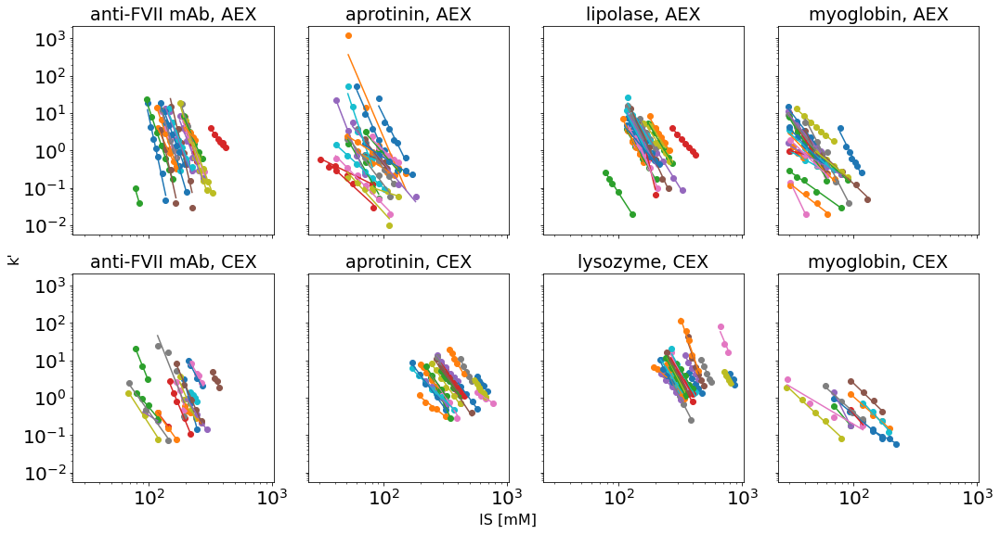

In [34]:
n_row, n_col = 2, 4
fig, ax = plt.subplots(n_row, n_col, sharex=True, sharey=True)
params = {'font.weight':'normal', 'font.size':16}
plt.rcParams.update(params)
fig.set_size_inches(15, 8, forward=True)
fig.patch.set_alpha(1.0)
fig.text(0.5, 0.00, "IS [mM]", ha='center')
fig.text(0.00, 0.5, "k'", va='center', rotation='vertical')

for i, pair in enumerate(protein_iex_pairs):
    iex_type = pair[0]
    protein  = pair[1]
    row, column = math.floor(i/n_col), i%n_col
    ax[row, column].set_title(f"{protein}, {iex_type.upper()}")
    
    df_plot = df_all_staby[(df_all_staby.protein==protein) &\
                           (df_all_staby.iex_type==iex_type)]
    resins = list(set(df_plot['resin']))
    
    for resin in resins:
        # Plot data points
        df = df_plot[df_plot.resin==resin]
        ax[row, column].scatter(df['tis_M']*1e3, df['kprime'])

        # Plot fit
        a = df_staby_params.loc[(df_staby_params.protein==protein) &\
                                (df_staby_params.resin==resin), 'a'].iloc[0]
        b = df_staby_params.loc[(df_staby_params.protein==protein) &\
                                (df_staby_params.resin==resin), 'b'].iloc[0]
        tis_new = [min(df['tis_M']*1e3), max(df['tis_M']*1e3)]
        k_new = [a*tis**b for tis in tis_new]
        ax[row, column].loglog(tis_new, k_new)

plt.tight_layout()
fig.savefig('./images/kprime_lit_comparison/staby_all_data_2.png', dpi=300)

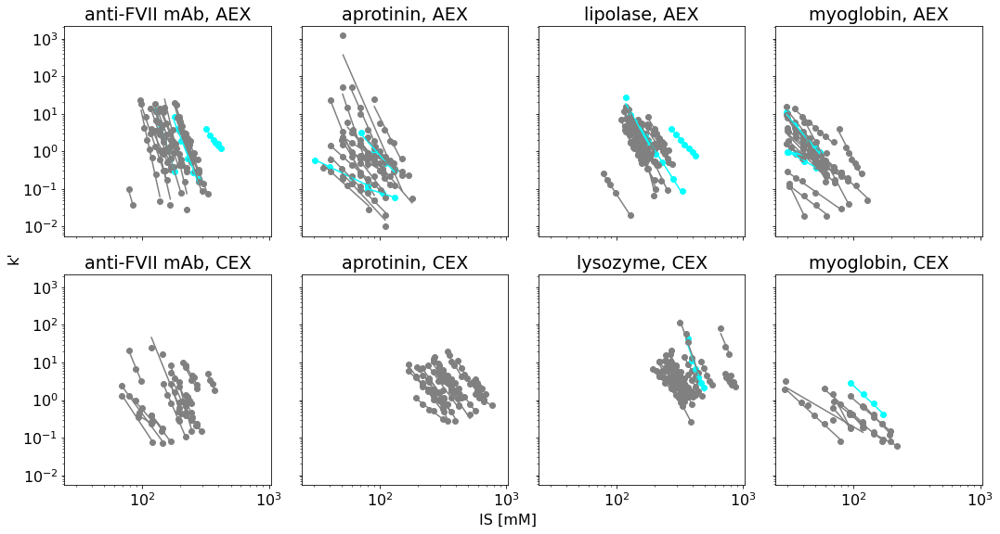

In [91]:
n_row, n_col = 2, 4
fig, ax = plt.subplots(n_row, n_col, sharex=True, sharey=True)
params = {'font.weight':'normal', 'font.size':16}
plt.rcParams.update(params)
fig.set_size_inches(15, 8, forward=True)
fig.patch.set_alpha(1.0)
fig.text(0.5, 0.00, "IS [mM]", ha='center')
fig.text(0.00, 0.5, "k'", va='center', rotation='vertical')

for i, pair in enumerate(protein_iex_pairs):
    iex_type = pair[0]
    protein  = pair[1]
    row, column = math.floor(i/n_col), i%n_col
    ax[row, column].set_title(f"{protein}, {iex_type.upper()}")
    
    df_plot = df_all_staby[(df_all_staby.protein==protein) &\
                           (df_all_staby.iex_type==iex_type)]
    resins = list(set(df_plot['resin']))
    
    for resin in resins:
        if 'Poros' in resin:
            color='cyan'
        else:
            color='grey'
        
        df = df_plot[df_plot.resin==resin]
        ax[row, column].scatter(df['tis_M']*1e3, df['kprime'], color=color)

        # Plot fit
        a = df_staby_params.loc[(df_staby_params.protein==protein) &\
                                (df_staby_params.resin==resin), 'a'].iloc[0]
        b = df_staby_params.loc[(df_staby_params.protein==protein) &\
                                (df_staby_params.resin==resin), 'b'].iloc[0]
        tis_new = [min(df['tis_M']*1e3), max(df['tis_M']*1e3)]
        k_new = [a*tis**b for tis in tis_new]
        ax[row, column].loglog(tis_new, k_new, color=color)

plt.tight_layout()
fig.savefig('./images/kprime_lit_comparison/staby_all_data_2_highlight_POROS_aex.png', dpi=300)

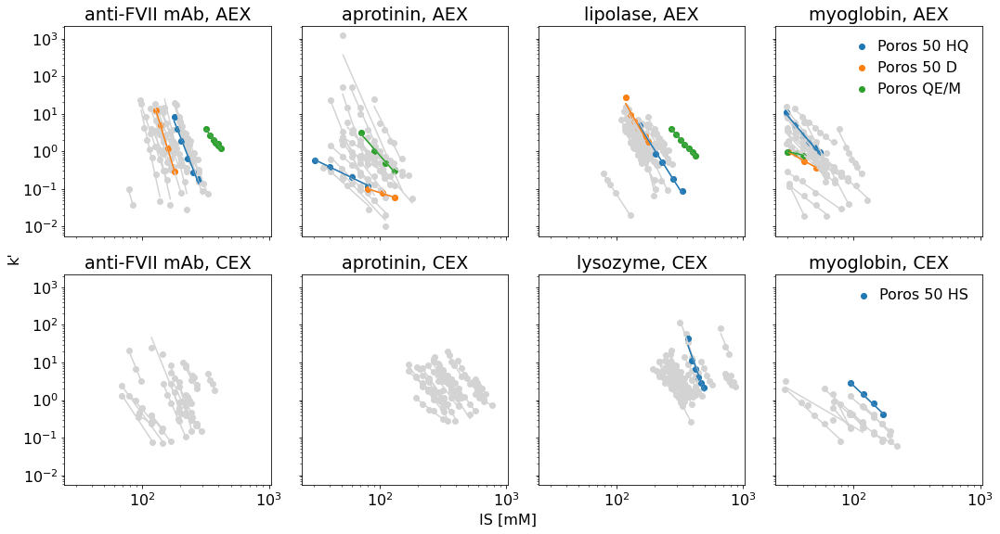

In [102]:
n_row, n_col = 2, 4
fig, ax = plt.subplots(n_row, n_col, sharex=True, sharey=True)
params = {'font.weight':'normal', 'font.size':16}
plt.rcParams.update(params)
fig.set_size_inches(15, 8, forward=True)
fig.patch.set_alpha(1.0)
fig.text(0.5, 0.00, "IS [mM]", ha='center')
fig.text(0.00, 0.5, "k'", va='center', rotation='vertical')

for i, pair in enumerate(protein_iex_pairs):
    iex_type = pair[0]
    protein  = pair[1]
    row, column = math.floor(i/n_col), i%n_col
    ax[row, column].set_title(f"{protein}, {iex_type.upper()}")
    
    df_plot = df_all_staby[(df_all_staby.protein==protein) &\
                           (df_all_staby.iex_type==iex_type)]
    resins = list(set(df_plot['resin']))
    
    for resin in resins:        
        df = df_plot[df_plot.resin==resin]
        a = df_staby_params.loc[(df_staby_params.protein==protein) &\
                                (df_staby_params.resin==resin), 'a'].iloc[0]
        b = df_staby_params.loc[(df_staby_params.protein==protein) &\
                                (df_staby_params.resin==resin), 'b'].iloc[0]       
        tis_new = [min(df['tis_M']*1e3), max(df['tis_M']*1e3)]
        k_new = [a*tis**b for tis in tis_new]
        
        ax[row, column].scatter(df['tis_M']*1e3, df['kprime'], color='lightgrey')
        ax[row, column].loglog(tis_new, k_new, color='lightgrey')
            
    for resin in resins:
        if 'Poros' in resin:
            df = df_plot[df_plot.resin==resin]
            a = df_staby_params.loc[(df_staby_params.protein==protein) &\
                                    (df_staby_params.resin==resin), 'a'].iloc[0]
            b = df_staby_params.loc[(df_staby_params.protein==protein) &\
                                    (df_staby_params.resin==resin), 'b'].iloc[0]       
            tis_new = [min(df['tis_M']*1e3), max(df['tis_M']*1e3)]
            k_new = [a*tis**b for tis in tis_new]
            
            ax[row, column].scatter(df['tis_M']*1e3, df['kprime'], label=resin)
            ax[row, column].loglog(tis_new, k_new)
    
    if column == n_col-1:
        ax[row, column].legend(loc='upper right', frameon=False, handlelength=0.5)

plt.tight_layout()
# fig.savefig('./images/kprime_lit_comparison/staby_all_data_2_highlight_POROS_aex_2.png', dpi=300)

In [103]:
df_all_staby

,paper,plot_letter,protein,iex_type,resin,x,tis_M,kprime
0,1,a,anti-FVII mAb,aex,Express-Ion Q,7.98160,0.125288,3.594500
1,1,a,anti-FVII mAb,aex,Express-Ion Q,7.34610,0.136127,1.098900
2,1,a,anti-FVII mAb,aex,Express-Ion Q,6.60740,0.151345,0.303330
3,1,a,anti-FVII mAb,aex,Express-Ion Q,6.03110,0.165807,0.038518
4,1,a,anti-FVII mAb,aex,Fractogel EMD TMAE 650s,7.39780,0.135175,11.520000
...,...,...,...,...,...,...,...,...
805,6,d,myoglobin,aex,Toyopearl DEAE 650 M,1.51511,0.030541,3.256100
806,6,d,myoglobin,aex,Toyopearl DEAE 650 M,1.38996,0.040742,0.760800
807,6,d,myoglobin,aex,Toyopearl DEAE 650 M,1.29578,0.050608,0.390380
808,6,d,myoglobin,aex,Toyopearl DEAE 650 M,1.21703,0.060669,0.248650


In [58]:
for i, pair in enumerate(protein_iex_pairs):
    iex_type = pair[0]
    protein  = pair[1]
    df_plot = df_all_staby[(df_all_staby.protein==protein) &\
                           (df_all_staby.iex_type==iex_type)]
    df = df_plot[['resin', 'tis_M', 'kprime']]
    df.to_csv(f'lit_data/staby/cleaned_data/{iex_type}_{protein}.csv')
    

In [105]:
df_plot = df_all_staby[df_all_staby.iex_type=='cex']
df = df_plot[['resin', 'protein', 'tis_M', 'kprime']].copy()
df['ln(kprime)'] = np.log(df.kprime)
df['ln(tis_mM)'] = np.log(df.tis_M*1e3)
df.to_csv(f'lit_data/staby/cleaned_data/all_cex.csv', index=False)

df_plot = df_all_staby[df_all_staby.iex_type=='aex']
df = df_plot[['resin', 'protein', 'tis_M', 'kprime']].copy()
df['ln(kprime)'] = np.log(df.kprime)
df['ln(tis_mM)'] = np.log(df.tis_M*1e3)
df.to_csv(f'lit_data/staby/cleaned_data/all_aex.csv', index=False)

In [117]:
df = df_all_staby[((df_all_staby.iex_type=='cex') &\
            (df_all_staby.protein=='aprotinin')) |\
            ((df_all_staby.iex_type=='cex') &\
            (df_all_staby.protein=='lysozyme'))].copy()
df['ln(kprime)'] = np.log(df.kprime)
df['ln(tis_mM)'] = np.log(df.tis_M*1e3)
df.to_csv(f'lit_data/staby/cleaned_data/cex_comparison_proteins.csv', index=False)

df = df_all_staby[((df_all_staby.iex_type=='aex') &\
            (df_all_staby.protein=='anti-FVII mAb')) |\
            ((df_all_staby.iex_type=='aex') &\
            (df_all_staby.protein=='lipolase'))].copy()
df['ln(kprime)'] = np.log(df.kprime)
df['ln(tis_mM)'] = np.log(df.tis_M*1e3)
df.to_csv(f'lit_data/staby/cleaned_data/aex_comparison_proteins.csv', index=False)

## Meta-correlation with all k' data

In [36]:
a_vals = np.array(list(df_staby_params['a']) + list(df_dephil_k_params['a']) +\
          list(df_k_params['a'])).transpose()
b_vals = np.array(list(df_staby_params['b']) + list(df_dephil_k_params['b']) +\
          list(df_k_params['b'])).transpose()

fit = optimize.least_squares(get_meta_residuals, x0=[1, 1], args=(a_vals, b_vals))
c, d = fit.x[0], fit.x[1]

In [37]:
a_vals_new = np.logspace(np.log10(min(a_vals))-2.0, np.log10(max(a_vals))+2.0)
b_vals_new = [meta_correlation(a, c, d) for a in a_vals_new]

/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:19: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later


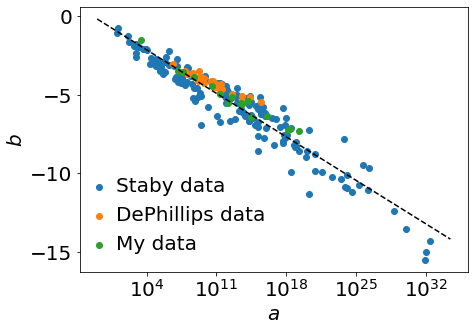

In [38]:
params = {'font.weight':'normal', 'font.size':20}
plt.rcParams.update(params)
fig, ax = plt.subplots()
fig.set_size_inches(7, 5, forward=True)
fig.patch.set_alpha(1.0)
ax.set_xlabel('$a$')
ax.set_ylabel('$b$')

ax.plot(a_vals_new, b_vals_new, linestyle='--', color='black')

ax.scatter(df_staby_params['a'], df_staby_params['b'], label='Staby data')
ax.scatter(df_dephil_k_params['a'], df_dephil_k_params['b'], label='DePhillips data')
ax.scatter(df_k_params['a'], df_k_params['b'], label='My data')

ax.legend(loc='lower left', frameon=False, handlelength=0.1)
ax.set_xscale('log')
plt.tight_layout()
fig.savefig('./images/kprime_lit_comparison/meta_correlation.png', dpi=300, 
            bbox='tight', transparent=False)

## Consolidation of all data

In [39]:
df_staby_params_2 = df_staby_params.copy()
df_staby_params_2.drop(columns=['paper', 'plot_letter'], inplace=True)
df_staby_params_2['data_set'] = 'Staby'

df_dephil_k_params_2 = df_dephil_k_params.copy()
df_dephil_k_params_2.drop(columns=['file'], inplace=True)
df_dephil_k_params_2['data_set'] = 'DePhillips'

df_k_params_2 = df_k_params.copy()
df_k_params_2.drop(columns=['file'], inplace=True)
df_k_params_2['data_set'] = 'My data'

df_all_params = pd.concat([df_staby_params_2, df_dephil_k_params_2, df_k_params_2])
df_all_params.reset_index(drop=True, inplace=True)
df_all_params

,resin,protein,a,b,data_set,pH
0,Express-Ion Q,anti-FVII mAb,1.023976e+32,-14.992294,Staby,NaN
1,Q HyperD 20,anti-FVII mAb,2.789091e+32,-14.280806,Staby,NaN
2,Source 30Q,anti-FVII mAb,5.390568e+18,-8.204895,Staby,NaN
3,Fractogel EMD TMAE 650s,anti-FVII mAb,1.035826e+20,-8.928643,Staby,NaN
4,Macro-Prep 25Q,anti-FVII mAb,1.307687e+18,-7.544828,Staby,NaN
...,...,...,...,...,...,...
207,pxq,ova,2.696475e+13,-5.493056,My data,7
208,sep,lys,1.967181e+19,-7.284316,My data,5
209,sep,lys,1.328047e+14,-5.421645,My data,7
210,sep,lys,3.272662e+13,-5.584334,My data,9


In [59]:
protein_rename = {'act':'alpha-chymotrypsinogen A', 'adh':'alcohol dehydrogenase',
                 'blg':'beta-lactoglobulin', 'cat':'catalase', 'ova':'ovalbumin',
                 'lys':'lysozyme', 'mAb':'BMS mAb D'}
resin_rename = {'caq':'Capto Q', 'phq':'Poros 50 HQ', 'pxq':'Poros XQ', 
                'sep':'SP Sepharose FF'}



In [ ]:
for i, icont in df_all_params.iterrows():
    if icont.resin in resin_rename:
        df_all_params.at[i, 'resin'] = resin_rename[icont.resin]
    if icont.protein in protein_rename:
        df_all_params.at[i, 'protein'] = protein_rename[icont.protein]

In [120]:
iex_types = {}
for i, icont in df_all_staby.iterrows():
    iex_types[icont['resin']] = icont['iex_type']

for i in set(df_dephil_k_params['resin']):
    iex_types[i] = 'cex'

iex_types['Capto Q'] = 'aex'
iex_types['Poros 50 HQ'] = 'aex'
iex_types['Poros XQ'] = 'aex'
iex_types['SP Sepharose FF'] = 'cex'

In [123]:
for i, icont in df_all_params.iterrows():
    df_all_params.at[i, 'iex_type'] = iex_types[icont['resin']]

In [124]:
df_all_params

,resin,protein,a,b,data_set,pH,iex_type
0,Express-Ion Q,anti-FVII mAb,1.023976e+32,-14.992294,Staby,NaN,aex
1,Q HyperD 20,anti-FVII mAb,2.789091e+32,-14.280806,Staby,NaN,aex
2,Source 30Q,anti-FVII mAb,5.390568e+18,-8.204895,Staby,NaN,aex
3,Fractogel EMD TMAE 650s,anti-FVII mAb,1.035826e+20,-8.928643,Staby,NaN,aex
4,Macro-Prep 25Q,anti-FVII mAb,1.307687e+18,-7.544828,Staby,NaN,aex
...,...,...,...,...,...,...,...
207,Poros XQ,ovalbumin,2.696475e+13,-5.493056,My data,7,aex
208,SP Sepharose FF,lysozyme,1.967181e+19,-7.284316,My data,5,cex
209,SP Sepharose FF,lysozyme,1.328047e+14,-5.421645,My data,7,cex
210,SP Sepharose FF,lysozyme,3.272662e+13,-5.584334,My data,9,cex


In [125]:
# df_all_params.to_csv('./lit_data/all_params.csv', index=False)

### Could I make a predictive model with the consolidated data set?

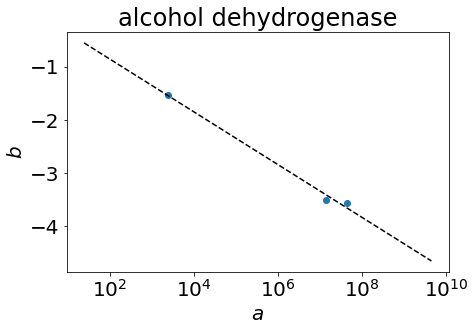

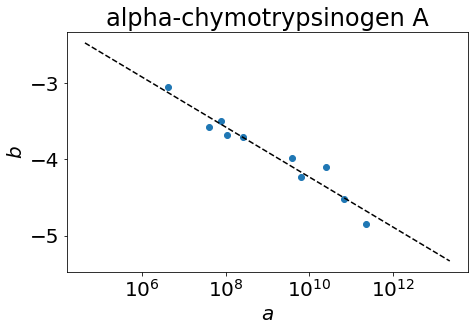

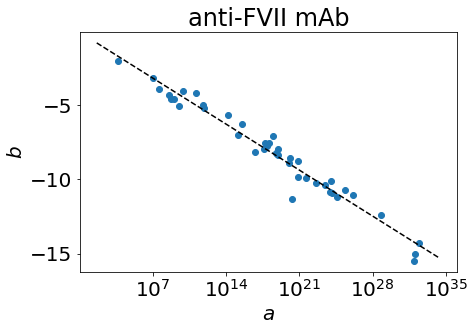

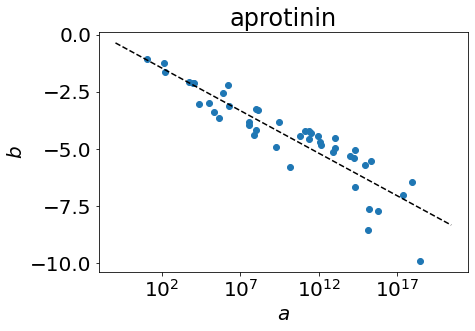

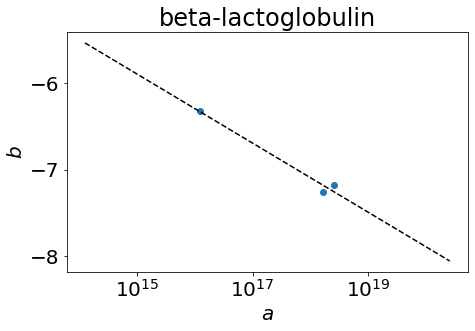

...

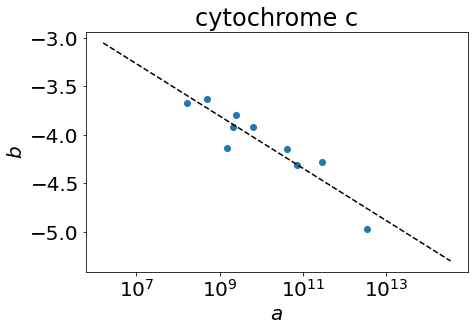

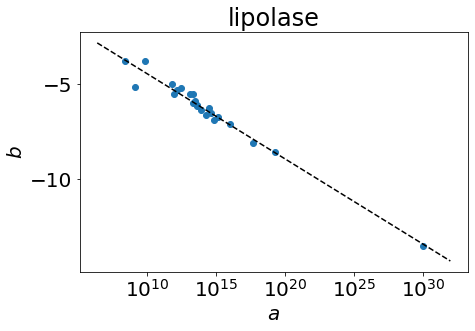

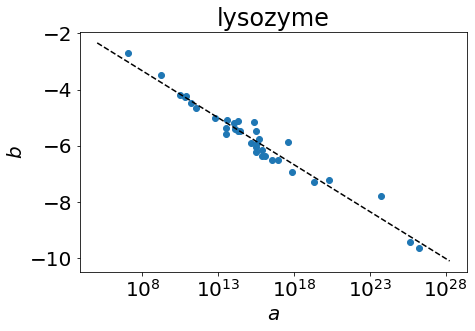

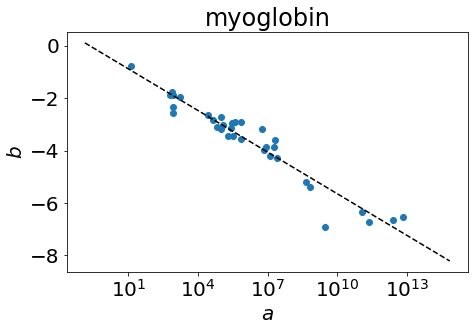

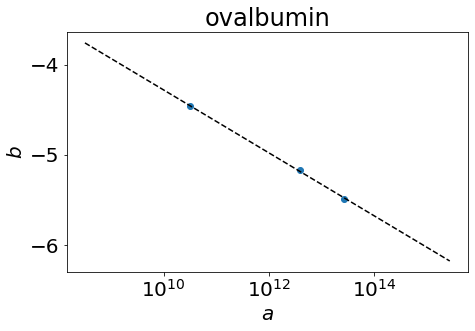

In [42]:
protein_list = list(set(df_all_params.protein))
protein_list.sort()

for protein in protein_list:
    df = df_all_params[df_all_params.protein==protein]
    if len(df) > 1:
    
        fit = optimize.least_squares(get_meta_residuals, x0=[1, 1], args=(df.a, df.b))
        c, d = fit.x[0], fit.x[1]
        a_vals_new = np.logspace(np.log10(min(df.a))-2.0, np.log10(max(df.a))+2.0)
        b_vals_new = [meta_correlation(a, c, d) for a in a_vals_new]

        params = {'font.weight':'normal', 'font.size':20}
        plt.rcParams.update(params)
        fig, ax = plt.subplots()
        fig.set_size_inches(7, 5, forward=True)
        fig.patch.set_alpha(1.0)
        ax.set_xlabel('$a$')
        ax.set_ylabel('$b$')
        plt.title(protein)

        ax.scatter(df.a, df.b)
        ax.plot(a_vals_new, b_vals_new, linestyle='--', color='black')

        ax.set_xscale('log')
        plt.tight_layout()

/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  from ipykernel import kernelapp as app


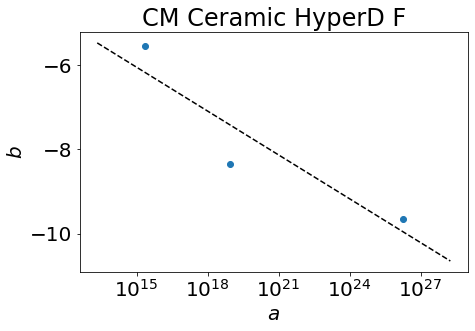

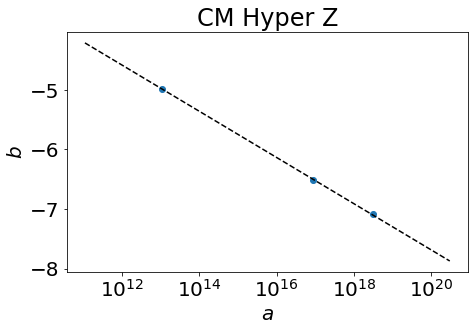

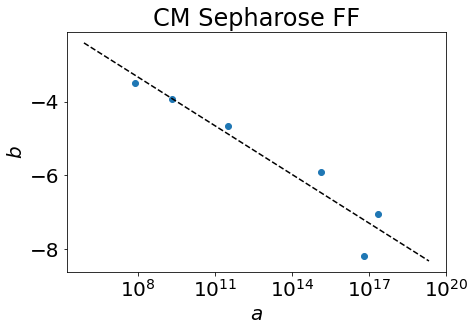

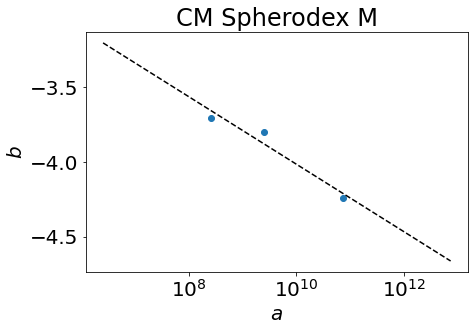

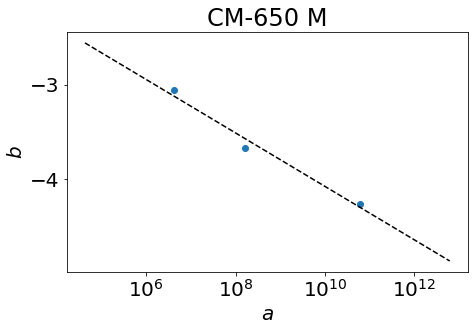

...

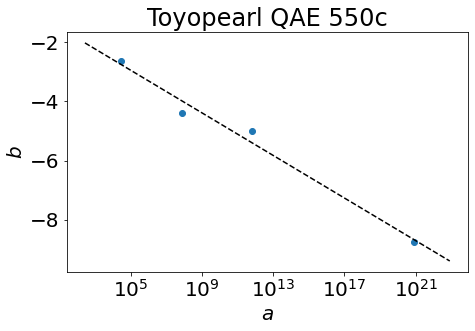

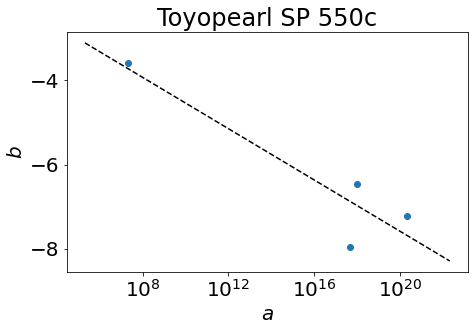

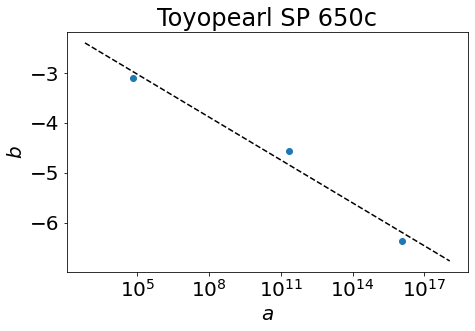

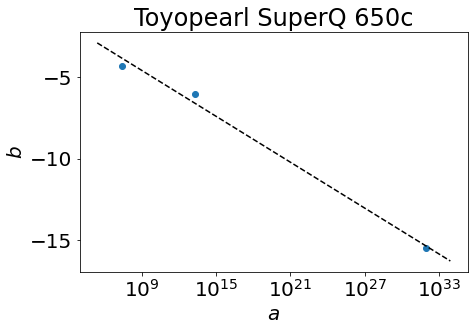

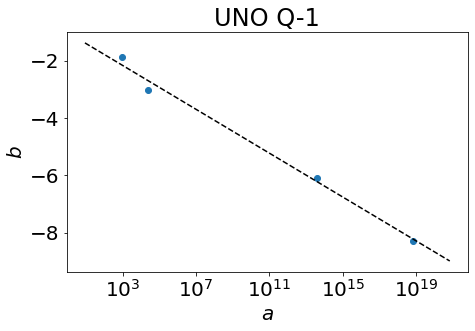

In [43]:
resin_list = list(set(df_all_params.resin))
resin_list.sort()

for resin in resin_list:
    df = df_all_params[df_all_params.resin==resin]
    if len(df) > 1:
    
        fit = optimize.least_squares(get_meta_residuals, x0=[1, 1], args=(df.a, df.b))
        c, d = fit.x[0], fit.x[1]
        a_vals_new = np.logspace(np.log10(min(df.a))-2.0, np.log10(max(df.a))+2.0)
        b_vals_new = [meta_correlation(a, c, d) for a in a_vals_new]

        params = {'font.weight':'normal', 'font.size':20}
        plt.rcParams.update(params)
        fig, ax = plt.subplots()
        fig.set_size_inches(7, 5, forward=True)
        fig.patch.set_alpha(1.0)
        ax.set_xlabel('$a$')
        ax.set_ylabel('$b$')
        plt.title(resin)

        ax.scatter(df.a, df.b)
        ax.plot(a_vals_new, b_vals_new, linestyle='--', color='black')

        ax.set_xscale('log')
        plt.tight_layout()

In [44]:
len(protein_list), len(resin_list)

(12, 57)

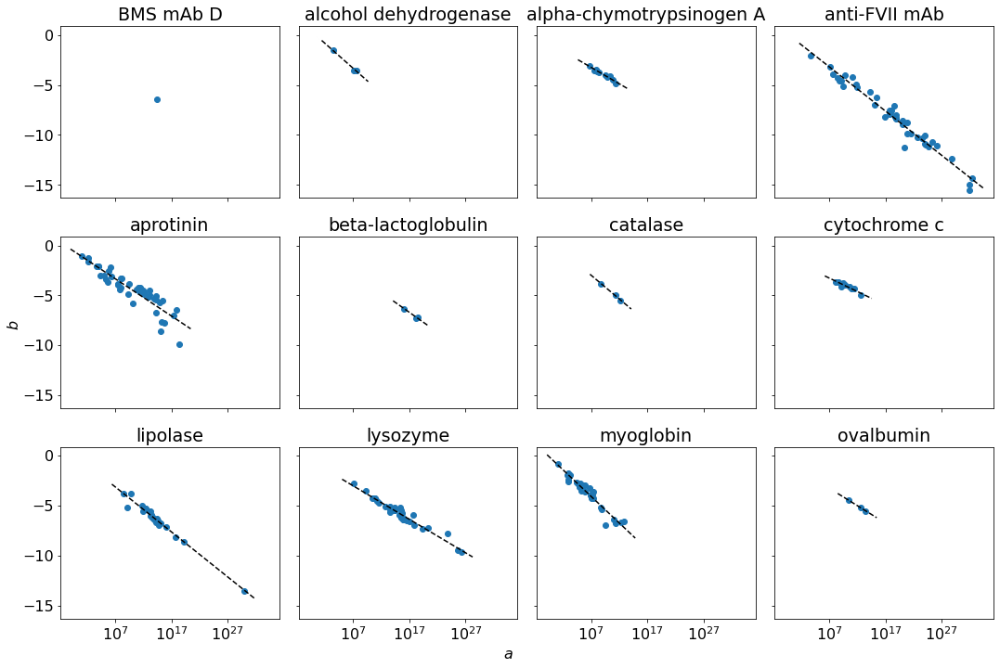

In [48]:
fig, ax = plt.subplots(3, 4, sharex=True, sharey=True)
params = {'font.weight':'normal', 'font.size':16}
plt.rcParams.update(params)
fig.set_size_inches(15, 10, forward=True)
fig.patch.set_alpha(1.0)
fig.text(0.5, 0.00, "$a$", ha='center')
fig.text(0.00, 0.5, "$b$", va='center', rotation='vertical')

for i, protein in enumerate(protein_list):
    row, column = math.floor(i/4), i%4
    ax[row, column].title.set_text(protein)
    df = df_all_params[df_all_params.protein==protein]
    ax[row, column].scatter(df.a, df.b)
    ax[row, column].set_xscale('log')

    if len(df) > 1:
        fit = optimize.least_squares(get_meta_residuals, x0=[1, 1], args=(df.a, df.b))
        c, d = fit.x[0], fit.x[1]
        a_vals_new = np.logspace(np.log10(min(df.a))-2.0, np.log10(max(df.a))+2.0)
        b_vals_new = [meta_correlation(a, c, d) for a in a_vals_new]
        ax[row, column].plot(a_vals_new, b_vals_new, linestyle='--', color='black')

plt.tight_layout()
fig.savefig('./images/kprime_lit_comparison/all_data_meta_for_each_protein.png', dpi=300)

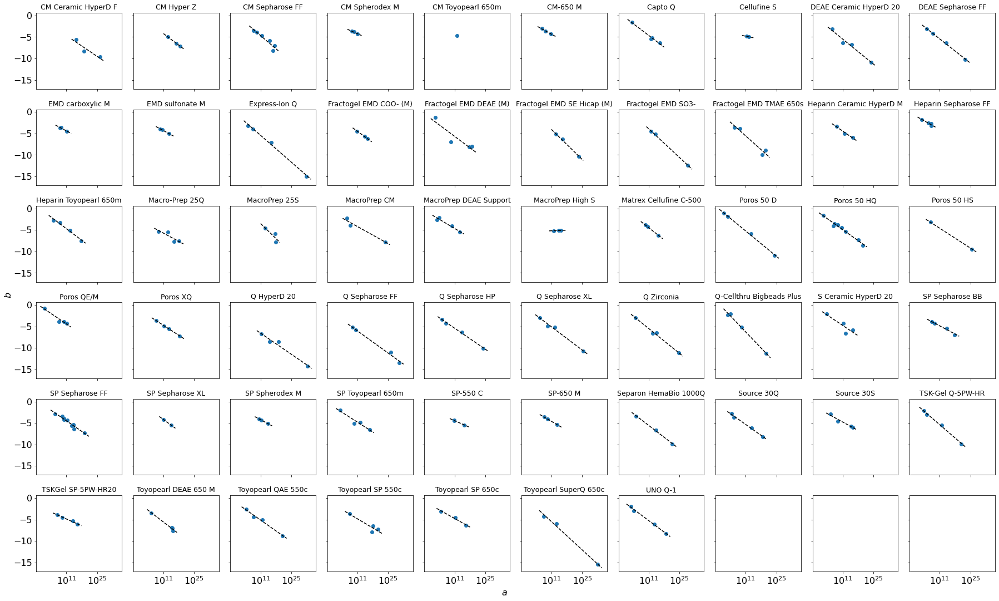

In [47]:
n_row, n_col = 6, 10
fig, ax = plt.subplots(n_row, n_col, sharex=True, sharey=True)
params = {'font.weight':'normal', 'font.size':16}
plt.rcParams.update(params)
fig.set_size_inches(25, 15, forward=True)
fig.patch.set_alpha(1.0)
fig.text(0.5, 0.00, "$a$", ha='center')
fig.text(0.00, 0.5, "$b$", va='center', rotation='vertical')

for i, resin in enumerate(resin_list):
    row, column = math.floor(i/n_col), i%n_col
    ax[row, column].set_title(resin, {'fontsize':12.5}) # title.set_text
    df = df_all_params[df_all_params.resin==resin]
    ax[row, column].scatter(df.a, df.b)
    ax[row, column].set_xscale('log')

    if len(df) > 1:
        fit = optimize.least_squares(get_meta_residuals, x0=[1, 1], args=(df.a, df.b))
        c, d = fit.x[0], fit.x[1]
        a_vals_new = np.logspace(np.log10(min(df.a))-2.0, np.log10(max(df.a))+2.0)
        b_vals_new = [meta_correlation(a, c, d) for a in a_vals_new]
        ax[row, column].plot(a_vals_new, b_vals_new, linestyle='--', color='black')

plt.tight_layout()
fig.savefig('./images/kprime_lit_comparison/all_data_meta_for_each_resin.png', dpi=300)

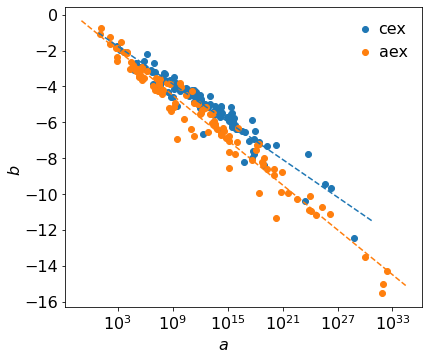

In [133]:
fig, ax = plt.subplots()
params = {'font.weight':'normal', 'font.size':16}
plt.rcParams.update(params)
fig.set_size_inches(6, 5, forward=True)
fig.patch.set_alpha(1.0)
fig.text(0.5, 0.00, "$a$", ha='center')
fig.text(0.00, 0.5, "$b$", va='center', rotation='vertical')

iex_type_list = ['cex', 'aex']
for i, iex_type in enumerate(iex_type_list):
    row, column = math.floor(i/4), i%4
    df = df_all_params[df_all_params.iex_type==iex_type]
    ax.scatter(df.a, df.b, label=iex_type)
    ax.set_xscale('log')

    if len(df) > 1:
        fit = optimize.least_squares(get_meta_residuals, x0=[1, 1], args=(df.a, df.b))
        c, d = fit.x[0], fit.x[1]
        a_vals_new = np.logspace(np.log10(min(df.a))-2.0, np.log10(max(df.a))+2.0)
        b_vals_new = [meta_correlation(a, c, d) for a in a_vals_new]
        ax.plot(a_vals_new, b_vals_new, linestyle='--')

ax.legend(loc='best', handlelength=0.1, frameon=False)
plt.tight_layout()
fig.savefig('./images/kprime_lit_comparison/all_data_meta_for_each_iex_type.png', dpi=300)

# Consolidation of k'-IS data

In [180]:
df_all_my_k = pd.DataFrame()

for key in dfs_k.keys():
    protein = protein_rename[key[key.find('_')+1:key.find('_')+4]]
    resin = resin_rename[key[:key.find('_')]]
    pH = key[key.find('.')-1:key.find('.')]
    
    if resin == 'SP Sepharose FF':
        iex_type = 'cex'
    else:
        iex_type = 'aex'
    
    df = dfs_k[key]
    df['resin'] = resin
    df['protein'] = protein
    df['iex_type'] = iex_type
    df['pH'] = float(pH)
    
    df_all_my_k = pd.concat([df_all_my_k, df], ignore_index=True)

df_all_my_k['tis_mM'] = 1e3*df_all_my_k['IS (M)']
df_all_my_k.drop(['k_prime_std', 'IS (M)'], axis=1, inplace=True)
df_all_my_k['data_set'] = 'mine'
df_all_my_k.rename(columns={'k_prime':'kprime'}, inplace=True)

In [185]:
df_all_my_k

,kprime,resin,protein,iex_type,pH,tis_mM,data_set
0,4.031122,Capto Q,alcohol dehydrogenase,aex,7.0,66.801750,mine
1,3.031028,Capto Q,alcohol dehydrogenase,aex,7.0,80.047060,mine
2,2.381777,Capto Q,alcohol dehydrogenase,aex,7.0,92.273500,mine
3,1.650520,Capto Q,alcohol dehydrogenase,aex,7.0,117.745250,mine
4,1.122211,Capto Q,alcohol dehydrogenase,aex,7.0,143.217000,mine
...,...,...,...,...,...,...,...
95,18.535426,SP Sepharose FF,BMS mAb D,cex,7.0,113.838144,mine
96,4.382216,SP Sepharose FF,BMS mAb D,cex,7.0,138.808470,mine
97,0.989917,SP Sepharose FF,BMS mAb D,cex,7.0,175.457421,mine
98,0.578085,SP Sepharose FF,BMS mAb D,cex,7.0,193.175385,mine


In [182]:
df_all_dephillips_k = pd.DataFrame()

for protein_key in dfs_k_dephillips.keys():
    df = dfs_k_dephillips[protein_key]
    protein = protein_key[:protein_key.find('_')]
    if protein == 'act':
        protein = protein_rename[protein]
    
    df_new = pd.DataFrame()
    for resin in df.columns:
        if resin == 'NaCl (M)' or resin == 'IS [mM]':
            pass
        else:
            df_append = df[['IS [mM]', resin]].copy()
            df_append.columns = ['IS [mM]', 'kprime']
            df_append['resin'] = resin
            df_new = pd.concat([df_new, df_append], ignore_index=True, copy=False)  
    df_new['iex_type'] = 'cex'
    df_new['protein'] = protein
    df_new.dropna(inplace=True)
    df_new.to_csv(f'./lit_data/dephillips/cleaned_data/intra_protein_comparisons/{protein}.csv')
    
    df_all_dephillips_k = pd.concat([df_all_dephillips_k, df_new], ignore_index=True)
    
df_all_dephillips_k.rename(columns={'IS [mM]':'tis_mM'}, inplace=True)
df_all_dephillips_k['data_set'] = 'DePhillips'
df_all_dephillips_k['pH'] = 7.0
df_all_dephillips_k.to_csv(f'./lit_data/dephillips/cleaned_data/intra_protein_comparisons/all_data.csv')

In [183]:
df_all_dephillips_k

,tis_mM,kprime,resin,iex_type,protein,data_set,pH
0,85.0,51.829281,SP Sepharose FF,cex,alpha-chymotrypsinogen A,DePhillips,7.0
1,110.0,14.542370,SP Sepharose FF,cex,alpha-chymotrypsinogen A,DePhillips,7.0
2,135.0,6.201620,SP Sepharose FF,cex,alpha-chymotrypsinogen A,DePhillips,7.0
3,160.0,2.724929,SP Sepharose FF,cex,alpha-chymotrypsinogen A,DePhillips,7.0
4,185.0,1.369794,SP Sepharose FF,cex,alpha-chymotrypsinogen A,DePhillips,7.0
...,...,...,...,...,...,...,...
288,610.0,1.362389,SP-550 C,cex,lysozyme,DePhillips,7.0
289,710.0,0.693140,SP-550 C,cex,lysozyme,DePhillips,7.0
290,810.0,0.455209,SP-550 C,cex,lysozyme,DePhillips,7.0
291,910.0,0.303474,SP-550 C,cex,lysozyme,DePhillips,7.0


In [191]:
df_all_staby['tis_mM'] = 1e3*df_all_staby.tis_M
df_all_staby['data_set'] = 'Staby'

for i, icont in df_all_staby.iterrows():
    if icont.iex_type == 'cex':
        df_all_staby.at[i, 'pH'] = 5.5
    else:
        if icont.protein == 'anti-FVII mAb' or icont.protein == 'lipolase':
            df_all_staby.at[i, 'pH'] = 8.0
        elif icont.protein == 'aprotinin' or icont.protein == 'myoglobin':
            df_all_staby.at[i, 'pH'] = 9.0
        else:
            print('problem')


In [192]:
df_all_staby

,paper,plot_letter,protein,iex_type,resin,x,tis_M,kprime,tis_mM,data_set,pH
0,1,a,anti-FVII mAb,aex,Express-Ion Q,7.98160,0.125288,3.594500,125.288163,Staby,8.0
1,1,a,anti-FVII mAb,aex,Express-Ion Q,7.34610,0.136127,1.098900,136.126652,Staby,8.0
2,1,a,anti-FVII mAb,aex,Express-Ion Q,6.60740,0.151345,0.303330,151.345461,Staby,8.0
3,1,a,anti-FVII mAb,aex,Express-Ion Q,6.03110,0.165807,0.038518,165.807233,Staby,8.0
4,1,a,anti-FVII mAb,aex,Fractogel EMD TMAE 650s,7.39780,0.135175,11.520000,135.175322,Staby,8.0
...,...,...,...,...,...,...,...,...,...,...,...
805,6,d,myoglobin,aex,Toyopearl DEAE 650 M,1.51511,0.030541,3.256100,30.541474,Staby,9.0
806,6,d,myoglobin,aex,Toyopearl DEAE 650 M,1.38996,0.040742,0.760800,40.741780,Staby,9.0
807,6,d,myoglobin,aex,Toyopearl DEAE 650 M,1.29578,0.050608,0.390380,50.608096,Staby,9.0
808,6,d,myoglobin,aex,Toyopearl DEAE 650 M,1.21703,0.060669,0.248650,60.669442,Staby,9.0


In [194]:
df_all_k = pd.concat([df_all_my_k, df_all_dephillips_k, df_all_staby]) # need index reset
df_all_k.drop(columns=['paper', 'plot_letter', 'x', 'tis_M'], inplace=True)
df_all_k = df_all_k[['data_set', 'iex_type', 'resin', 'protein', 'pH', 'tis_mM', 'kprime']]
df_all_k.to_csv('./lit_data/all_kprime.csv', index=False)

df_all_k

,data_set,iex_type,resin,protein,pH,tis_mM,kprime
0,mine,aex,Capto Q,alcohol dehydrogenase,7.0,66.801750,4.031122
1,mine,aex,Capto Q,alcohol dehydrogenase,7.0,80.047060,3.031028
2,mine,aex,Capto Q,alcohol dehydrogenase,7.0,92.273500,2.381777
3,mine,aex,Capto Q,alcohol dehydrogenase,7.0,117.745250,1.650520
4,mine,aex,Capto Q,alcohol dehydrogenase,7.0,143.217000,1.122211
...,...,...,...,...,...,...,...
805,Staby,aex,Toyopearl DEAE 650 M,myoglobin,9.0,30.541474,3.256100
806,Staby,aex,Toyopearl DEAE 650 M,myoglobin,9.0,40.741780,0.760800
807,Staby,aex,Toyopearl DEAE 650 M,myoglobin,9.0,50.608096,0.390380
808,Staby,aex,Toyopearl DEAE 650 M,myoglobin,9.0,60.669442,0.248650


# Expansion with other data sets

In [86]:
df_all_k = pd.read_csv('./lit_data/all_kprime.csv')

In [87]:
df_bai_k = pd.read_csv('./lit_data/bai/consolidated_data.csv')
df_bai_k['tis_mM'] = 1e3 * 10**df_bai_k['log[NaCl]'] + 20.0
df_bai_k['kprime'] = 10**df_bai_k['log_kprime']
df_bai_k['data_set'] = 'bai'
df_bai_k.drop(columns=['buffer', 'log[NaCl]', 'log_kprime'], inplace=True)

df_all_k = pd.concat([df_all_k, df_bai_k], ignore_index=True)
# df_all_k

In [88]:
second_resin_rename = {'Toyopearl SP 550c':'SP-550 C', 
                       'Cellufine S':'Cellufine sulfate'}

In [89]:
for i, icont in df_all_k.iterrows():
    if icont.resin in second_resin_rename:
        df_all_k.at[i, 'resin'] = second_resin_rename[icont.resin]

In [90]:
df_fgf = pd.read_csv('./lit_data/dephillips/cleaned_data/fgf_both.csv')
df_fgf['kprime'] = 10**df_fgf.log_kprime
df_fgf['tis_mM'] = 1e3*df_fgf['[NaCl]'] + 10
df_fgf.drop(columns=['[NaCl]', 'log_kprime'], inplace=True)

df_all_k = pd.concat([df_all_k, df_fgf], ignore_index=True)
# df_all_k

In [95]:
df_kumar = pd.read_csv('./lit_data/kumar/combined_cleaned.csv')
df_all_k = pd.concat([df_all_k, df_kumar], ignore_index=True)
# df_all_k

In [94]:
# df_all_k.to_csv('./lit_data/all_kprime.csv', index=False)

In [200]:
series = set(zip(df_all_k.data_set, df_all_k.iex_type, df_all_k.resin, 
                 df_all_k.protein, df_all_k.pH))

cnt = 0
for data_set, iex_type, resin, protein, pH in series:
    if (data_set == 'bai') or (data_set == 'kumar') or ('FGF' in protein):
        cnt += 1

In [201]:
cnt

34

# Two-parameter model 
With expanded data set

In [4]:
df_all_k = pd.read_csv('./lit_data/all_kprime.csv')
df_all_k.fillna(0.0, inplace=True) # Replacing unknown pH values with 0 to facilitate plotting
# df_all_k

In [5]:
# series = set(zip(df_all_k.data_set, df_all_k.iex_type, df_all_k.resin, 
#                  df_all_k.protein, df_all_k.pH))
# len(series)

246

In [5]:
# for i, icont in df_all_k.iterrows():
#     if icont.resin in resin_rename:
#         df_all_k.at[i, 'resin'] = resin_rename[icont.resin]

# Haven't resaved externally

In [6]:
# temp = []

# for data_set, iex_type, resin, protein, pH in series:
#     df = df_all_k[(df_all_k.data_set==data_set) &\
#                  (df_all_k.iex_type==iex_type) &\
#                  (df_all_k.resin==resin) &\
#                  (df_all_k.protein==protein) &\
#                  (df_all_k.pH==pH)]
    
#     fit_params = optimize.curve_fit(my_fit_function_ln_keq_2, 
#                                     df.tis_mM, np.log(df.kprime), p0=(1, -50),
#                                    maxfev=3000)
#     temp.append([data_set, iex_type, resin, protein, pH, fit_params[0][0], 
#                  fit_params[0][1]])

# columns = ['data_set', 'iex_type', 'resin', 'protein', 'pH', 'a', 'b']
# df_2_fit_parms = pd.DataFrame(temp, columns=columns)
# df_2_fit_parms.to_csv('./lit_data/two_params_all_data_updated_mAb_D.csv')

/home/chase/anaconda3/lib/python3.7/site-packages/scipy/optimize/minpack.py:829: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)
/home/chase/anaconda3/lib/python3.7/site-packages/scipy/optimize/minpack.py:829: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)
/home/chase/anaconda3/lib/python3.7/site-packages/scipy/optimize/minpack.py:829: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)
/home/chase/anaconda3/lib/python3.7/site-packages/scipy/optimize/minpack.py:829: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)
/home/chase/anaconda3/lib/python3.7/site-packages/scipy/optimize/minpack.py:829: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)
/home/chase/anaconda3/lib/python3.7/site-packages/scipy/optimize/minpack.py:829: OptimizeWarning: Covariance o

In [7]:
# df_2_fit_parms = pd.read_csv('./lit_data/two_params_all_data.csv')
df_2_fit_parms = pd.read_csv('./lit_data/two_params_all_data_updated_mAb_D.csv')
# df_2_fit_parms = pd.read_csv('./lit_data/two_params_without_my_data.csv')

In [8]:
resins = list(set(df_2_fit_parms.resin))
resins.sort()

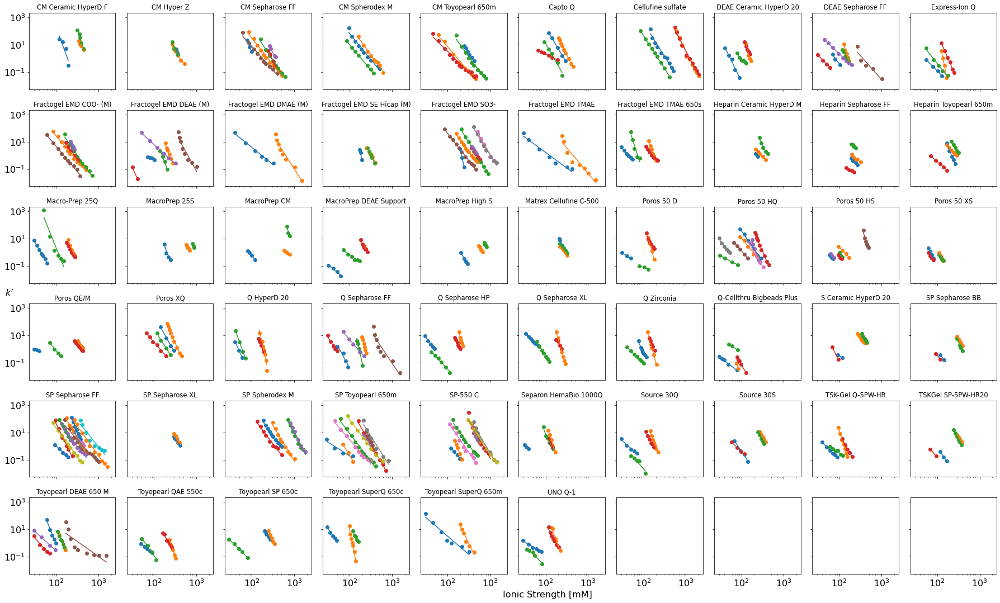

In [12]:
n_row, n_col = 6, 10
fig, ax = plt.subplots(n_row, n_col, sharex=True, sharey=True)
params = {'font.weight':'normal', 'font.size':16}
plt.rcParams.update(params)
fig.set_size_inches(25, 15, forward=True)
fig.patch.set_alpha(1.0)
fig.text(0.01, 0.5, "$k'$", ha='center')
fig.text(0.5, 0.001, 'Ionic Strength [mM]')

for i, resin in enumerate(resins):
    row, column = math.floor(i/n_col), i%n_col
    ax[row, column].set_title(resin, {'fontsize':11.5}) # title.set_text
    df = df_all_k[(df_all_k.resin==resin)]
    
    sub_pairs = set(zip(df.data_set, df.protein, df.pH))
    for (data_set, protein, pH) in sub_pairs:
        df_sub = df[(df.data_set==data_set) & (df.protein==protein) & (df.pH==pH)]
        ax[row, column].scatter(df_sub.tis_mM, df_sub.kprime)

        df_params = df_2_fit_parms[(df_2_fit_parms.protein==protein) &\
                            (df_2_fit_parms.pH==pH) &\
                            (df_2_fit_parms.resin==resin) &\
                            (df_2_fit_parms.data_set==data_set)].copy()
        df_params.reset_index(inplace=True, drop=True)
        a, b = df_params.at[0, 'a'], df_params.at[0, 'b']

        tis_vals = np.linspace(min(df_sub.tis_mM), max(df_sub.tis_mM))
        kprime_fit = [a*tis**b for tis in tis_vals]
        ax[row, column].loglog(tis_vals, kprime_fit)

plt.tight_layout()
# fig.savefig('./images/kprime_lit_comparison/two_param_model_all_data.png', dpi=300)

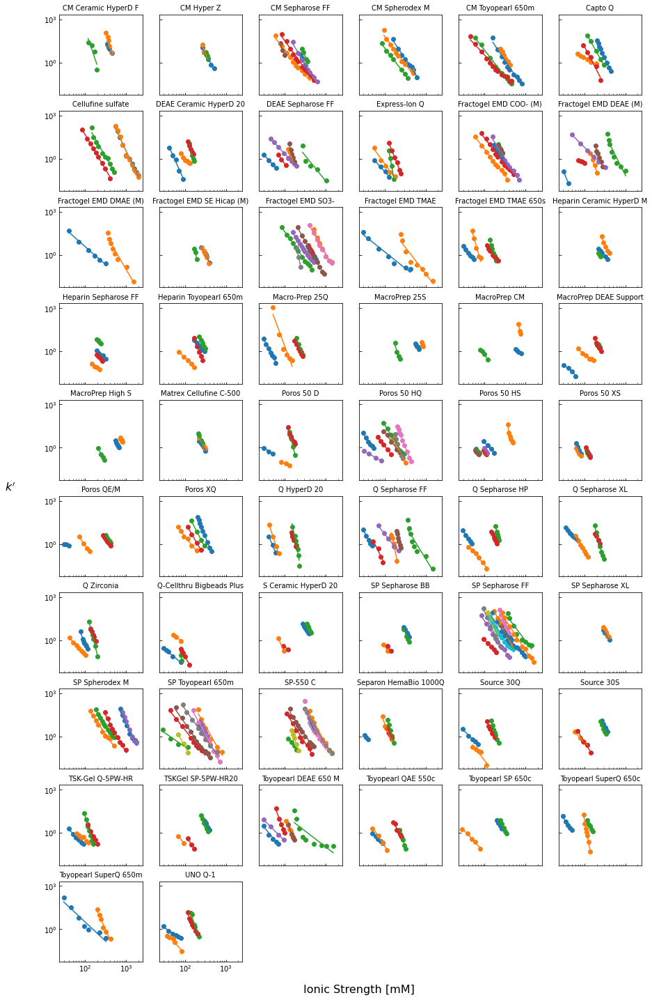

In [9]:
n_row, n_col = 10, 6
fig, ax = plt.subplots(n_row, n_col, sharex=True, sharey=True)
params = {'font.weight':'normal', 'font.size':16}
plt.rcParams.update(params)
fig.set_size_inches(15, 25, forward=True)
fig.patch.set_alpha(1.0)
fig.text(0.06, 0.5, "$k'$", ha='center')
fig.text(0.45, 0.1, 'Ionic Strength [mM]')

for i, resin in enumerate(resins):
    row, column = math.floor(i/n_col), i%n_col
    ax[row, column].set_title(resin, {'fontsize':10}) # title.set_text
    ax[row, column].tick_params('both', which='major', direction='in')
    ax[row, column].tick_params('both', which='minor', direction='in')
    df = df_all_k[(df_all_k.resin==resin)]
    
    sub_pairs = set(zip(df.data_set, df.protein, df.pH))
    for (data_set, protein, pH) in sub_pairs:
        df_sub = df[(df.data_set==data_set) & (df.protein==protein) & (df.pH==pH)]
        ax[row, column].scatter(df_sub.tis_mM, df_sub.kprime)

        df_params = df_2_fit_parms[(df_2_fit_parms.protein==protein) &\
                            (df_2_fit_parms.pH==pH) &\
                            (df_2_fit_parms.resin==resin) &\
                            (df_2_fit_parms.data_set==data_set)].copy()
        df_params.reset_index(inplace=True, drop=True)
        a, b = df_params.at[0, 'a'], df_params.at[0, 'b']

        tis_vals = np.linspace(min(df_sub.tis_mM), max(df_sub.tis_mM))
        kprime_fit = [a*tis**b for tis in tis_vals]
        ax[row, column].loglog(tis_vals, kprime_fit)

fig.delaxes(ax[n_row-1, n_col-4])
fig.delaxes(ax[n_row-1, n_col-3])
fig.delaxes(ax[n_row-1, n_col-2])
fig.delaxes(ax[n_row-1, n_col-1])
# plt.tight_layout()

fig.savefig('./images/manuscript_images/consolidated_lit_data_updated_mAb_D.pdf')

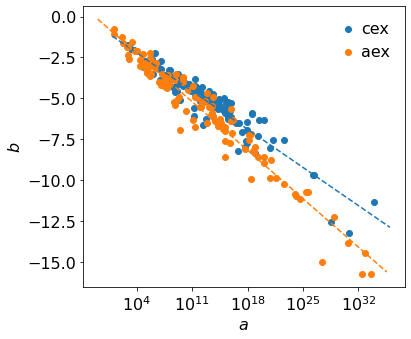

In [7]:
fig, ax = plt.subplots()
params = {'font.weight':'normal', 'font.size':16}
plt.rcParams.update(params)
fig.set_size_inches(6, 5, forward=True)
fig.patch.set_alpha(1.0)
ax.set_xlabel('$a$')
ax.set_ylabel('$b$')
ax.set_xscale('log')

iex_type_list = ['cex', 'aex']
for iex_type in iex_type_list:
    df = df_2_fit_parms[df_2_fit_parms.iex_type==iex_type]
    ax.scatter(df.a, df.b, label=iex_type)

    fit = optimize.least_squares(get_meta_residuals, x0=[1, 1], args=(df.a, df.b))
    c, d = fit.x[0], fit.x[1]
    a_vals_new = np.logspace(np.log10(min(df.a))-2.0, np.log10(max(df.a))+2.0)
    b_vals_new = [meta_correlation(a, c, d) for a in a_vals_new]
    ax.plot(a_vals_new, b_vals_new, linestyle='--')

ax.legend(loc='best', handlelength=0.1, frameon=False)
plt.tight_layout()
# fig.savefig('./images/kprime_lit_comparison/all_data_meta_for_each_iex_type.png', dpi=300)

No handles with labels found to put in legend.


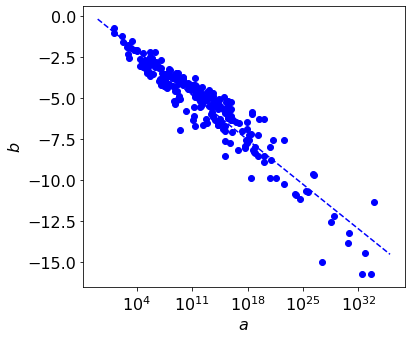

In [8]:
fig, ax = plt.subplots()
params = {'font.weight':'normal', 'font.size':16}
plt.rcParams.update(params)
fig.set_size_inches(6, 5, forward=True)
fig.patch.set_alpha(1.0)
ax.set_xlabel('$a$')
ax.set_ylabel('$b$')
ax.set_xscale('log')

df = df_2_fit_parms
ax.scatter(df.a, df.b, color='blue')

fit = optimize.least_squares(get_meta_residuals, x0=[1, 1], args=(df.a, df.b))
c, d = fit.x[0], fit.x[1]
a_vals_new = np.logspace(np.log10(min(df.a))-2.0, np.log10(max(df.a))+2.0)
b_vals_new = [meta_correlation(a, c, d) for a in a_vals_new]
ax.plot(a_vals_new, b_vals_new, linestyle='--', color='blue')

ax.legend(loc='best', handlelength=0.1, frameon=False)
plt.tight_layout()
# fig.savefig('./images/kprime_lit_comparison/all_data_meta_no_iex_type_distinction.png', dpi=300)

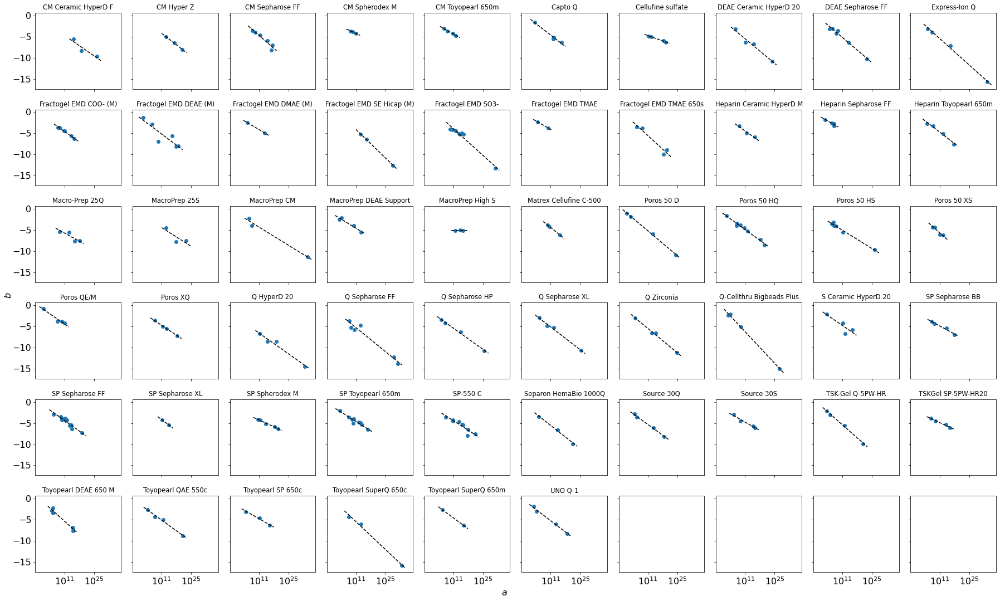

In [23]:
n_row, n_col = 6, 10
fig, ax = plt.subplots(n_row, n_col, sharex=True, sharey=True)
params = {'font.weight':'normal', 'font.size':16}
plt.rcParams.update(params)
fig.set_size_inches(25, 15, forward=True)
fig.patch.set_alpha(1.0)
fig.text(0.5, 0.001, "$a$", ha='center')
fig.text(0.001, 0.5, "$b$", va='center', rotation='vertical')

cd_vals = []

for i, resin in enumerate(resins):
    row, column = math.floor(i/n_col), i%n_col
    ax[row, column].set_title(resin, {'fontsize':11.5})
    df = df_2_fit_parms[df_2_fit_parms.resin==resin]
    ax[row, column].scatter(df.a, df.b)
    ax[row, column].set_xscale('log')

    if len(df) > 1:
        fit = optimize.least_squares(get_meta_residuals, x0=[1, 1], args=(df.a, df.b))
        c, d = fit.x[0], fit.x[1]
        a_vals_new = np.logspace(np.log10(min(df.a))-2.0, np.log10(max(df.a))+2.0)
        b_vals_new = [meta_correlation(a, c, d) for a in a_vals_new]
        ax[row, column].plot(a_vals_new, b_vals_new, linestyle='--', color='black')
        cd_vals.append((resin, c, d))

df_cd = pd.DataFrame(cd_vals, columns=['resin', 'c', 'd'])

plt.tight_layout()
# fig.savefig('./images/kprime_lit_comparison/two_param_all_data_data_meta_params.png', dpi=300)

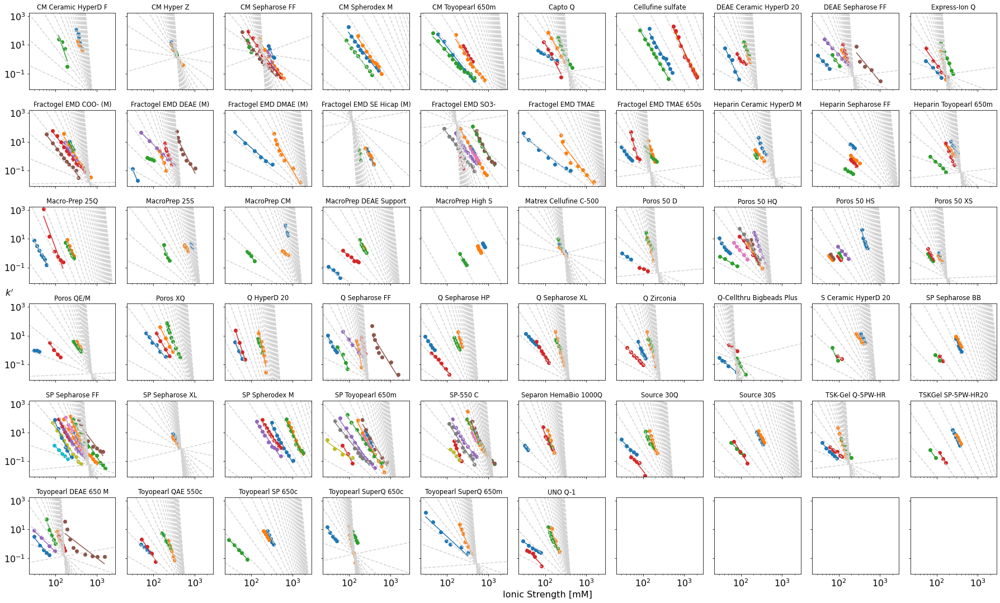

In [33]:
n_row, n_col = 6, 10
fig, ax = plt.subplots(n_row, n_col, sharex=True, sharey=True)
params = {'font.weight':'normal', 'font.size':16}
plt.rcParams.update(params)
fig.set_size_inches(25, 15, forward=True)
fig.patch.set_alpha(1.0)
fig.text(0.01, 0.5, "$k'$", ha='center')
fig.text(0.5, 0.001, 'Ionic Strength [mM]')

for i, resin in enumerate(resins):
    row, column = math.floor(i/n_col), i%n_col
    ax[row, column].set_title(resin, {'fontsize':11.5}) # title.set_text
    df = df_all_k[(df_all_k.resin==resin)]
    
    sub_pairs = set(zip(df.data_set, df.protein, df.pH))
    for (data_set, protein, pH) in sub_pairs:
        df_sub = df[(df.data_set==data_set) & (df.protein==protein) & (df.pH==pH)]
        ax[row, column].scatter(df_sub.tis_mM, df_sub.kprime)

        df_params = df_2_fit_parms[(df_2_fit_parms.protein==protein) &\
                            (df_2_fit_parms.pH==pH) &\
                            (df_2_fit_parms.resin==resin) &\
                            (df_2_fit_parms.data_set==data_set)].copy()
        df_params.reset_index(inplace=True, drop=True)
        a, b = df_params.at[0, 'a'], df_params.at[0, 'b']

        tis_vals = np.linspace(min(df_sub.tis_mM), max(df_sub.tis_mM))
        kprime_fit = [a*tis**b for tis in tis_vals]
        ax[row, column].loglog(tis_vals, kprime_fit)
        
    c = df_cd.loc[df_cd['resin'] == resin, 'c'].iloc[0]
    d = df_cd.loc[df_cd['resin'] == resin, 'd'].iloc[0]
    a_vals = np.logspace(-2, 100, 31)
    tis_new = np.linspace(10, 3e3, 1000)
    for a in a_vals:
        b = meta_correlation(a, c, d)
        k = [a*tis**b for tis in tis_new]
        ax[row, column].loglog(tis_new, k, '--', color='lightgrey')
    ax[row, column].set_xlim(0.8*df_all_k.tis_mM.min(), 1.4*df_all_k.tis_mM.max())
    ax[row, column].set_ylim(0.8*df_all_k.kprime.min(), 1.4*df_all_k.kprime.max())

plt.tight_layout()
# fig.savefig('./images/kprime_lit_comparison/two_param_model_all_data_meta_corr_comparison.png', dpi=300)

# 3-parameter model

In [396]:
def my_three_param_model(tis, a, b, c):
    return a*(np.log(tis))**b + c

def yam_three_param_model(tis, a, b, c):
    a = np.exp(a)
    return np.log(a*tis**b + c)

def get_three_param_resid(x, tis, kprime, function=my_three_param_model):
    a = x[0]
    b = x[1]
    c = x[2]
    return np.log(kprime) - function(tis, a, b, c)

def get_norm(x, tis, kprime, function):
    return np.linalg.norm(np.array(get_three_param_resid(x, tis, kprime, function)))

In [144]:
df_all_k = pd.read_csv('./lit_data/all_kprime.csv')
# Replacing unknown pH values with 0 to facilitate plotting
df_all_k.fillna(0.0, inplace=True)
df_all_k

,data_set,iex_type,resin,protein,pH,tis_mM,kprime
0,mine,aex,Capto Q,alcohol dehydrogenase,7.0,66.80175,4.031122
1,mine,aex,Capto Q,alcohol dehydrogenase,7.0,80.04706,3.031028
2,mine,aex,Capto Q,alcohol dehydrogenase,7.0,92.27350,2.381777
3,mine,aex,Capto Q,alcohol dehydrogenase,7.0,117.74525,1.650520
4,mine,aex,Capto Q,alcohol dehydrogenase,7.0,143.21700,1.122211
...,...,...,...,...,...,...,...
1422,kumar,cex,Poros 50 XS,mAb main variant,6.5,139.66900,0.259259
1423,kumar,cex,Poros 50 XS,mAb main variant,7.0,61.89100,0.925524
1424,kumar,cex,Poros 50 XS,mAb main variant,7.0,67.93400,0.570307
1425,kumar,cex,Poros 50 XS,mAb main variant,7.0,74.17200,0.383470


In [187]:
pairs = set(zip(df_all_k.data_set, df_all_k.resin, df_all_k.protein, df_all_k.iex_type, df_all_k.pH))

fit_param_res = []
for i, (data_set, resin, protein, iex_type, pH) in enumerate(pairs):
    df = df_all_k[(df_all_k.resin==resin) & (df_all_k.protein==protein) &\
                  (df_all_k.pH == pH) & (df_all_k.data_set==data_set)]
    
    if len(df) > 2:
        fit = optimize.least_squares(get_three_param_resid, x0=[5, 1, 0],
                                     args=(df.tis_mM, df.kprime, yam_three_param_model))
        a_yam, b_yam, c_yam = fit.x[0], fit.x[1], fit.x[2]
        fit_param_res.append([data_set, resin, protein, iex_type, pH, a_yam, b_yam, c_yam])
    
df_three_params = pd.DataFrame(fit_param_res, columns=['data_set', 'resin', 'protein', 
                               'iex_type', 'pH', 'log_a_yam', 'b_yam', 'c_yam']) 

/home/chase/anaconda3/lib/python3.7/site-packages/pandas/core/series.py:726: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/chase/anaconda3/lib/python3.7/site-packages/pandas/core/series.py:726: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/chase/anaconda3/lib/python3.7/site-packages/pandas/core/series.py:726: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/chase/anaconda3/lib/python3.7/site-packages/pandas/core/series.py:726: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/chase/anaconda3/lib/python3.7/site-packages/pandas/core/series.py:726: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/chase/anaconda3/lib/python3.7/site-packages/pandas/core/series.py:726: RuntimeWarning: invalid valu

/home/chase/anaconda3/lib/python3.7/site-packages/pandas/core/series.py:726: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/chase/anaconda3/lib/python3.7/site-packages/pandas/core/series.py:726: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/chase/anaconda3/lib/python3.7/site-packages/pandas/core/series.py:726: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/chase/anaconda3/lib/python3.7/site-packages/pandas/core/series.py:726: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/chase/anaconda3/lib/python3.7/site-packages/pandas/core/series.py:726: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/chase/anaconda3/lib/python3.7/site-packages/pandas/core/series.py:726: RuntimeWarning: invalid valu

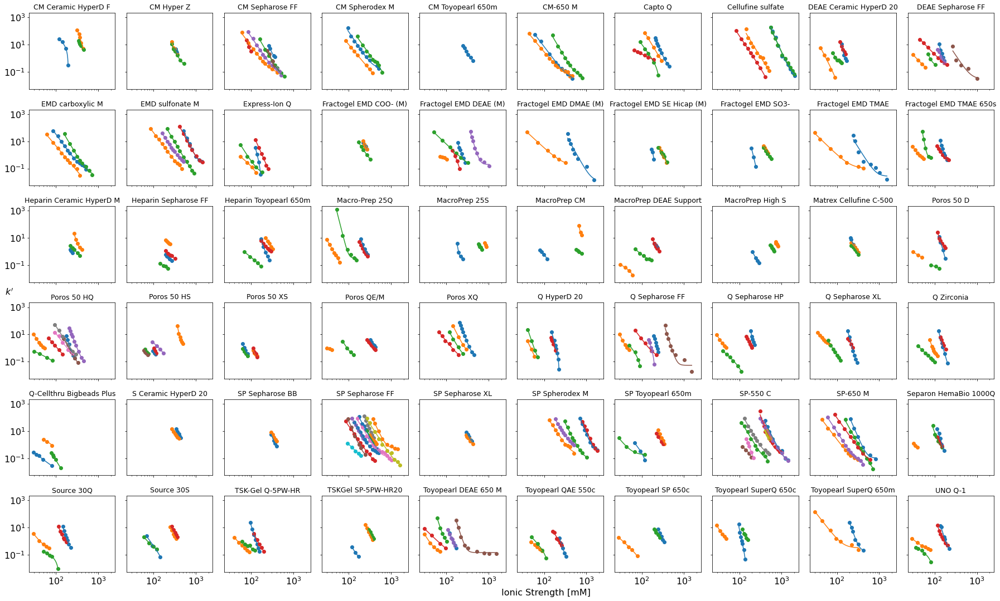

In [173]:
resins = list(set(df_all_k.resin))
resins.sort()

n_row, n_col = 6, 10
fig, ax = plt.subplots(n_row, n_col, sharex=True, sharey=True)
params = {'font.weight':'normal', 'font.size':16}
plt.rcParams.update(params)
fig.set_size_inches(25, 15, forward=True)
fig.patch.set_alpha(1.0)
fig.text(0.01, 0.5, "$k'$", ha='center')
fig.text(0.5, 0.001, 'Ionic Strength [mM]')

for i, resin in enumerate(resins):
    row, column = math.floor(i/n_col), i%n_col
    ax[row, column].set_title(resin, {'fontsize':12.5}) # title.set_text
    df = df_all_k[(df_all_k.resin==resin)]
    
    sub_pairs = set(zip(df.data_set, df.protein, df.pH))
    for (data_set, protein, pH) in sub_pairs:
        df_sub = df[(df.data_set==data_set) & (df.protein==protein) & (df.pH==pH)]
        if len(df_sub) > 2:
            ax[row, column].scatter(df_sub.tis_mM, df_sub.kprime)

            df_params = df_three_params[(df_three_params.protein==protein) &\
                                (df_three_params.pH==pH) &\
                                (df_three_params.resin==resin) &\
                                (df_three_params.data_set==data_set)].copy()
            df_params.reset_index(inplace=True, drop=True)
            a, b, c = df_params.at[0, 'log_a_yam'], df_params.at[0, 'b_yam'], df_params.at[0, 'c_yam']

            tis_vals = np.linspace(min(df_sub.tis_mM), max(df_sub.tis_mM))
            kprime_fit = [np.exp(yam_three_param_model(tis, a, b, c)) for tis in tis_vals]
            ax[row, column].loglog(tis_vals, kprime_fit)

plt.tight_layout()
# fig.savefig('./images/three_parameter_model/yamamoto_fits_each_resin.png', dpi=300)

In [193]:
# df_three_params.to_csv('./lit_data/three_params_all_data.csv', index=False)

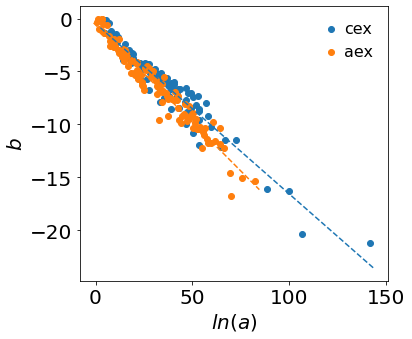

In [192]:
fig, ax = plt.subplots()
params = {'font.weight':'normal', 'font.size':16}
plt.rcParams.update(params)
fig.set_size_inches(6, 5, forward=True)
fig.patch.set_alpha(1.0)
ax.set_xlabel('$ln(a)$')
ax.set_ylabel('$b$')

iex_type_list = ['cex', 'aex']
for iex_type in iex_type_list:
    df = df_three_params[df_three_params.iex_type==iex_type]
    ax.scatter(df.log_a_yam, df.b_yam, label=iex_type)

    fit = optimize.least_squares(get_meta_residuals, x0=[1, 1], args=(np.exp(df.log_a_yam), df.b_yam))
    c, d = fit.x[0], fit.x[1]
    a_vals_new = np.linspace(min(df.log_a_yam)-2.0, max(df.log_a_yam)+2.0)
    b_vals_new = [meta_correlation(np.exp(a), c, d) for a in a_vals_new]
    ax.plot(a_vals_new, b_vals_new, linestyle='--')

ax.legend(loc='best', handlelength=0.1, frameon=False)
plt.tight_layout()
fig.savefig('./images/three_parameter_model/yamamot_a_b_each_iex_type.png', dpi=300)

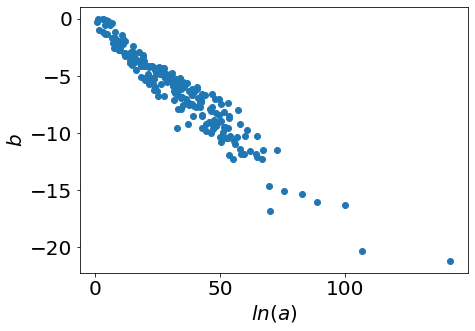

In [191]:
params = {'font.weight':'normal', 'font.size':20}
plt.rcParams.update(params)
fig, ax = plt.subplots()
fig.set_size_inches(7, 5, forward=True)
fig.patch.set_alpha(1.0)
ax.set_xlabel('$ln(a)$')
ax.set_ylabel('$b$')

ax.scatter(df_three_params['log_a_yam'], df_three_params['b_yam'])

plt.tight_layout()
fig.savefig('./images/three_parameter_model/yamamot_a_b.png', dpi=300)

No handles with labels found to put in legend.
/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  


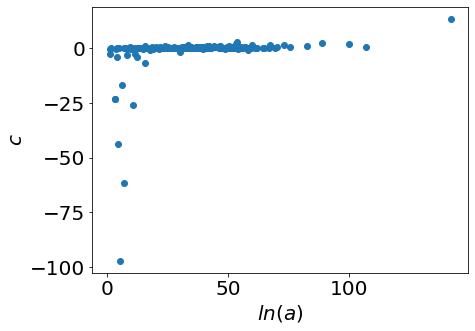

In [178]:
params = {'font.weight':'normal', 'font.size':20}
plt.rcParams.update(params)
fig, ax = plt.subplots()
fig.set_size_inches(7, 5, forward=True)
fig.patch.set_alpha(1.0)
ax.set_xlabel('$ln(a)$')
ax.set_ylabel('$c$')

ax.scatter(df_three_params['log_a_yam'], df_three_params['c_yam'])

ax.legend(loc='lower left', frameon=False, handlelength=0.1)
plt.tight_layout()
fig.savefig('./images/three_parameter_model/yamamot_a_c.png', dpi=300, 
            bbox='tight', transparent=False)

No handles with labels found to put in legend.
/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
  


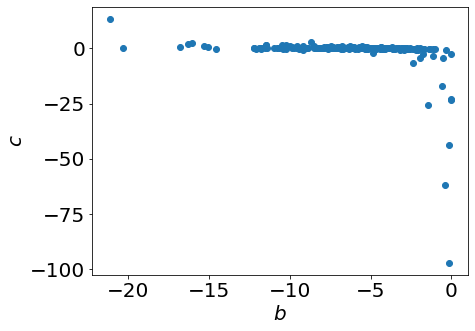

In [176]:
params = {'font.weight':'normal', 'font.size':20}
plt.rcParams.update(params)
fig, ax = plt.subplots()
fig.set_size_inches(7, 5, forward=True)
fig.patch.set_alpha(1.0)
ax.set_xlabel('$b$')
ax.set_ylabel('$c$')

ax.scatter(df_three_params['b_yam'], df_three_params['c_yam'])

ax.legend(loc='lower left', frameon=False, handlelength=0.1)
plt.tight_layout()
fig.savefig('./images/three_parameter_model/yamamot_b_c.png', dpi=300, 
            bbox='tight', transparent=False)

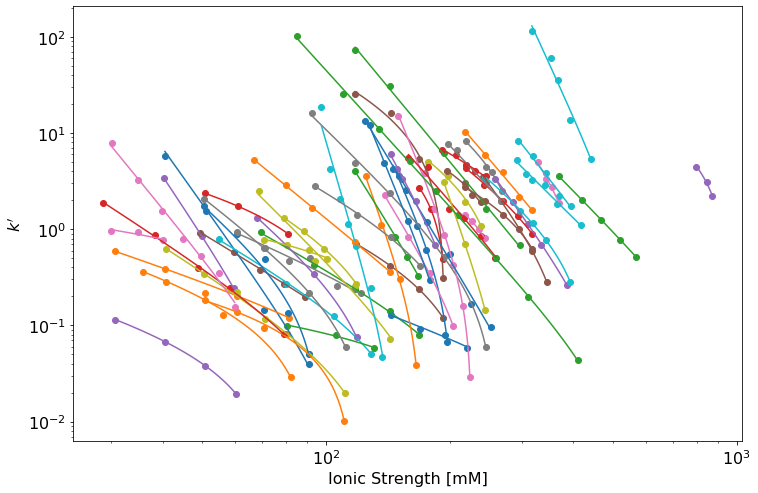

In [211]:
# Are the curves concave down when c is negative?
df_neg = df_three_params[df_three_params.c_yam < 0]

fig, ax = plt.subplots()
params = {'font.weight':'normal', 'font.size':16}
plt.rcParams.update(params)
fig.set_size_inches(12, 8, forward=True)
fig.patch.set_alpha(1.0)
ax.set_ylabel("$k'$")
ax.set_xlabel('Ionic Strength [mM]')

for i, icont in df_neg.iterrows():
    df_k = df_all_k[(df_all_k.protein==icont.protein) &\
                    (df_all_k.pH==icont.pH) &\
                    (df_all_k.resin==icont.resin) &\
                    (df_all_k.data_set==icont.data_set)]
    
    ax.scatter(df_k.tis_mM, df_k.kprime)
    a, b, c = icont.log_a_yam, icont.b_yam, icont.c_yam

    tis_vals = np.linspace(min(df_k.tis_mM), max(df_k.tis_mM))
    kprime_fit = [np.exp(yam_three_param_model(tis, a, b, c)) for tis in tis_vals]
    ax.loglog(tis_vals, kprime_fit)

# Estimation of IS window for elution based on meta-correlation
## Using the 2-parameter model

In [17]:
df_all_k = pd.read_csv('./lit_data/all_kprime.csv')
# Replacing unknown pH values with 0 to facilitate plotting
df_all_k.fillna(0.0, inplace=True)
df_all_k

,data_set,iex_type,resin,protein,pH,tis_mM,kprime
0,mine,aex,Capto Q,alcohol dehydrogenase,7.0,66.80175,4.031122
1,mine,aex,Capto Q,alcohol dehydrogenase,7.0,80.04706,3.031028
2,mine,aex,Capto Q,alcohol dehydrogenase,7.0,92.27350,2.381777
3,mine,aex,Capto Q,alcohol dehydrogenase,7.0,117.74525,1.650520
4,mine,aex,Capto Q,alcohol dehydrogenase,7.0,143.21700,1.122211
...,...,...,...,...,...,...,...
1422,kumar,cex,Poros 50 XS,mAb main variant,6.5,139.66900,0.259259
1423,kumar,cex,Poros 50 XS,mAb main variant,7.0,61.89100,0.925524
1424,kumar,cex,Poros 50 XS,mAb main variant,7.0,67.93400,0.570307
1425,kumar,cex,Poros 50 XS,mAb main variant,7.0,74.17200,0.383470


In [18]:
df_2_fit_parms = pd.read_csv('./lit_data/two_params_all_data.csv')
df_2_fit_parms

,data_set,iex_type,resin,protein,pH,a,b
0,Staby,cex,CM Ceramic HyperD F,lysozyme,5.5,2.014171e+26,-9.666151
1,bai,aex,Fractogel EMD TMAE,pepsinogen,0.0,7.240285e+09,-3.723251
2,Staby,cex,CM Hyper Z,anti-FVII mAb,5.5,7.029232e+20,-8.011037
3,DePhillips,cex,CM Toyopearl 650m,lysozyme,7.0,6.182154e+10,-4.263284
4,Staby,cex,SP Sepharose BB,myoglobin,5.5,1.873456e+07,-3.853668
...,...,...,...,...,...,...,...
241,Staby,aex,Macro-Prep 25Q,anti-FVII mAb,8.0,1.307685e+18,-7.544828
242,Staby,aex,DEAE Ceramic HyperD 20,anti-FVII mAb,8.0,8.418158e+23,-10.867094
243,bai,aex,Fractogel EMD TMAE,alpha-lactalbumin,0.0,5.847650e+04,-2.274022
244,Staby,cex,Fractogel EMD SE Hicap (M),anti-FVII mAb,5.5,2.929320e+28,-12.572734


In [19]:
# df_2_fit_parms[df_2_fit_parms.b >= 0] # b < 0
# df_2_fit_parms[df_2_fit_parms.a <= 0] # a > 0

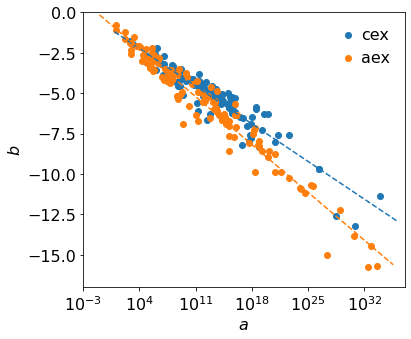

In [20]:
fig, ax = plt.subplots()
params = {'font.weight':'normal', 'font.size':16}
plt.rcParams.update(params)
fig.set_size_inches(6, 5, forward=True)
fig.patch.set_alpha(1.0)
ax.set_xlabel('$a$')
ax.set_ylabel('$b$')
ax.set_xscale('log')

iex_type_list = ['cex', 'aex']
temp = []
for iex_type in iex_type_list:
    df = df_2_fit_parms[df_2_fit_parms.iex_type==iex_type]
    ax.scatter(df.a, df.b, label=iex_type)

    fit = optimize.least_squares(get_meta_residuals, x0=[1, 1], args=(df.a, df.b))
    c, d = fit.x[0], fit.x[1]
    a_vals_new = np.logspace(np.log10(min(df.a))-2.0, np.log10(max(df.a))+2.0)
    b_vals_new = [meta_correlation(a, c, d) for a in a_vals_new]
    ax.plot(a_vals_new, b_vals_new, linestyle='--')
    
    temp.append([iex_type, c, d, np.exp(-1.0/c), np.exp(-d/c)])

df_meta_params = pd.DataFrame(temp, columns=['iex_type', 'c', 'd', 'tis_common', 'k_common'])

ax.set_xlim(1e-3, 1e37)
ax.set_ylim(-17, 0)
ax.legend(loc='best', handlelength=0.1, frameon=False)
plt.tight_layout()
# fig.savefig('./images/elution_window_work/meta_correlation.png', dpi=300, 
#             bbox='tight', transparent=False)

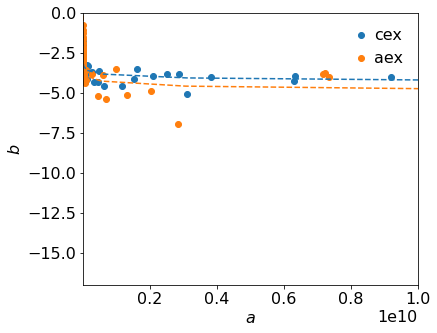

In [21]:
fig, ax = plt.subplots()
params = {'font.weight':'normal', 'font.size':16}
plt.rcParams.update(params)
fig.set_size_inches(6, 5, forward=True)
fig.patch.set_alpha(1.0)
ax.set_xlabel('$a$')
ax.set_ylabel('$b$')
# ax.set_xscale('log')

iex_type_list = ['cex', 'aex']
temp = []
for iex_type in iex_type_list:
    df = df_2_fit_parms[df_2_fit_parms.iex_type==iex_type]
    ax.scatter(df.a, df.b, label=iex_type)

    fit = optimize.least_squares(get_meta_residuals, x0=[1, 1], args=(df.a, df.b))
    c, d = fit.x[0], fit.x[1]
    a_vals_new = np.logspace(np.log10(min(df.a))-2.0, np.log10(max(df.a))+2.0)
    b_vals_new = [meta_correlation(a, c, d) for a in a_vals_new]
    ax.plot(a_vals_new, b_vals_new, linestyle='--')
    
    temp.append([iex_type, c, d, np.exp(-1.0/c), np.exp(-d/c)])

df_meta_params = pd.DataFrame(temp, columns=['iex_type', 'c', 'd', 'tis_common', 'k_common'])

ax.set_xlim(1e4, 1e10)
ax.set_ylim(-17, 0)
ax.legend(loc='best', handlelength=0.1, frameon=False)

In [22]:
df_meta_params

,iex_type,c,d,tis_common,k_common
0,cex,-0.144727,-0.897792,1001.815306,0.002023
1,aex,-0.183807,-0.560094,230.552068,0.047493


In [23]:
def get_a_meta(k_ref, a, b, c, d):
    num = np.log(k_ref)*(1.0-d/b) + d/b*np.log(a)
    den = 1.0 + c/b*np.log(k_ref/a)
    return np.exp(num/den)

def get_delta_tis(x, k_ref, k_comp, a, b):
    c, d = x[0], x[1]
    a_meta = get_a_meta(k_ref, a, b, c, d)
    b_meta = c*np.log(a_meta)+d
    tis_meta = (k_comp/a_meta)**(1.0/b_meta)
    tis_true = (k_comp/a)**(1.0/b)
    return tis_meta - tis_true

In [24]:
for i, icont in df_meta_params.iterrows():
    iex_type = icont.iex_type
    df = df_2_fit_parms[df_2_fit_parms.iex_type==iex_type]
    
    fit = optimize.least_squares(get_delta_tis, x0=[-0.1, -1],
                             args=(0.1, 1e3, df.a, df.b))
    
    c_optimal = fit.x[0]
    d_optimal = fit.x[1]
    df_meta_params.at[i, 'c_optimal'] = c_optimal
    df_meta_params.at[i, 'd_optimal'] = d_optimal
    df_meta_params.at[i, 'tis_common_optimal'] = np.exp(-1.0/c_optimal)
    df_meta_params.at[i, 'k_common_optimal'] = np.exp(-d_optimal/c_optimal)
    
    df_meta_params.at[i, 'optimality'] = fit.optimality
    df_meta_params.at[i, 'cost'] = fit.cost

In [25]:
df_meta_params

,iex_type,c,d,tis_common,k_common,c_optimal,d_optimal,tis_common_optimal,k_common_optimal,optimality,cost
0,cex,-0.144727,-0.897792,1001.815306,0.002023,-0.025241,-4.391302,1.606510e+17,2.778268e-76,0.086391,233719.867258
1,aex,-0.183807,-0.560094,230.552068,0.047493,335.821584,-9255.865256,9.970267e-01,9.331701e+11,0.005307,72122.963076


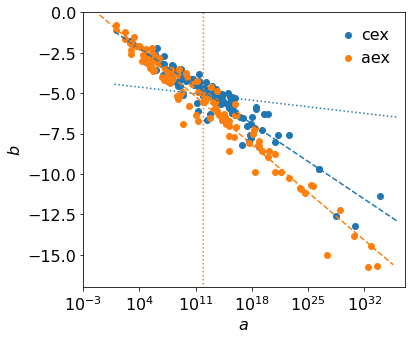

In [26]:
fig, ax = plt.subplots()
params = {'font.weight':'normal', 'font.size':16}
plt.rcParams.update(params)
fig.set_size_inches(6, 5, forward=True)
fig.patch.set_alpha(1.0)
ax.set_xlabel('$a$')
ax.set_ylabel('$b$')
ax.set_xscale('log')

for i, icont in df_meta_params.iterrows():
    iex_type = icont.iex_type
    
    df = df_2_fit_parms[df_2_fit_parms.iex_type==iex_type]
    ax.scatter(df.a, df.b, label=iex_type)

    a_vals_new = np.logspace(np.log10(min(df.a))-2.0, np.log10(max(df.a))+2.0)
    b_vals_new = [meta_correlation(a, icont.c, icont.d) for a in a_vals_new]
    ax.plot(a_vals_new, b_vals_new, linestyle='--')
    
    b_vals_new = [meta_correlation(a, icont.c_optimal, icont.d_optimal) for a in a_vals_new]
    ax.plot(a_vals_new, b_vals_new, linestyle=':', color=plt.gca().lines[-1].get_color())
    
ax.set_xlim(1e-3, 1e37)
ax.set_ylim(-17, 0)
ax.legend(loc='best', handlelength=0.1, frameon=False)
plt.tight_layout()
# fig.savefig('./images/elution_window_work/meta_correlation_needed.png', dpi=300, 
#             bbox='tight', transparent=False)

In [27]:
def get_delta_tis(k1, k2, a, b, c, d):
    a_meta = get_a_meta(k1, a, b, c, d)
    b_meta = c*np.log(a_meta)+d
    tis_meta = (k2/a_meta)**(1.0/b_meta)
    tis_true = (k2/a)**(1.0/b)
    return tis_meta - tis_true, tis_true, a_meta, b_meta, tis_meta

def get_a_meta(k1, a, b, c, d):
    num = np.log(k1)*(1.0-d/b) + d/b*np.log(a)
    den = 1.0 + c/b*np.log(k1/a)
    return np.exp(num/den)

def get_delta_ln_tis(k_ref, k_comp, a, b, c, d):
    ln_a_meta = get_ln_a_meta(k_ref, a, b, c, d)
    b_meta = c*ln_a_meta + d
    
    ln_tis_meta = 1/b_meta*(np.log(k_comp) - ln_a_meta)
    ln_tis_true = 1/b*np.log(k_comp/a)
    return ln_tis_meta - ln_tis_true, ln_a_meta, b_meta

def get_ln_a_meta(k_ref, a, b, c, d):
    num = np.log(k_ref)*(1.0-d/b) + d/b*np.log(a)
    den = 1.0 + c/b*np.log(k_ref/a)
    return num/den

In [28]:
k1 = 0.1
k2 = 1e3

for i, icont in df_2_fit_parms.iterrows():
    iex_type = icont.iex_type
    c = df_meta_params.loc[df_meta_params.iex_type == iex_type, 'c'].iloc[0]
    d = df_meta_params.loc[df_meta_params.iex_type == iex_type, 'd'].iloc[0]
    delta_tis, tis_true, a_meta, b_meta, tis_meta = get_delta_tis(k1, k2, icont.a, icont.b, c, d)
    
    df_2_fit_parms.at[i, 'a_meta']    = a_meta
    df_2_fit_parms.at[i, 'b_meta']    = b_meta
    df_2_fit_parms.at[i, 'tis_true']  = tis_true
    df_2_fit_parms.at[i, 'tis_meta']  = tis_meta
    df_2_fit_parms.at[i, 'delta_tis'] = delta_tis
    
    df_2_fit_parms.at[i, 'tis_ref_true'] = (k1/icont.a)**(1.0/icont.b)
    df_2_fit_parms.at[i, 'tis_ref_meta'] = (k1/a_meta)**(1.0/(c*np.log(a_meta)+d))
    
df_2_fit_parms['tis_ref_diff'] = df_2_fit_parms.tis_ref_meta - df_2_fit_parms.tis_ref_true
df_2_fit_parms.sort_values(by=['tis_ref_diff'], inplace=True)

/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: RuntimeWarning: overflow encountered in double_scalars
  after removing the cwd from sys.path.
/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:17: RuntimeWarning: overflow encountered in double_scalars
/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in log
  This is separate from the ipykernel package so we can avoid doing imports until
/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: RuntimeWarning: divide by zero encountered in double_scalars
  after removing the cwd from sys.path.
/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:17: RuntimeWarning: divide by zero encountered in double_scalars
/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:17: RuntimeWarning: divide by zero encountered in log


In [29]:
df_2_fit_parms

,data_set,iex_type,resin,protein,pH,a,b,a_meta,b_meta,tis_true,tis_meta,delta_tis,tis_ref_true,tis_ref_meta,tis_ref_diff
166,Staby,aex,Q-Cellthru Bigbeads Plus,aprotinin,9.0,9.510400e+03,-2.106287,0.000000e+00,inf,2.913523,1.000000e+00,-1.913523e+00,230.937638,1.000000,-2.299376e+02
136,DePhillips,cex,SP Sepharose FF,FGF-2,7.0,2.425441e+11,-3.808758,1.102492e-23,6.752740,159.019413,6.982539e+03,6.823520e+03,1785.094767,1785.094767,-2.955858e-12
142,Staby,cex,MacroPrep 25S,aprotinin,5.5,1.159610e+13,-4.543121,5.841015e-57,17.841791,164.167041,2.088963e+03,1.924796e+03,1246.631269,1246.631269,-2.728484e-12
97,bai,aex,Fractogel EMD DMAE (M),pepsinogen,0.0,4.803188e+13,-4.895038,2.993821e-03,0.508049,152.094629,7.456396e+10,7.456396e+10,998.315838,998.315838,-2.728484e-12
39,bai,aex,Toyopearl DEAE 650 M,pepsinogen,0.0,4.316800e+05,-2.206629,3.093785e-03,0.502012,15.638770,9.437702e+10,9.437702e+10,1016.067169,1016.067169,-2.273737e-12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
125,DePhillips,cex,Cellufine sulfate,FGF-2,7.0,2.872033e+19,-6.311119,1.572771e-24,7.034570,405.329671,6.459975e+03,6.054645e+03,1744.256730,1744.256730,1.136868e-12
124,Staby,aex,Poros QE/M,lipolase,8.0,7.159574e+09,-3.804600,1.313320e-03,0.659505,63.348526,8.284264e+08,8.284263e+08,713.009524,713.009524,1.136868e-12
67,Staby,cex,Fractogel EMD SO3-,aprotinin,5.5,9.659711e+11,-4.453279,1.368689e+57,-19.938228,104.137330,5.190407e+02,4.149033e+02,823.798537,823.798537,1.250555e-12
204,Staby,cex,MacroPrep High S,aprotinin,5.5,2.171874e+14,-5.069728,7.755015e-212,69.453876,172.259093,1.209961e+03,1.037702e+03,1059.690804,1059.690804,2.273737e-12


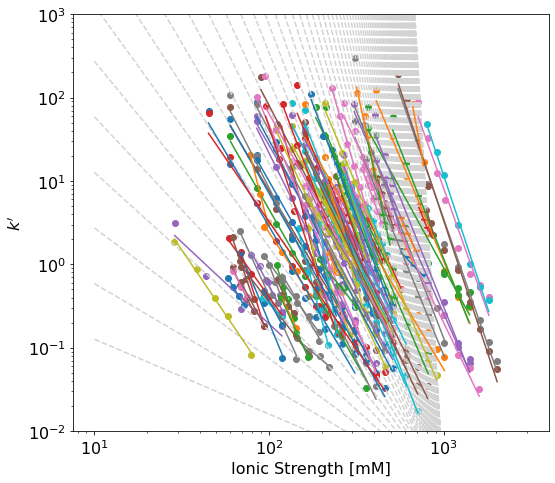

In [30]:
fig, ax = plt.subplots()
params = {'font.weight':'normal', 'font.size':16}
plt.rcParams.update(params)
fig.set_size_inches(8, 7, forward=True)
fig.patch.set_alpha(1.0)
ax.set_ylabel("$k'$")
ax.set_xlabel('Ionic Strength [mM]')

iex_type = 'cex'
c = df_meta_params.loc[df_meta_params.iex_type == iex_type, 'c'].iloc[0]
d = df_meta_params.loc[df_meta_params.iex_type == iex_type, 'd'].iloc[0]
    
a_vals = np.logspace(0, 100, 101)
tis_new = np.linspace(10, 3e3, 1000)
for a in a_vals:
    b = meta_correlation(a, c, d)
    k = [a*tis**b for tis in tis_new]
    ax.loglog(tis_new, k, '--', color='lightgrey')
    
df = df_all_k[df_all_k.iex_type==iex_type]
combos = set(zip(df.data_set, df.resin, df.protein, df.pH))
for combo in combos:
    data_set, resin, protein, pH = combo
    df_sub = df[(df.data_set==data_set) & (df.resin==resin) & (df.protein==protein) & (df.pH==pH)]
    
    a = df_2_fit_parms.loc[(df_2_fit_parms.data_set==data_set) &\
                           (df_2_fit_parms.resin==resin) &\
                           (df_2_fit_parms.protein==protein) &\
                           (df_2_fit_parms.pH==pH), 'a'].iloc[0]
    b = df_2_fit_parms.loc[(df_2_fit_parms.data_set==data_set) &\
                           (df_2_fit_parms.resin==resin) &\
                           (df_2_fit_parms.protein==protein) &\
                           (df_2_fit_parms.pH==pH), 'b'].iloc[0]

    tis_vals = np.linspace(min(df_sub.tis_mM), max(df_sub.tis_mM))
    kprime_fit = [a*tis**b for tis in tis_vals]
    ax.scatter(df_sub.tis_mM, df_sub.kprime)
    ax.loglog(tis_vals, kprime_fit)

ax.set_ylim(1e-2, 1e3)
plt.tight_layout()
# fig.savefig(f'./images/elution_window_work/{iex_type}_all.png', dpi=300, 
#             bbox='tight', transparent=False)

(0.01, 1000.0)

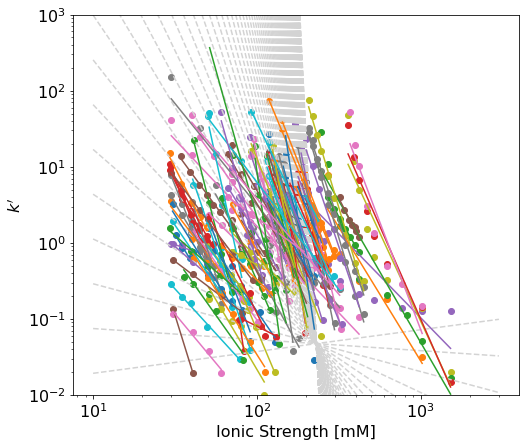

In [26]:
fig, ax = plt.subplots()
params = {'font.weight':'normal', 'font.size':16}
plt.rcParams.update(params)
fig.set_size_inches(8, 7, forward=True)
fig.patch.set_alpha(1.0)
ax.set_ylabel("$k'$")
ax.set_xlabel('Ionic Strength [mM]')

iex_type = 'aex'
c = df_meta_params.loc[df_meta_params.iex_type == iex_type, 'c'].iloc[0]
d = df_meta_params.loc[df_meta_params.iex_type == iex_type, 'd'].iloc[0]
    
a_vals = np.logspace(-2, 100, 101)
tis_new = np.linspace(10, 3e3, 1000)
for a in a_vals:
    b = meta_correlation(a, c, d)
    k = [a*tis**b for tis in tis_new]
    ax.loglog(tis_new, k, '--', color='lightgrey')
    
df = df_all_k[df_all_k.iex_type==iex_type]
combos = set(zip(df.data_set, df.resin, df.protein, df.pH))
for combo in combos:
    data_set, resin, protein, pH = combo
    df_sub = df[(df.data_set==data_set) & (df.resin==resin) & (df.protein==protein) & (df.pH==pH)]
    
    a = df_2_fit_parms.loc[(df_2_fit_parms.data_set==data_set) &\
                           (df_2_fit_parms.resin==resin) &\
                           (df_2_fit_parms.protein==protein) &\
                           (df_2_fit_parms.pH==pH), 'a'].iloc[0]
    b = df_2_fit_parms.loc[(df_2_fit_parms.data_set==data_set) &\
                           (df_2_fit_parms.resin==resin) &\
                           (df_2_fit_parms.protein==protein) &\
                           (df_2_fit_parms.pH==pH), 'b'].iloc[0]

    tis_vals = np.linspace(min(df_sub.tis_mM), max(df_sub.tis_mM))
    kprime_fit = [a*tis**b for tis in tis_vals]
    ax.scatter(df_sub.tis_mM, df_sub.kprime)
    ax.loglog(tis_vals, kprime_fit)


ax.set_ylim(1e-2, 1e3)
# fig.savefig(f'./images/elution_window_work/{iex_type}_all.png', dpi=300, 
#             bbox='tight', transparent=False)

In [27]:
df_meta_params

,iex_type,c,d,tis_common,k_common,c_optimal,d_optimal,tis_common_optimal,k_common_optimal,optimality,cost
0,cex,-0.144727,-0.897792,1001.815310,0.002023,-0.025241,-4.391302,1.606495e+17,2.778400e-76,0.101036,233719.865565
1,aex,-0.183807,-0.560094,230.552067,0.047493,513.152905,-14140.907171,9.980532e-01,9.285662e+11,0.000924,72121.989253


In [28]:
df_all_k['below_tis_common'] = 0
df_all_k

,data_set,iex_type,resin,protein,pH,tis_mM,kprime,below_tis_common
0,mine,aex,Capto Q,alcohol dehydrogenase,7.0,66.80175,4.031122,0
1,mine,aex,Capto Q,alcohol dehydrogenase,7.0,80.04706,3.031028,0
2,mine,aex,Capto Q,alcohol dehydrogenase,7.0,92.27350,2.381777,0
3,mine,aex,Capto Q,alcohol dehydrogenase,7.0,117.74525,1.650520,0
4,mine,aex,Capto Q,alcohol dehydrogenase,7.0,143.21700,1.122211,0
...,...,...,...,...,...,...,...,...
1422,kumar,cex,Poros 50 XS,mAb main variant,6.5,139.66900,0.259259,0
1423,kumar,cex,Poros 50 XS,mAb main variant,7.0,61.89100,0.925524,0
1424,kumar,cex,Poros 50 XS,mAb main variant,7.0,67.93400,0.570307,0
1425,kumar,cex,Poros 50 XS,mAb main variant,7.0,74.17200,0.383470,0


/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:54: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later
/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:54: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later


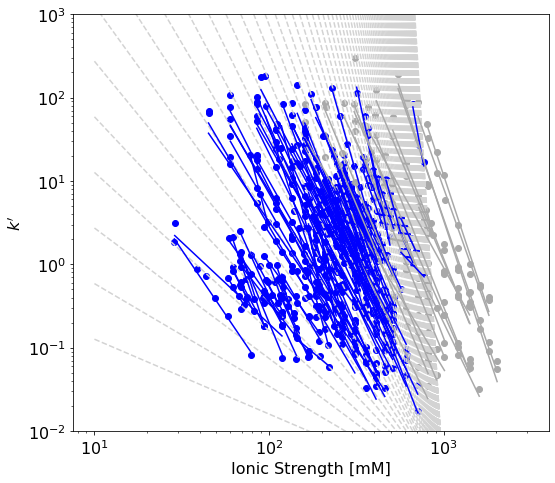

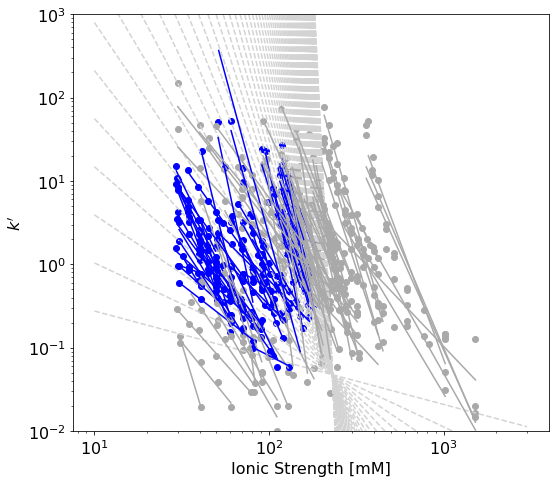

In [29]:
iex_types = ['cex', 'aex']
for iex_type in iex_types:
    fig, ax = plt.subplots()
    params = {'font.weight':'normal', 'font.size':16}
    plt.rcParams.update(params)
    fig.set_size_inches(8, 7, forward=True)
    fig.patch.set_alpha(1.0)
    ax.set_ylabel("$k'$")
    ax.set_xlabel('Ionic Strength [mM]')

    c = df_meta_params.loc[df_meta_params.iex_type == iex_type, 'c'].iloc[0]
    d = df_meta_params.loc[df_meta_params.iex_type == iex_type, 'd'].iloc[0]
    tis_com = df_meta_params.loc[df_meta_params.iex_type == iex_type, 'tis_common'].iloc[0]
    k_com = df_meta_params.loc[df_meta_params.iex_type == iex_type, 'k_common'].iloc[0]

    a_vals = np.logspace(0, 100, 101)
    tis_new = np.linspace(10, 3e3, 1000)
    for a in a_vals:
        b = meta_correlation(a, c, d)
        k = [a*tis**b for tis in tis_new]
        ax.loglog(tis_new, k, '--', color='lightgrey')

    df = df_all_k[df_all_k.iex_type==iex_type]
    combos = set(zip(df.data_set, df.resin, df.protein, df.pH))
    for combo in combos:
        data_set, resin, protein, pH = combo
        df_sub = df[(df.data_set==data_set) & (df.resin==resin) & (df.protein==protein) & (df.pH==pH)]

        a = df_2_fit_parms.loc[(df_2_fit_parms.data_set==data_set) &\
                               (df_2_fit_parms.resin==resin) &\
                               (df_2_fit_parms.protein==protein) &\
                               (df_2_fit_parms.pH==pH), 'a'].iloc[0]
        b = df_2_fit_parms.loc[(df_2_fit_parms.data_set==data_set) &\
                               (df_2_fit_parms.resin==resin) &\
                               (df_2_fit_parms.protein==protein) &\
                               (df_2_fit_parms.pH==pH), 'b'].iloc[0]

        tis_vals = np.linspace(min(df_sub.tis_mM), max(df_sub.tis_mM))
        kprime_fit = [a*tis**b for tis in tis_vals]

        if max(df_sub.tis_mM) < 0.8*tis_com and min(df_sub.kprime) > 1.2*k_com:
            color='blue'
            df_all_k.loc[(df_all_k.iex_type==iex_type) & (df_all_k.data_set==data_set) & (df_all_k.resin==resin) & (df_all_k.protein==protein) & (df_all_k.pH==pH), 'below_tis_com'] = 1
        else:
            color='darkgrey'
            df_all_k.loc[(df_all_k.iex_type==iex_type) & (df_all_k.data_set==data_set) & (df_all_k.resin==resin) & (df_all_k.protein==protein) & (df_all_k.pH==pH), 'below_tis_com'] = 0

        ax.scatter(df_sub.tis_mM, df_sub.kprime, color=color)
        ax.loglog(tis_vals, kprime_fit, color=color)

    ax.set_ylim(1e-2, 1e3)
    plt.tight_layout()
    fig.savefig(f'./images/elution_window_work/{iex_type}_viable_pts.png', dpi=300, 
                bbox='tight', transparent=False)

No handles with labels found to put in legend.
/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:43: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later


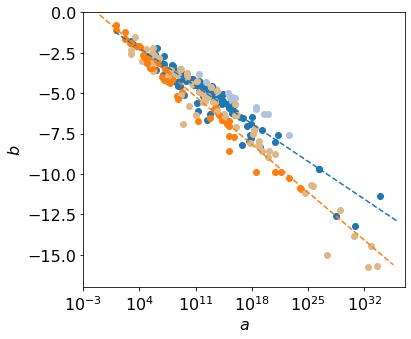

In [30]:
fig, ax = plt.subplots()
params = {'font.weight':'normal', 'font.size':16}
plt.rcParams.update(params)
fig.set_size_inches(6, 5, forward=True)
fig.patch.set_alpha(1.0)
ax.set_xlabel('$a$')
ax.set_ylabel('$b$')
ax.set_xscale('log')

iex_type_list = ['cex', 'aex']
temp = []
for iex_type in iex_type_list:
    df_temp = df_all_k[df_all_k.iex_type==iex_type]
    combos = set(zip(df_temp.data_set, df_temp.resin, df_temp.protein, df_temp.pH, df_temp.below_tis_com))
    
    df = df_2_fit_parms[df_2_fit_parms.iex_type==iex_type]
    for data_set, resin, protein, pH, below_tis_com in combos:
        df_pnt = df[(df.data_set==data_set) & (df.resin==resin) & (df.protein==protein) & (df.pH==pH)]
        if df_all_k.loc[(df_all_k.iex_type==iex_type) & (df_all_k.data_set==data_set) & (df_all_k.resin==resin) & (df_all_k.protein==protein) & (df_all_k.pH==pH), 'below_tis_com'].all() == 1:
            if iex_type == 'cex':
                color = '#1f77b4'
            elif iex_type == 'aex':
                color = '#ff7f0e'
        else:
            if iex_type == 'cex':
                color = 'lightsteelblue'
            elif iex_type == 'aex':
                color = 'burlywood' # 'bisque'
    
        ax.scatter(df_pnt.a, df_pnt.b, color=color)

    fit = optimize.least_squares(get_meta_residuals, x0=[1, 1], args=(df.a, df.b))
    c, d = fit.x[0], fit.x[1]
    a_vals_new = np.logspace(np.log10(min(df.a))-2.0, np.log10(max(df.a))+2.0)
    b_vals_new = [meta_correlation(a, c, d) for a in a_vals_new]
    ax.plot(a_vals_new, b_vals_new, linestyle='--')

ax.set_xlim(1e-3, 1e37)
ax.set_ylim(-17, 0)
ax.legend(loc='best', handlelength=0.1, frameon=False)
plt.tight_layout()
fig.savefig('./images/elution_window_work/meta_correlation_viable_pts.png', dpi=300, 
            bbox='tight', transparent=False)

/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:39: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later


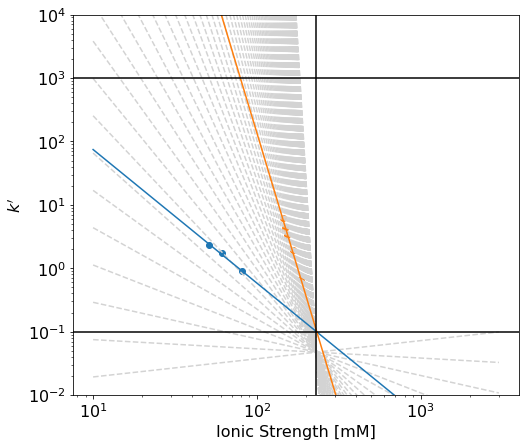

In [31]:
fig, ax = plt.subplots()
params = {'font.weight':'normal', 'font.size':16}
plt.rcParams.update(params)
fig.set_size_inches(8, 7, forward=True)
fig.patch.set_alpha(1.0)
ax.set_ylabel("$k'$")
ax.set_xlabel('Ionic Strength [mM]')

iex_type = 'aex'
c = df_meta_params.loc[df_meta_params.iex_type == iex_type, 'c'].iloc[0]
d = df_meta_params.loc[df_meta_params.iex_type == iex_type, 'd'].iloc[0]
    
a_vals = np.logspace(-2, 100, 101)
tis_new = np.linspace(10, 3e3, 1000)
for a in a_vals:
    b = meta_correlation(a, c, d)
    k = [a*tis**b for tis in tis_new]
    ax.loglog(tis_new, k, '--', color='lightgrey')   
    
df = df_2_fit_parms[(abs(df_2_fit_parms.tis_ref_diff) > 1e-8) & (df_2_fit_parms.iex_type==iex_type)]
combos = set(zip(df.data_set, df.resin, df.protein, df.pH))
for i, icont in df.iterrows():
    df_sub = df_all_k[(df_all_k.data_set==icont.data_set) & (df_all_k.resin==icont.resin) & (df_all_k.protein==icont.protein) & (df_all_k.pH==icont.pH)]
    a, b = icont.a, icont.b

#     tis_vals = np.linspace(min(df_sub.tis_mM), max(df_sub.tis_mM))
    tis_vals = np.linspace(10, 1e3)
    kprime_fit = [a*tis**b for tis in tis_vals]
    ax.scatter(df_sub.tis_mM, df_sub.kprime)
    ax.loglog(tis_vals, kprime_fit)

tis_common = df_meta_params.loc[df_meta_params.iex_type == iex_type, 'tis_common'].iloc[0]
ax.axvline(tis_common, color='black')
ax.axhline(0.1, color='black')
ax.axhline(1e3, color='black')

ax.set_ylim(1e-2, 1e4)
fig.savefig(f'./images/elution_window_work/{iex_type}_problem.png', dpi=300, 
            bbox='tight', transparent=False)

/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:40: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later


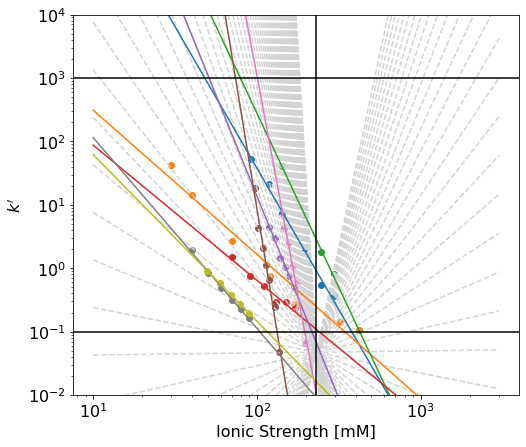

In [32]:
fig, ax = plt.subplots()
params = {'font.weight':'normal', 'font.size':16}
plt.rcParams.update(params)
fig.set_size_inches(8, 7, forward=True)
fig.patch.set_alpha(1.0)
ax.set_ylabel("$k'$")
ax.set_xlabel('Ionic Strength [mM]')

iex_type = 'aex'
c = df_meta_params.loc[df_meta_params.iex_type == iex_type, 'c'].iloc[0]
d = df_meta_params.loc[df_meta_params.iex_type == iex_type, 'd'].iloc[0]
    
a_vals = np.logspace(-30, 100, 101)
tis_new = np.linspace(10, 3e3, 1000)
for a in a_vals:
    b = meta_correlation(a, c, d)
    k = [a*tis**b for tis in tis_new]
    ax.loglog(tis_new, k, '--', color='lightgrey')   
    
df = df_2_fit_parms[df_2_fit_parms.iex_type==iex_type].copy()
df.reset_index(inplace=True)
combos = set(zip(df.data_set, df.resin, df.protein, df.pH))
for i, icont in df.iterrows():
    if 25 < i < 35:
        df_sub = df_all_k[(df_all_k.data_set==icont.data_set) & (df_all_k.resin==icont.resin) & (df_all_k.protein==icont.protein) & (df_all_k.pH==icont.pH)]
        a, b = icont.a, icont.b

        tis_vals = np.linspace(10, 1e3)
        kprime_fit = [a*tis**b for tis in tis_vals]
        ax.scatter(df_sub.tis_mM, df_sub.kprime)
        ax.loglog(tis_vals, kprime_fit)

tis_common = df_meta_params.loc[df_meta_params.iex_type == iex_type, 'tis_common'].iloc[0]
ax.axvline(tis_common, color='black')
ax.axhline(0.1, color='black')
ax.axhline(1e3, color='black')

ax.set_ylim(1e-2, 1e4)
fig.savefig(f'./images/elution_window_work/{iex_type}_window_example.png', dpi=300, 
            bbox='tight', transparent=False)

In [113]:
def get_tis_max(log10_gh, a, c, d):
    b = meta_correlation(a, c, d)
    b_yam = -1.0*np.log10(a*(1.0 - b))
    m = -1.0*b + 1.0
    return 10.0**((log10_gh - b_yam)/m)

In [114]:
iex_type = 'aex'
c = df_meta_params.loc[df_meta_params.iex_type == iex_type, 'c'].iloc[0]
d = df_meta_params.loc[df_meta_params.iex_type == iex_type, 'd'].iloc[0]
tis_common = df_meta_params.loc[df_meta_params.iex_type == iex_type, 'tis_common'].iloc[0]

eps_t = 0.6865
gh = (1068 - 49)/2*(1.0 - eps_t)
log10_gh = np.log10(gh)

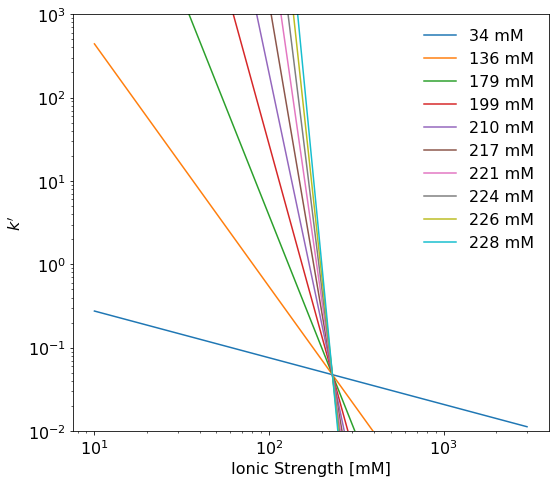

In [115]:
fig, ax = plt.subplots()
params = {'font.weight':'normal', 'font.size':16}
plt.rcParams.update(params)
fig.set_size_inches(8, 7, forward=True)
fig.patch.set_alpha(1.0)
ax.set_ylabel("$k'$")
ax.set_xlabel('Ionic Strength [mM]')

a_vals = np.logspace(0, 50, 10)

tis_new = np.linspace(10, 3e3, 1000)
for a in a_vals:
    b = meta_correlation(a, c, d)
    k = [a*tis**b for tis in tis_new]
    tis_max = get_tis_max(log10_gh, a, c, d)
    
    ax.loglog(tis_new, k, label=f'{tis_max:.0f} mM')
    
ax.set_ylim(1e-2, 1e3)
ax.legend(loc='upper right', frameon=False)

plt.tight_layout()
fig.savefig(f'./images/elution_window_work/aex_LGE_tis_max_as_kprime_vs_tis.png', dpi=300)

In [84]:
def get_a_tis_res(lna, log10_gh, tis_max, c, d):
    term_1 = (1.0 - c*lna - d)*np.log10(tis_max)
    term_2 = -1.0*lna/np.log(10.0) - np.log10(1.0 - c*lna - d)
    rhs    = term_1 + term_2
    return np.abs(log10_gh - rhs)

In [119]:
tis_max_vals = np.linspace(1, 500, 500)

res = []
for tis_max in tis_max_vals:
#     fit = optimize.root_scalar(get_a_tis_res, args=(log10_gh, tis_max, c, d), x0=1, x1=5000)
#     res.append([tis_max, fit.root, fit.converged])
    fit = optimize.minimize(get_a_tis_res, x0=1, args=(log10_gh, tis_max, c, d), options={'maxiter':200})
    res.append([tis_max, fit.x[0], fit.fun])
    
df_res = pd.DataFrame(res, columns=['tis_max', 'ln_a', 'fun'])

/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in log10
  This is separate from the ipykernel package so we can avoid doing imports until
/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in log10
  This is separate from the ipykernel package so we can avoid doing imports until
/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in log10
  This is separate from the ipykernel package so we can avoid doing imports until
/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in log10
  This is separate from the ipykernel package so we can avoid doing imports until
/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in log10
  This is separate from the ipykernel pack

In [120]:
df_conv = df_res[df_res.fun < 0.01].copy()
df_conv.reset_index(inplace=True, drop=True)
df_conv['a'] = np.exp(df_conv['ln_a'])
df_conv

,tis_max,ln_a,fun,a
0,2.0,-4.280391,3.59258e-09,1.383725e-02
1,5.0,-3.512257,2.6968e-09,2.982950e-02
2,6.0,-3.320136,2.5704e-09,3.614791e-02
3,8.0,-2.980786,1.23299e-09,5.075294e-02
4,9.0,-2.827000,1.1975e-09,5.919017e-02
...,...,...,...,...
218,229.0,130.630374,1.95066e-11,5.395736e+56
219,230.0,145.979177,2.92255e-12,2.500064e+63
220,231.0,167.578891,1.23443e-11,6.006031e+72
221,232.0,202.233376,5.57998e-12,6.742782e+87


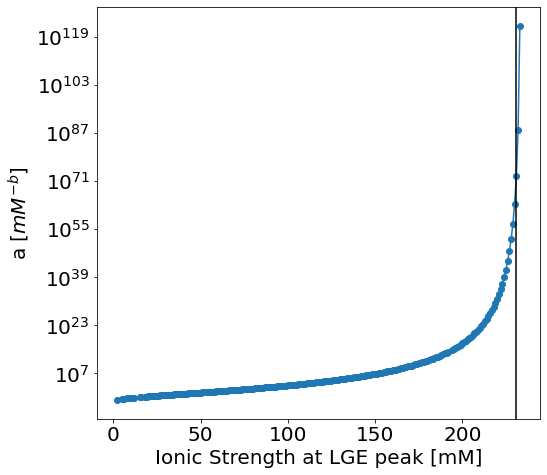

In [125]:
fig, ax = plt.subplots()
params = {'font.weight':'normal', 'font.size':20}
plt.rcParams.update(params)
fig.set_size_inches(8, 7, forward=True)
fig.patch.set_alpha(1.0)
ax.set_ylabel(r"a $[mM^{-b}]$")
ax.set_xlabel('Ionic Strength at LGE peak [mM]')
ax.set_yscale('log')

ax.plot(df_conv.tis_max, df_conv.a, '-o')
ax.axvline(tis_common, color='black')

plt.tight_layout()
fig.savefig(f'./images/elution_window_work/aex_LGE_a_vs_tis_max.png', dpi=300)

In [170]:
from numpy.polynomial import Polynomial

In [211]:
df_temp = df_conv[df_conv.tis_max < 150]
fit = Polynomial.fit(df_temp.tis_max, df_temp.ln_a, 1)

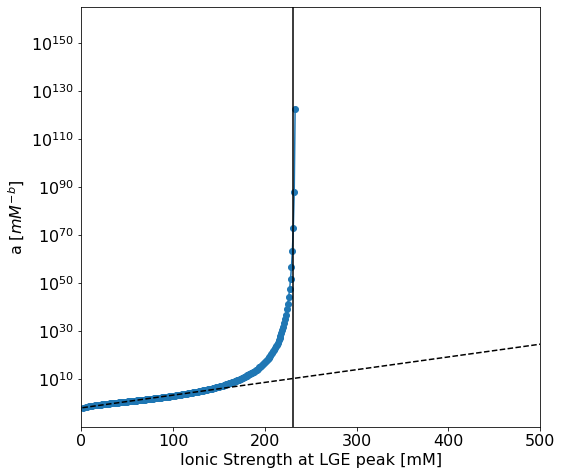

In [212]:
fig, ax = plt.subplots()
params = {'font.weight':'normal', 'font.size':20}
plt.rcParams.update(params)
fig.set_size_inches(8, 7, forward=True)
fig.patch.set_alpha(1.0)
ax.set_ylabel(r"a $[mM^{-b}]$")
ax.set_xlabel('Ionic Strength at LGE peak [mM]')
ax.set_yscale('log')

ax.plot(df_conv.tis_max, df_conv.a, '-o')
ax.axvline(tis_common, color='black')

ln_a_vals = [fit(tis) for tis in tis_max_vals]
a_vals = [np.exp(ln_a) for ln_a in ln_a_vals]
ax.plot(tis_max_vals, a_vals, 'k--')

plt.tight_layout()
ax.set_xlim(0, 500)
fig.savefig(f'./images/elution_window_work/aex_LGE_a_vs_tis_max_extrapolation.png', dpi=300)

In [185]:
def get_enf_res(b, a, log10_gh, tis_max):
    return np.abs(log10_gh - (1.0 - b)*np.log10(tis_max) + np.log10(a) + np.log10(1.0 - b))

In [186]:
res = []
tis_max_vals = np.linspace(1, 3000, 3000)
ln_a_vals = [fit(tis) for tis in tis_max_vals]
a_vals = [np.exp(ln_a) for ln_a in ln_a_vals]

for tis_max, a in zip(tis_max_vals, a_vals):
    fit_val = optimize.minimize(get_enf_res, x0=0.0, args=(a, log10_gh, tis_max), options={'maxiter':200})
    res.append([a, tis_max, fit_val.x[0], fit_val.fun])
    
df_res_enf = pd.DataFrame(res, columns=['a', 'tis_max', 'b', 'fun'])

/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in log10
  
/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in log10
  
/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in log10
  
/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in log10
  
/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in log10
  
/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in log10
  


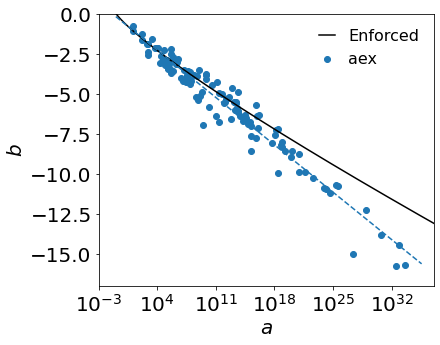

In [213]:
fig, ax = plt.subplots()
params = {'font.weight':'normal', 'font.size':16}
plt.rcParams.update(params)
fig.set_size_inches(6, 5, forward=True)
fig.patch.set_alpha(1.0)
ax.set_xlabel('$a$')
ax.set_ylabel('$b$')
ax.set_xscale('log')

df_temp = df_res_enf[df_res_enf.fun < 0.01]
ax.plot(df_temp.a, df_temp.b, color='black', label='Enforced')

iex_type_list = ['aex'] # may add 'cex' here
for iex_type in iex_type_list:
    df = df_2_fit_parms[df_2_fit_parms.iex_type==iex_type]
    ax.scatter(df.a, df.b, label=iex_type)

    fit = optimize.least_squares(get_meta_residuals, x0=[1, 1], args=(df.a, df.b))
    c, d = fit.x[0], fit.x[1]
    a_vals_new = np.logspace(np.log10(min(df.a))-2.0, np.log10(max(df.a))+2.0)
    b_vals_new = [meta_correlation(a, c, d) for a in a_vals_new]
    ax.plot(a_vals_new, b_vals_new, linestyle='--')
    
ax.set_xlim(1e-3, 1e37)
ax.set_ylim(-17, 0)
ax.legend(loc='best', handlelength=1.0, frameon=False)
fig.savefig(f'./images/elution_window_work/aex_LGE_a_vs_tis_max_extrapolation_meta_correlation.png', dpi=300)

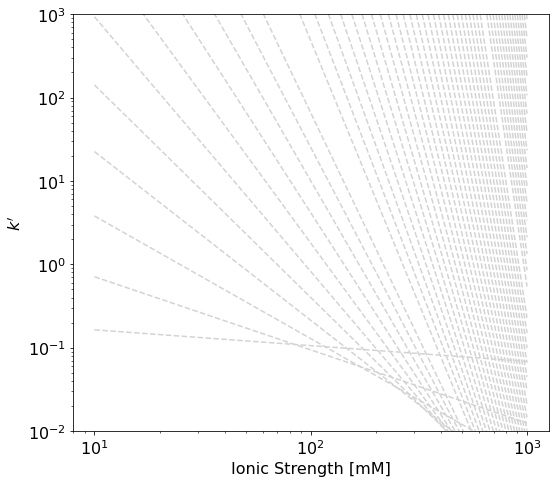

In [203]:
fig, ax = plt.subplots()
params = {'font.weight':'normal', 'font.size':16}
plt.rcParams.update(params)
fig.set_size_inches(8, 7, forward=True)
fig.patch.set_alpha(1.0)
ax.set_ylabel("$k'$")
ax.set_xlabel('Ionic Strength [mM]')

tis_new = np.linspace(10, 1e3, 1000)
for i, icont in df_temp.iterrows():
    if i%25 == 0:
        b = icont.b
        a = icont.a
        k = [a*tis**b for tis in tis_new]
        ax.loglog(tis_new, k, '--', color='lightgrey')
    
ax.set_ylim(1e-2, 1e3)
plt.tight_layout()

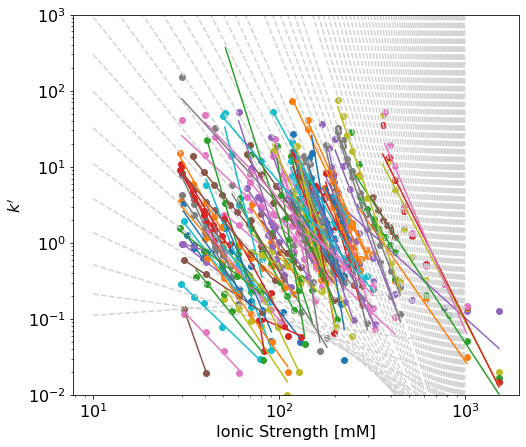

In [214]:
fig, ax = plt.subplots()
params = {'font.weight':'normal', 'font.size':16}
plt.rcParams.update(params)
fig.set_size_inches(8, 7, forward=True)
fig.patch.set_alpha(1.0)
ax.set_ylabel("$k'$")
ax.set_xlabel('Ionic Strength [mM]')
  
tis_new = np.linspace(10, 1e3, 1000)
for i, icont in df_temp.iterrows():
    if i%15 == 0:
        b = icont.b
        a = icont.a
        k = [a*tis**b for tis in tis_new]
        ax.loglog(tis_new, k, '--', color='lightgrey')

iex_type = 'aex'
df = df_all_k[df_all_k.iex_type==iex_type]
combos = set(zip(df.data_set, df.resin, df.protein, df.pH))
for combo in combos:
    data_set, resin, protein, pH = combo
    df_sub = df[(df.data_set==data_set) & (df.resin==resin) & (df.protein==protein) & (df.pH==pH)]
    
    a = df_2_fit_parms.loc[(df_2_fit_parms.data_set==data_set) &\
                           (df_2_fit_parms.resin==resin) &\
                           (df_2_fit_parms.protein==protein) &\
                           (df_2_fit_parms.pH==pH), 'a'].iloc[0]
    b = df_2_fit_parms.loc[(df_2_fit_parms.data_set==data_set) &\
                           (df_2_fit_parms.resin==resin) &\
                           (df_2_fit_parms.protein==protein) &\
                           (df_2_fit_parms.pH==pH), 'b'].iloc[0]

    tis_vals = np.linspace(min(df_sub.tis_mM), max(df_sub.tis_mM))
    kprime_fit = [a*tis**b for tis in tis_vals]
    ax.scatter(df_sub.tis_mM, df_sub.kprime)
    ax.loglog(tis_vals, kprime_fit)

ax.set_ylim(1e-2, 1e3)
fig.savefig(f'./images/elution_window_work/aex_LGE_a_vs_tis_max_extrapolation_all_data.png', dpi=300)

In [232]:
# Re-loaded fit params DF before the following
df_2_fit_parms = pd.read_csv('./lit_data/two_params_all_data.csv')

resins = pd.read_csv('./lit_data/resin_list.csv')
for i, icont in df_2_fit_parms.iterrows():
    df_2_fit_parms.at[i, 'polymer'] = resins.loc[resins.resin == icont.resin, 'polymer'].iloc[0]

In [233]:
df_2_fit_parms

,data_set,iex_type,resin,protein,pH,a,b,polymer
0,Staby,cex,Source 30S,lysozyme,5.5,3.208402e+15,-6.054162,0.0
1,Staby,cex,TSKGel SP-5PW-HR20,aprotinin,5.5,9.563196e+13,-5.319492,0.0
2,kumar,cex,Poros 50 HS,mAb basic variant,7.0,1.261967e+07,-4.002973,0.0
3,Staby,aex,Toyopearl SuperQ 650c,myoglobin,9.0,2.529806e+07,-4.276948,0.0
4,Staby,cex,MacroPrep CM,anti-FVII mAb,5.5,3.791554e+07,-3.917263,0.0
...,...,...,...,...,...,...,...,...
241,bai,aex,Toyopearl DEAE 650 M,alpha-lactalbumin,0.0,1.393205e+05,-2.856289,0.0
242,Staby,aex,TSK-Gel Q-5PW-HR,myoglobin,9.0,1.179829e+05,-3.010277,0.0
243,Staby,aex,DEAE Ceramic HyperD 20,anti-FVII mAb,8.0,8.418158e+23,-10.867094,1.0
244,DePhillips,cex,SP-650 M,cytochrome c,7.0,1.516124e+09,-4.132281,0.0


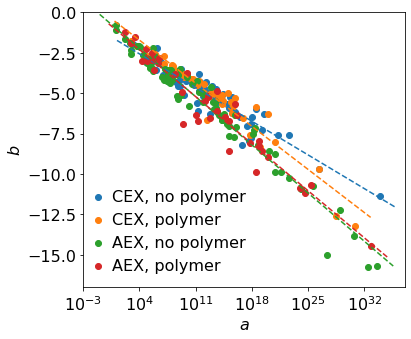

In [243]:
fig, ax = plt.subplots()
params = {'font.weight':'normal', 'font.size':16}
plt.rcParams.update(params)
fig.set_size_inches(6, 5, forward=True)
fig.patch.set_alpha(1.0)
ax.set_xlabel('$a$')
ax.set_ylabel('$b$')
ax.set_xscale('log')

iex_type_list = ['cex', 'aex']
polymer = [0.0, 1.0] 
labels = ['no polymer', 'polymer']

for iex_type in iex_type_list:
    for p_option, label in zip(polymer, labels):
        df = df_2_fit_parms[(df_2_fit_parms.iex_type==iex_type) & (df_2_fit_parms.polymer==p_option)]
        ax.scatter(df.a, df.b, label=f'{iex_type.upper()}, {label}')

        fit = optimize.least_squares(get_meta_residuals, x0=[1, 1], args=(df.a, df.b))
        c, d = fit.x[0], fit.x[1]
        a_vals_new = np.logspace(np.log10(min(df.a))-2.0, np.log10(max(df.a))+2.0)
        b_vals_new = [meta_correlation(a, c, d) for a in a_vals_new]
        ax.plot(a_vals_new, b_vals_new, linestyle='--')

ax.set_xlim(1e-3, 1e37)
ax.set_ylim(-17, 0)
ax.legend(loc='best', handlelength=0.1, frameon=False)
plt.tight_layout()
fig.savefig('./images/elution_window_work/meta_correlation_polymer_derivatization.png', dpi=300)

/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:40: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later


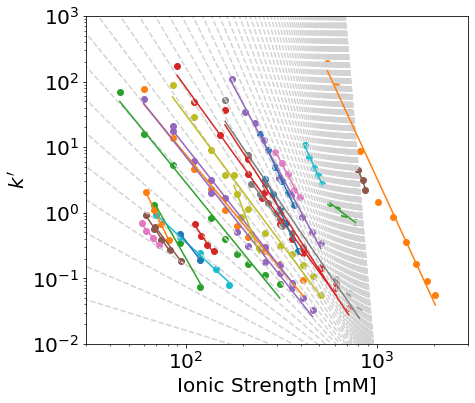

In [37]:
fig, ax = plt.subplots()
params = {'font.weight':'normal', 'font.size':20}
plt.rcParams.update(params)
fig.set_size_inches(7, 6, forward=True)
fig.patch.set_alpha(1.0)
ax.set_ylabel("$k'$")
ax.set_xlabel('Ionic Strength [mM]')

iex_type = 'cex'
c = df_meta_params.loc[df_meta_params.iex_type == iex_type, 'c'].iloc[0]
d = df_meta_params.loc[df_meta_params.iex_type == iex_type, 'd'].iloc[0]
    
a_vals = np.logspace(0, 100, 101)
tis_new = np.linspace(10, 3e3, 1000)
for a in a_vals:
    b = meta_correlation(a, c, d)
    k = [a*tis**b for tis in tis_new]
    ax.loglog(tis_new, k, '--', color='lightgrey')
    
df = df_all_k[df_all_k.iex_type==iex_type]
combos = set(zip(df.data_set, df.resin, df.protein, df.pH))
for i, combo in enumerate(combos):
    if i%5 == 0:
        data_set, resin, protein, pH = combo
        df_sub = df[(df.data_set==data_set) & (df.resin==resin) & (df.protein==protein) & (df.pH==pH)]

        a = df_2_fit_parms.loc[(df_2_fit_parms.data_set==data_set) &\
                               (df_2_fit_parms.resin==resin) &\
                               (df_2_fit_parms.protein==protein) &\
                               (df_2_fit_parms.pH==pH), 'a'].iloc[0]
        b = df_2_fit_parms.loc[(df_2_fit_parms.data_set==data_set) &\
                               (df_2_fit_parms.resin==resin) &\
                               (df_2_fit_parms.protein==protein) &\
                               (df_2_fit_parms.pH==pH), 'b'].iloc[0]

        tis_vals = np.linspace(min(df_sub.tis_mM), max(df_sub.tis_mM))
        kprime_fit = [a*tis**b for tis in tis_vals]
        ax.scatter(df_sub.tis_mM, df_sub.kprime)
        ax.loglog(tis_vals, kprime_fit)

ax.set_ylim(1e-2, 1e3)
ax.set_xlim(30, 3e3)

plt.tight_layout()
fig.savefig(f'./images/elution_window_work/{iex_type}_subset.png', dpi=300, 
            bbox='tight', transparent=False)

## Using the 3-parameter model

In [345]:
df_three_params = pd.read_csv('./lit_data/three_params_all_data.csv')
df_three_params['a_yam'] = np.exp(df_three_params.log_a_yam)
df_three_params

,data_set,resin,protein,iex_type,pH,log_a_yam,b_yam,c_yam,a_yam
0,DePhillips,Cellufine sulfate,FGF-1,cex,7.0,46.690631,-6.606368,0.054635,1.894451e+20
1,Staby,TSKGel SP-5PW-HR20,anti-FVII mAb,cex,5.5,26.413092,-5.750954,0.030959,2.958423e+11
2,Staby,Fractogel EMD TMAE 650s,lipolase,aex,8.0,31.520377,-6.334355,0.367992,4.887942e+13
3,bai,Toyopearl SuperQ 650m,pepsinogen,aex,0.0,50.569985,-8.953363,0.194161,9.167803e+21
4,Staby,SP Sepharose BB,lysozyme,cex,5.5,49.567671,-8.414419,0.314481,3.364853e+21
...,...,...,...,...,...,...,...,...,...
234,DePhillips,EMD carboxylic M,cytochrome c,cex,7.0,23.090892,-4.258598,0.081834,1.067203e+10
235,Staby,MacroPrep 25S,aprotinin,cex,5.5,36.752520,-5.612547,0.418045,9.149902e+15
236,Staby,SP Sepharose XL,lysozyme,cex,5.5,32.050779,-5.260077,-0.142395,8.307614e+13
237,Staby,MacroPrep 25S,anti-FVII mAb,cex,5.5,106.769597,-20.365971,0.334676,2.341244e+46


/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:36: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later


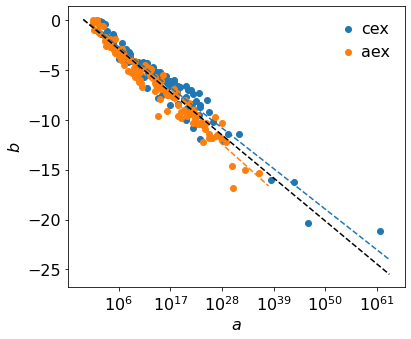

In [431]:
fig, ax = plt.subplots()
params = {'font.weight':'normal', 'font.size':16}
plt.rcParams.update(params)
fig.set_size_inches(6, 5, forward=True)
fig.patch.set_alpha(1.0)
ax.set_xlabel('$a$')
ax.set_ylabel('$b$')
ax.set_xscale('log')

iex_type_list = ['cex', 'aex']
temp = []

for iex_type in iex_type_list:
    df = df_three_params[df_three_params.iex_type==iex_type]
    ax.scatter(df.a_yam, df.b_yam, label=iex_type)

    fit = optimize.least_squares(get_meta_residuals, x0=[1, 1], args=(df.a_yam, df.b_yam))
    c, d = fit.x[0], fit.x[1]
    temp.append([iex_type, c, d])
    a_vals_new = np.logspace(np.log10(min(df.a_yam))-2.0, np.log10(max(df.a_yam))+2.0)
    b_vals_new = [meta_correlation(a, c, d) for a in a_vals_new]
    ax.plot(a_vals_new, b_vals_new, linestyle='--')

fit = optimize.least_squares(get_meta_residuals, x0=[1, 1], args=(df_three_params.a_yam, df_three_params.b_yam))
c, d = fit.x[0], fit.x[1]
temp.append(['both', c, d])
a_vals_new = np.logspace(np.log10(min(df_three_params.a_yam))-2.0, np.log10(max(df_three_params.a_yam))+2.0)
b_vals_new = [meta_correlation(a, c, d) for a in a_vals_new]
ax.plot(a_vals_new, b_vals_new, linestyle='--', color='black')

df_ab_params = pd.DataFrame(temp, columns=['iex_type', 'c', 'd'])
    
ax.legend(loc='best', handlelength=0.1, frameon=False)
plt.tight_layout()
fig.savefig(f'./images/elution_window_work/three_param_ab.png', dpi=300, 
            bbox='tight', transparent=False)

In [352]:
df_ab_params

,iex_type,c,d
0,cex,-0.160520,-0.485725
1,aex,-0.183754,-0.591633
2,both,-0.169993,-0.579790


/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:23: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later


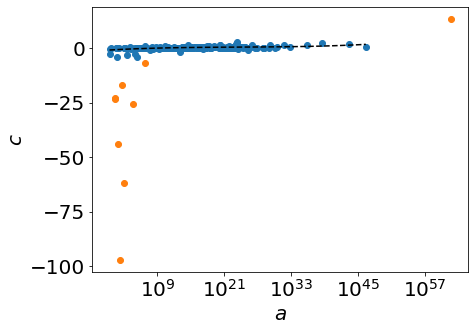

In [437]:
params = {'font.weight':'normal', 'font.size':20}
plt.rcParams.update(params)
fig, ax = plt.subplots()
fig.set_size_inches(7, 5, forward=True)
fig.patch.set_alpha(1.0)
ax.set_xlabel('$a$')
ax.set_ylabel('$c$')
ax.set_xscale('log')

df = df_three_params[abs(df_three_params.c_yam) < 5].copy()
df.sort_values(by=['a_yam'], inplace=True)
ax.scatter(df['a_yam'], df['c_yam'])

spl = interpolate.UnivariateSpline(df.log_a_yam, df.c_yam, k=3)
a_vals_new = np.logspace(np.log10(min(df.a_yam)), np.log10(max(df.a_yam)))
plt.plot(a_vals_new, spl(np.log(a_vals_new)), '--', color='k')

df = df_three_params[abs(df_three_params.c_yam) > 5].copy()
ax.scatter(df['a_yam'], df['c_yam'])

plt.tight_layout()
fig.savefig(f'./images/elution_window_work/three_param_ca.png', dpi=300, 
            bbox='tight', transparent=False)

/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:23: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later


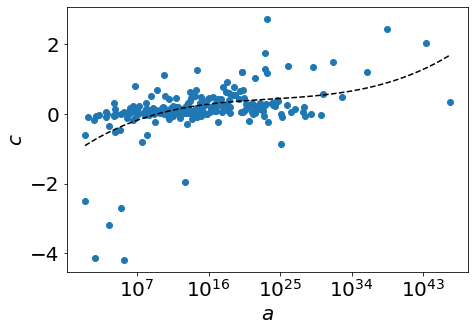

In [433]:
params = {'font.weight':'normal', 'font.size':20}
plt.rcParams.update(params)
fig, ax = plt.subplots()
fig.set_size_inches(7, 5, forward=True)
fig.patch.set_alpha(1.0)
ax.set_xlabel('$a$')
ax.set_ylabel('$c$')
ax.set_xscale('log')

df = df_three_params[abs(df_three_params.c_yam) < 5].copy()
df.sort_values(by=['a_yam'], inplace=True)
ax.scatter(df['a_yam'], df['c_yam'])

spl = interpolate.UnivariateSpline(df.log_a_yam, df.c_yam, k=3)
a_vals_new = np.logspace(np.log10(min(df.a_yam)), np.log10(max(df.a_yam)))
plt.plot(a_vals_new, spl(np.log(a_vals_new)), '--', color='k')

# df = df_three_params[abs(df_three_params.c_yam) > 15].copy()
# ax.scatter(df['a_yam'], df['c_yam'])

plt.tight_layout()
fig.savefig(f'./images/elution_window_work/three_param_ca_zoomed.png', dpi=300, 
            bbox='tight', transparent=False)

/home/chase/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox" which is no longer supported as of 3.3 and will become an error two minor releases later


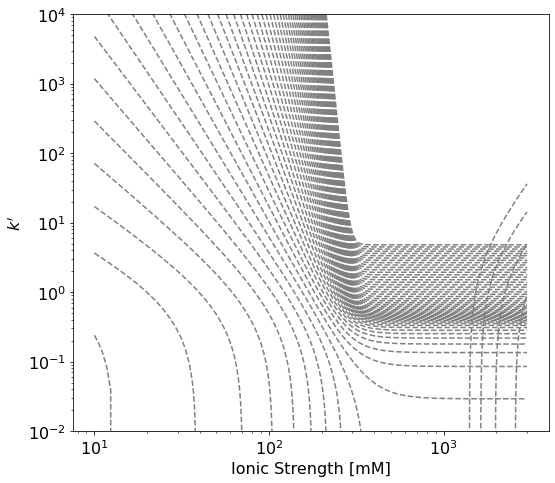

In [439]:
fig, ax = plt.subplots()
params = {'font.weight':'normal', 'font.size':16}
plt.rcParams.update(params)
fig.set_size_inches(8, 7, forward=True)
fig.patch.set_alpha(1.0)
ax.set_ylabel("$k'$")
ax.set_xlabel('Ionic Strength [mM]')

c = df_ab_params.loc[df_ab_params.iex_type == 'both', 'c'].iloc[0]
d = df_ab_params.loc[df_ab_params.iex_type == 'both', 'd'].iloc[0]
    
a_vals = np.logspace(-10, 60, 71)
tis_new = np.linspace(10, 3e3, 5000)

for a_yam in a_vals:
    b_yam = meta_correlation(a_yam, c, d)
    c_yam = spl(np.log(a_yam))
    k = [(a_yam*tis**b_yam + c_yam) for tis in tis_new]
    ax.loglog(tis_new, k, '--', color='grey')
    
ax.set_ylim(1e-2, 1e4)

plt.tight_layout()
fig.savefig(f'./images/elution_window_work/three_param_form.png', dpi=300, 
            bbox='tight', transparent=False)

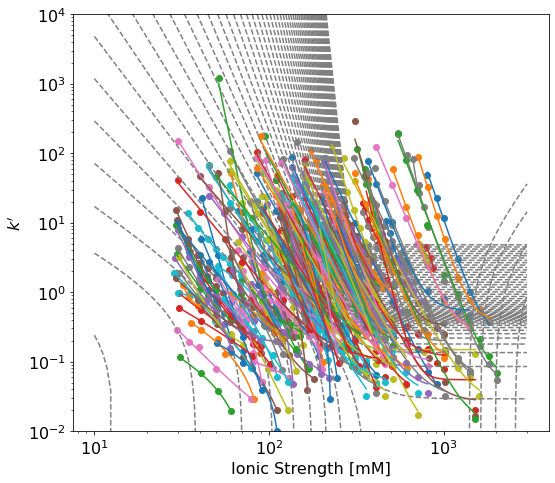

In [442]:
fig, ax = plt.subplots()
params = {'font.weight':'normal', 'font.size':16}
plt.rcParams.update(params)
fig.set_size_inches(8, 7, forward=True)
fig.patch.set_alpha(1.0)
ax.set_ylabel("$k'$")
ax.set_xlabel('Ionic Strength [mM]')

c = df_ab_params.loc[df_ab_params.iex_type == 'both', 'c'].iloc[0]
d = df_ab_params.loc[df_ab_params.iex_type == 'both', 'd'].iloc[0]
    
a_vals = np.logspace(-10, 60, 71)
tis_new = np.linspace(10, 3e3, 5000)

for a_yam in a_vals:
    b_yam = meta_correlation(a_yam, c, d)
    c_yam = spl(np.log(a_yam))
    k = [(a_yam*tis**b_yam + c_yam) for tis in tis_new]
    ax.loglog(tis_new, k, '--', color='grey')
    
combos = set(zip(df_three_params.resin, df_three_params.data_set, df_three_params.protein, df_three_params.pH))
df = df_all_k
for (resin, data_set, protein, pH) in combos:
    df_sub = df[(df.data_set==data_set) & (df.protein==protein) & (df.pH==pH) & (df.resin==resin)]
    ax.scatter(df_sub.tis_mM, df_sub.kprime)

    df_params = df_three_params[(df_three_params.protein==protein) &\
                        (df_three_params.pH==pH) &\
                        (df_three_params.resin==resin) &\
                        (df_three_params.data_set==data_set)].copy()
    df_params.reset_index(inplace=True, drop=True)
    a_yam, b_yam, c_yam = df_params.at[0, 'a_yam'], df_params.at[0, 'b_yam'], df_params.at[0, 'c_yam']

    tis_vals = np.linspace(min(df_sub.tis_mM), max(df_sub.tis_mM))
    k = [(a_yam*tis**b_yam + c_yam) for tis in tis_vals]
    ax.loglog(tis_vals, k)  

ax.set_ylim(1e-2, 1e4)
plt.tight_layout()
fig.savefig('./images/elution_window_work/three_param_all.png', dpi=300)

# Illustration of noise problem

In [9]:
df_all_k = pd.read_csv('./lit_data/all_kprime.csv')
df_all_k.fillna(0.0, inplace=True)

df_2_fit_parms = pd.read_csv('./lit_data/two_params_all_data.csv')
resins = list(set(df_2_fit_parms.resin))
resins.sort()

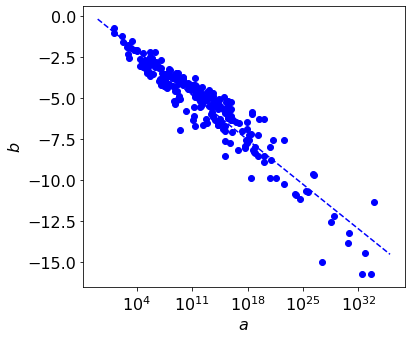

In [13]:
fig, ax = plt.subplots()
params = {'font.weight':'normal', 'font.size':16}
plt.rcParams.update(params)
fig.set_size_inches(6, 5, forward=True)
fig.patch.set_alpha(1.0)
ax.set_xlabel('$a$')
ax.set_ylabel('$b$')
ax.set_xscale('log')

df = df_2_fit_parms
ax.scatter(df.a, df.b, color='blue')

fit = optimize.least_squares(get_meta_residuals, x0=[1, 1], args=(df.a, df.b))
c, d = fit.x[0], fit.x[1]
a_vals_new = np.logspace(np.log10(min(df.a))-2.0, np.log10(max(df.a))+2.0)
b_vals_new = [meta_correlation(a, c, d) for a in a_vals_new]
ax.plot(a_vals_new, b_vals_new, linestyle='--', color='blue')

plt.tight_layout()
# fig.savefig('./images/kprime_lit_comparison/all_data_meta_no_iex_type_distinction.png', dpi=300)